# **REQUIRED PACKAGES**

In [1]:
import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
from skimage import img_as_float

# **TRAINING DATA**

In [2]:
print("TRAINING SENTENCES: ")
IMAGE_SET=os.listdir("../input/sentences/SENTENCES")
for image in IMAGE_SET[:10]:
    print(image)
print()

TRAINING SENTENCES: 
c03-016e-s02-04.png
c03-003d-s02-03.png
g06-050p-s02-03.png
g06-011k-s05-02.png
p06-042-s01-00.png
a01-122u-s00-03.png
c03-081f-s00-01.png
a05-029-s01-02.png
a05-025-s02-00.png
g06-047c-s01-00.png



In [3]:
print("INPUT FILES: ")
Form_input=os.listdir("../input/iam-dataset-forms/FORMS/INPUT")
for file in Form_input:
    print(file)
print()

print("OUTPUT FILES: ")
Form_output=os.listdir("../input/iam-dataset-forms/FORMS/OUTPUT")
for file in Form_output:
    print(file)
print()

INPUT FILES: 
a01-000u.png

OUTPUT FILES: 
a01-000u.rtf



# **DISPLAY INPUT**

In [4]:
def show_image(image,cmap=None):
    print("DIMENSION : ",image.ndim)
    print("SHAPE : ",image.shape)
    print("SIZE(NO OF PIXELS) : ",image.size)
    plt.imshow(image,cmap=cmap,interpolation='bicubic')
    plt.xticks([])
    plt.yticks([])
    plt.show()
    return

# **LINE SEGMENTATION**

In [5]:
def Segmenting_Lines(Image,Line_Segments,Line_Threshold):
    Sentences=[]
    print(Line_Segments)
    for index in range(1,len(Line_Segments),2):
        if(Line_Segments[index]>Line_Threshold):
            y=Line_Segments[index-1][0]-5
            h=Line_Segments[index-1][1]-Line_Segments[index-1][0]+10
            Sentences.append(Image[y:y+h])
    y=Line_Segments[-1][0]-5
    h=Line_Segments[-1][1]-Line_Segments[-1][0]+10
    Sentences.append(Image[y:y+h])
    
    return Sentences

In [6]:
def Evaluating_Threshold(Image,Line_intensity):
    Line_Segments=[]
    Line_Seperation=0
    Start_flag=0
    Zero_count=0
    Start_index=0
    End_index=0
    Set_flag=0
    for line in range(len(Line_intensity)):
        if(Line_intensity[line]==0):
            Zero_count+=1
            if(Set_flag==0):
                End_index=line
            Set_flag=1
        else:
            if(Set_flag==1 and Start_flag==1):
                Set_flag=0
                Line_Segments.append([Start_index,End_index])
                Start_index=line
                Line_Segments.append(Zero_count)
                Line_Seperation=Line_Seperation+(Zero_count**2)
                Zero_count=0
            if(Start_flag==0):
                Start_flag=1
                Set_flag=0
                Start_index=line
                Zero_count=0
    Line_Segments.append([Start_index,End_index])
    Line_Threshold=math.sqrt(Line_Seperation)/6
    print("LINE THRESHOLD : ",Line_Threshold)
    print("LINE SEGMENTS : ",Line_Segments)
    
    return Segmenting_Lines(Image,Line_Segments,Line_Threshold)

In [7]:
def Line_Segmentation(Image):
    Sentences=[]
    Line_intensity=[0 for line in range(len(Image))]
    for line in range(len(Image)):
        count=0
        for pixel in range(len(Image[0])):
            if(Image[line][pixel]<128):
                count+=1
        Line_intensity[line]=count
    print("LINE INTENSITY: ")
    print(Line_intensity)
    plt.plot(Line_intensity)
    plt.xticks([])
    plt.show()
    
    return Evaluating_Threshold(Image,Line_intensity)
    

# **PRE-PROCESSING**

In [8]:
def sort_Images(Dimensions):
    return Dimensions[0][0]

In [9]:
def PrepareImage(image,req_height):
    if image.ndim == 3:
        image=cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    height=image.shape[0]
    factor=req_height/height
    print("Resized by factor : ",factor)
    return cv2.resize(image,dsize=None,fx=factor,fy=factor)

In [10]:
def createKernelFilter(kernelSize,Sigma,Theta):
    halfSize=kernelSize//2
    
    kernel=np.zeros([kernelSize,kernelSize])
    sigmaX=Sigma
    sigmaY=Sigma*Theta
    
    for i in range(kernelSize):
        for j in range(kernelSize):
            x=i-halfSize
            y=j-halfSize
            
            expTerm=np.exp(-((x**2)/(2*(sigmaX**2)))-((y**2)/(2*(sigmaY**2))))
            kernel[i,j]=(1/(2*math.pi*sigmaX*sigmaY))*expTerm
    
    return kernel

In [11]:
def Pre_Processing_Sentence(sentence):
    
    print("RESIZED SENTENCE: ")
    Updated_sentence=PrepareImage(sentence,50)
    show_image(Updated_sentence,cmap='gray')

    print("BLURRED SENTENCE: ")
    blurred_sentence=cv2.GaussianBlur(sentence,(5,5),0)
    show_image(blurred_sentence,cmap='gray')

    print("FILTERED SENTENCE: ")
    kernelSize=25
    Sigma=11
    Theta=7
    minArea=150
    kernel=createKernelFilter(kernelSize,Sigma,Theta)
    Filtered_sentence=cv2.filter2D(sentence,-1,kernel,borderType=cv2.BORDER_REPLICATE)
    show_image(Filtered_sentence,cmap='gray')

    print("THRES SENTENCE: ")
    Thres_Value,Thres_sentence=cv2.threshold(Filtered_sentence,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    Thres_sentence=255-Thres_sentence
    show_image(Thres_sentence,cmap='gray')

    cv2.__version__
    components,hierarchy=cv2.findContours(Thres_sentence,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    print('NO OF COMPONENTS : ',len(components))
    
    print("CONTOURED SENTENCE: ")
    show_image(cv2.drawContours(sentence,components,-1,(255,0,0),5))
    
    Words=[]
    for contour in components:
        if(cv2.contourArea(contour) >= minArea):
            (x,y,w,h)=cv2.boundingRect(contour)
            Words.append([(x,y,w,h),sentence[y:y+h,x:x+w]])

    print('NO OF COMPONENTS AFTER FILTERING: ',len(Words))
    
    Words.sort(key=sort_Images)
    
    return Words

# **WORD SEGMENTATION**

In [12]:
def combine_Words(Word1,Word2,sentence):
    WORD=[[]]
    WORD[0].append(Word1[0][0])                                                                     # X-AXIS POSITION
    WORD[0].append(min(Word1[0][1],Word2[0][1]))                                                    # Y-AXIS POSITION
    WORD[0].append((Word2[0][0]-Word1[0][0])+Word2[0][2])                                           # WIDTH
    WORD[0].append(max(Word1[0][1]+Word1[0][3],Word2[0][1]+Word2[0][3])-WORD[0][1])                 # HEIGHT
    
    WORD.append(sentence[WORD[0][1]:WORD[0][1]+WORD[0][3],WORD[0][0]:WORD[0][0]+WORD[0][2]])
    return WORD

In [13]:
def Word_Segmentation(Words,sentence):
    Final_Words=[]
    word=[]
    final_flag=0
    
    Word_Seperation_sum=0
    Seperation=[]
    for word_no in range(len(Words)-1):
        distance=Words[word_no+1][0][0]-(Words[word_no][0][0]+Words[word_no][0][2])
        Seperation.append(distance)
        Word_Seperation_sum=Word_Seperation_sum+distance

    Word_Average_Threshold=math.sqrt(Word_Seperation_sum/(len(Words)-1))

    print('WORDS SEPERATION : ',Seperation)
    print('AVERAGE THRESHOLD FOR WORD SEPERATION : ',Word_Average_Threshold)
    
    for index in range(len(Seperation)):
        if(len(word)==0):
            word=Words[index]
        if(Seperation[index]>Word_Average_Threshold):
            Final_Words.append(word)
            word=[]
            final_flag=0
        else:
            word=combine_Words(word,Words[index+1],sentence)
            final_flag=1

    if(final_flag==0):
        Final_Words.append(Words[-1])
    else:
        Final_Words.append(word)
        
    return Final_Words

# **CHARACTER SEGMENTATION**

In [14]:
def Character_Segmentation(Character_Segments,Character_Threshold,Pre_Processed_Binary_Image):
    SEGMENTED_CHARACTERS=[]
    for index in range(1,len(Character_Segments),2):
        if(Character_Segments[index]>Character_Threshold):
            x=Character_Segments[index-1][0]
            y=0
            Touching=0
            w=Character_Segments[index-1][1]-Character_Segments[index-1][0]
            h=len(Pre_Processed_Binary_Image)
            if(w>0.675*h):
                Touching=1
            SEGMENTED_CHARACTERS.append([[x,y,w,h],Pre_Processed_Binary_Image[y:y+h,x:x+w],Touching])
    x=Character_Segments[-1][0]
    y=0
    Touching=0
    w=Character_Segments[-1][1]-Character_Segments[-1][0]
    h=len(Pre_Processed_Binary_Image)
    if(w>0.675*h):
        Touching=1
    SEGMENTED_CHARACTERS.append([[x,y,w,h],Pre_Processed_Binary_Image[y:y+h,x:x+w],Touching])
    
    return SEGMENTED_CHARACTERS

In [15]:
def Evaluating_VPP_Intensity(Pre_Processed_Binary_Image):
    VPP_Intensity=[0 for col in range(len(Pre_Processed_Binary_Image[0]))]
    for row in range(len(Pre_Processed_Binary_Image)):
        for col in range(len(Pre_Processed_Binary_Image[row])):
            if(Pre_Processed_Binary_Image[row][col]==0):
                VPP_Intensity[col]+=1
    print(VPP_Intensity)
    plt.plot(VPP_Intensity)
    plt.xticks([])
    plt.show()
    
    return VPP_Intensity

In [16]:
def First_Level_Character_Segmentation_Under_VPP(Pre_Processed_Binary_Image):
    
    VPP_Intensity=Evaluating_VPP_Intensity(Pre_Processed_Binary_Image)
    
    Character_Segments=[]
    Character_Seperation=0
    Start_flag=0
    Zero_count=0
    s=Start_index=0
    End_index=0
    Set_flag=0
    for col in range(len(VPP_Intensity)):
        if(VPP_Intensity[col]==0):
            Zero_count+=1
            if(Set_flag==0):
                End_index=col
            Set_flag=1
        else:
            if(Set_flag==1 and Start_flag==1):
                Set_flag=0
                Character_Segments.append([Start_index,End_index])
                Start_index=col
                Character_Segments.append(Zero_count)
                Character_Seperation=Character_Seperation+(Zero_count**2)
                Zero_count=0
            if(Start_flag==0):
                Start_flag=1
                Set_flag=0
                Start_index=col
                Zero_count=0
    Character_Segments.append([Start_index,End_index])
    Character_Threshold=math.sqrt(Character_Seperation)/3
    print("CHARACTER THRESHOLD : ",Character_Threshold)
    print("CHARACTER SEGMENTS : ",Character_Segments)
    
    return Character_Segmentation(Character_Segments,Character_Threshold,Pre_Processed_Binary_Image)

In [17]:
def Generate_VPP_AND_TDP_Average(SEGMENT):
    IMAGE=SEGMENT[1]
    show_image(IMAGE,cmap='gray')
    VPP_Intensity=[0 for col in range(len(IMAGE[0]))]
    for row in range(len(IMAGE)):
        for col in range(len(IMAGE[row])):
            if(IMAGE[row][col]==0):
                VPP_Intensity[col]+=1
    print(VPP_Intensity)
    plt.plot(VPP_Intensity)
    plt.xticks([])
    plt.show()
    
    TDP_Intensity=[0 for col in range(len(IMAGE[0]))]
    for col in range(len(IMAGE[0])):
        for row in range(len(IMAGE)):
            if(IMAGE[row][col]==0):
                TDP_Intensity[col]=len(IMAGE)-row
                break
    print(TDP_Intensity)
    plt.plot(TDP_Intensity)
    plt.xticks([])
    plt.show()
    
    Average_Intensity=np.add(TDP_Intensity,VPP_Intensity)
    
    print(Average_Intensity)
    plt.plot(Average_Intensity)
    plt.xticks([])
    plt.show()
    
    return Average_Intensity

In [18]:
def Required_Further_Segmentation(IMAGE_SEGMENT,Average_Intensity,FINAL_SEGMENTED_CHARACTERS):
    
    Index_Limit=int(0.4*IMAGE_SEGMENT[0][3])
    min_value=Average_Intensity[Index_Limit]
    Break_Point=Index_Limit
    for col in range(Index_Limit,len(Average_Intensity)-Index_Limit):
        if(Average_Intensity[col]<min_value):
            min_value=Average_Intensity[col]
            Break_Point=col
    
    x_point=0
    y_point=IMAGE_SEGMENT[0][1]
    height=IMAGE_SEGMENT[0][3]
    width=Break_Point-x_point
    if(width>0.8*height):
        Required_Further_Segmentation([[x_point,y_point,width,height],IMAGE_SEGMENT[1][y_point:y_point+height,x_point:x_point+width],1],Average_Intensity[x_point:x_point+width],FINAL_SEGMENTED_CHARACTERS)
    else:
        FINAL_SEGMENTED_CHARACTERS.append([[x_point,y_point,width,height],IMAGE_SEGMENT[1][y_point:y_point+height,x_point:x_point+width],0])
    
    
    x_point=Break_Point        
    width=IMAGE_SEGMENT[0][2]-x_point
    if(width>0.8*height):
        Required_Further_Segmentation([[x_point,y_point,width,height],IMAGE_SEGMENT[1][y_point:y_point+height,x_point:x_point+width],1],Average_Intensity[x_point:x_point+width],FINAL_SEGMENTED_CHARACTERS)
    else:
        FINAL_SEGMENTED_CHARACTERS.append([[x_point,y_point,width,height],IMAGE_SEGMENT[1][y_point:y_point+height,x_point:x_point+width],0])

In [19]:
def Touching_Character_Segmentation(SEGMENT,Average_Intensity,FINAL_SEGMENTED_CHARACTERS):
    
    Average_Threshold=20
    
    Touching_Characters_Breakpoints=[]
    col=0
    while(col<len(Average_Intensity)):
        if(col==0):
            while(col<len(Average_Intensity) and Average_Intensity[col]<Average_Threshold):
                col+=1
        if(col<len(Average_Intensity) and Average_Intensity[col]<Average_Threshold):
            min_value=Average_Intensity[col]
            min_point=col
            while(col<len(Average_Intensity) and Average_Intensity[col]<Average_Threshold):
                if(Average_Intensity[col]<min_value):
                    min_value=Average_Intensity[col]
                    min_point=col
                col+=1
            if(col<len(Average_Intensity)):
                Touching_Characters_Breakpoints.append(min_point)
        col+=1
    
    print("CHARACTERS BREAK POINTS : ",Touching_Characters_Breakpoints)
    
    if(len(Touching_Characters_Breakpoints)==0):
        Required_Further_Segmentation(SEGMENT,Average_Intensity,FINAL_SEGMENTED_CHARACTERS)
    else:
        x_point=0
        y_point=SEGMENT[0][1]
        height=SEGMENT[0][3]
        for Break_Point in Touching_Characters_Breakpoints:
            width=Break_Point-x_point
            if(width>0.8*height):
                Required_Further_Segmentation([[x_point,y_point,width,height],SEGMENT[1][y_point:y_point+height,x_point:x_point+width],1],Average_Intensity[x_point:x_point+width],FINAL_SEGMENTED_CHARACTERS)
            else:
                FINAL_SEGMENTED_CHARACTERS.append([[x_point,y_point,width,height],SEGMENT[1][y_point:y_point+height,x_point:x_point+width],0])
            x_point=Break_Point
            
        width=SEGMENT[0][2]-x_point
        if(width>0.8*height):
            Required_Further_Segmentation([[x_point,y_point,width,height],SEGMENT[1][y_point:y_point+height,x_point:x_point+width],1],Average_Intensity[x_point:x_point+width],FINAL_SEGMENTED_CHARACTERS)
        else:
            FINAL_SEGMENTED_CHARACTERS.append([[x_point,y_point,width,height],SEGMENT[1][y_point:y_point+height,x_point:x_point+width],0])


# **PROCESSING THE INPUT**

DIMENSION :  2
SHAPE :  (672, 1150)
SIZE(NO OF PIXELS) :  772800


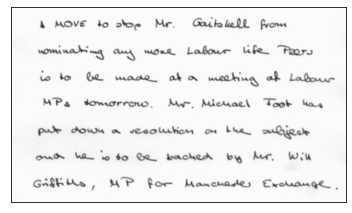

In [20]:
Input_image=cv2.imread('../input/iam-dataset-forms/FORMS/INPUT/a01-000u.png',cv2.IMREAD_GRAYSCALE)
show_image(Input_image,cmap='gray')

LINE INTENSITY: 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 4, 9, 17, 21, 20, 26, 36, 44, 46, 44, 56, 64, 76, 80, 95, 107, 119, 135, 165, 217, 239, 236, 215, 210, 210, 206, 225, 222, 220, 218, 206, 184, 123, 72, 30, 18, 9, 8, 9, 8, 6, 4, 3, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 9, 34, 46, 52, 40, 38, 40, 34, 30, 26, 28, 35, 42, 59, 98, 143, 192, 233, 270, 278, 254, 249, 256, 275, 297, 304, 322, 306, 237, 158, 114, 88, 71, 34, 22, 9, 9, 11, 16, 17, 18, 20, 19, 20, 22, 24, 23, 23, 21, 18, 14, 11, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 8, 10, 12, 14, 17, 24, 30, 32, 32, 38, 36, 41, 42, 42, 43, 55, 76, 113, 137, 147, 164, 190, 220, 237, 261, 269, 274, 291, 322, 346, 322, 293, 193, 124, 76, 71, 56, 27, 14, 9, 9, 9, 10, 10, 9, 10, 

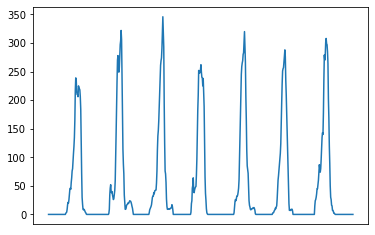

LINE THRESHOLD :  18.396859635395504
LINE SEGMENTS :  [[38, 84], 49, [133, 187], 35, [222, 275], 39, [314, 351], 58, [409, 457], 37, [494, 539], 48, [587, 632]]
[[38, 84], 49, [133, 187], 35, [222, 275], 39, [314, 351], 58, [409, 457], 37, [494, 539], 48, [587, 632]]
DIMENSION :  2
SHAPE :  (56, 1150)
SIZE(NO OF PIXELS) :  64400


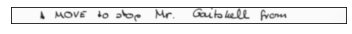

DIMENSION :  2
SHAPE :  (64, 1150)
SIZE(NO OF PIXELS) :  73600


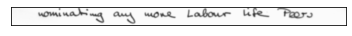

DIMENSION :  2
SHAPE :  (63, 1150)
SIZE(NO OF PIXELS) :  72450


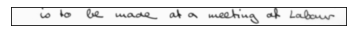

DIMENSION :  2
SHAPE :  (47, 1150)
SIZE(NO OF PIXELS) :  54050


DIMENSION :  2
SHAPE :  (58, 1150)
SIZE(NO OF PIXELS) :  66700


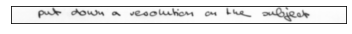

DIMENSION :  2
SHAPE :  (55, 1150)
SIZE(NO OF PIXELS) :  63250


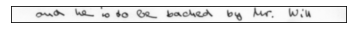

DIMENSION :  2
SHAPE :  (55, 1150)
SIZE(NO OF PIXELS) :  63250


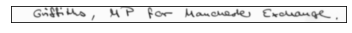

In [21]:
SENTENCES=Line_Segmentation(Input_image)
for sentence in SENTENCES:
    show_image(sentence,cmap='gray')

RESIZED SENTENCE: 
Resized by factor :  0.8928571428571429
DIMENSION :  2
SHAPE :  (50, 1027)
SIZE(NO OF PIXELS) :  51350


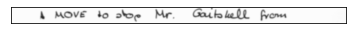

BLURRED SENTENCE: 
DIMENSION :  2
SHAPE :  (56, 1150)
SIZE(NO OF PIXELS) :  64400


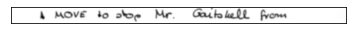

FILTERED SENTENCE: 
DIMENSION :  2
SHAPE :  (56, 1150)
SIZE(NO OF PIXELS) :  64400


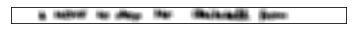

THRES SENTENCE: 
DIMENSION :  2
SHAPE :  (56, 1150)
SIZE(NO OF PIXELS) :  64400


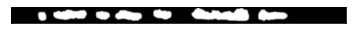

NO OF COMPONENTS :  7
CONTOURED SENTENCE: 
DIMENSION :  2
SHAPE :  (56, 1150)
SIZE(NO OF PIXELS) :  64400


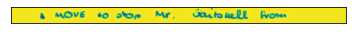

NO OF COMPONENTS AFTER FILTERING:  7
WORDS SEPERATION :  [24, 32, 19, 40, 69, 32]
AVERAGE THRESHOLD FOR WORD SEPERATION :  6.0
RESIZED SENTENCE: 
Resized by factor :  0.78125
DIMENSION :  2
SHAPE :  (50, 898)
SIZE(NO OF PIXELS) :  44900


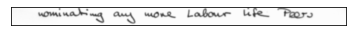

BLURRED SENTENCE: 
DIMENSION :  2
SHAPE :  (64, 1150)
SIZE(NO OF PIXELS) :  73600


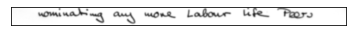

FILTERED SENTENCE: 
DIMENSION :  2
SHAPE :  (64, 1150)
SIZE(NO OF PIXELS) :  73600


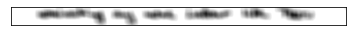

THRES SENTENCE: 
DIMENSION :  2
SHAPE :  (64, 1150)
SIZE(NO OF PIXELS) :  73600


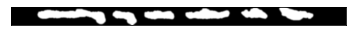

NO OF COMPONENTS :  6
CONTOURED SENTENCE: 
DIMENSION :  2
SHAPE :  (64, 1150)
SIZE(NO OF PIXELS) :  73600


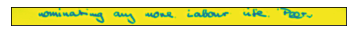

NO OF COMPONENTS AFTER FILTERING:  6
WORDS SEPERATION :  [24, 26, 38, 39, 40]
AVERAGE THRESHOLD FOR WORD SEPERATION :  5.779273310719955
RESIZED SENTENCE: 
Resized by factor :  0.7936507936507936
DIMENSION :  2
SHAPE :  (50, 913)
SIZE(NO OF PIXELS) :  45650


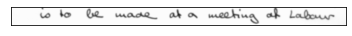

BLURRED SENTENCE: 
DIMENSION :  2
SHAPE :  (63, 1150)
SIZE(NO OF PIXELS) :  72450


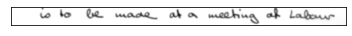

FILTERED SENTENCE: 
DIMENSION :  2
SHAPE :  (63, 1150)
SIZE(NO OF PIXELS) :  72450


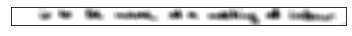

THRES SENTENCE: 
DIMENSION :  2
SHAPE :  (63, 1150)
SIZE(NO OF PIXELS) :  72450


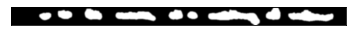

NO OF COMPONENTS :  9
CONTOURED SENTENCE: 
DIMENSION :  2
SHAPE :  (63, 1150)
SIZE(NO OF PIXELS) :  72450


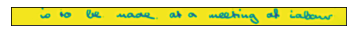

NO OF COMPONENTS AFTER FILTERING:  9
WORDS SEPERATION :  [23, 43, 46, 44, 15, 36, 21, 27]
AVERAGE THRESHOLD FOR WORD SEPERATION :  5.645794895318107
RESIZED SENTENCE: 
Resized by factor :  1.0638297872340425
DIMENSION :  2
SHAPE :  (50, 1223)
SIZE(NO OF PIXELS) :  61150


BLURRED SENTENCE: 
DIMENSION :  2
SHAPE :  (47, 1150)
SIZE(NO OF PIXELS) :  54050


FILTERED SENTENCE: 
DIMENSION :  2
SHAPE :  (47, 1150)
SIZE(NO OF PIXELS) :  54050


THRES SENTENCE: 
DIMENSION :  2
SHAPE :  (47, 1150)
SIZE(NO OF PIXELS) :  54050


NO OF COMPONENTS :  6
CONTOURED SENTENCE: 
DIMENSION :  2
SHAPE :  (47, 1150)
SIZE(NO OF PIXELS) :  54050


NO OF COMPONENTS AFTER FILTERING:  6
WORDS SEPERATION :  [40, 60, 36, 47, 33]
AVERAGE THRESHOLD FOR WORD SEPERATION :  6.572670690061994
RESIZED SENTENCE: 
Resized by factor :  0.8620689655172413
DIMENSION :  2
SHAPE :  (50, 991)
SIZE(NO OF PIXELS) :  49550


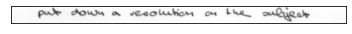

BLURRED SENTENCE: 
DIMENSION :  2
SHAPE :  (58, 1150)
SIZE(NO OF PIXELS) :  66700


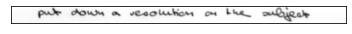

FILTERED SENTENCE: 
DIMENSION :  2
SHAPE :  (58, 1150)
SIZE(NO OF PIXELS) :  66700


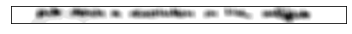

THRES SENTENCE: 
DIMENSION :  2
SHAPE :  (58, 1150)
SIZE(NO OF PIXELS) :  66700


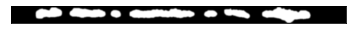

NO OF COMPONENTS :  7
CONTOURED SENTENCE: 
DIMENSION :  2
SHAPE :  (58, 1150)
SIZE(NO OF PIXELS) :  66700


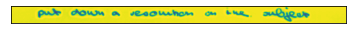

NO OF COMPONENTS AFTER FILTERING:  7
WORDS SEPERATION :  [26, 17, 30, 33, 24, 42]
AVERAGE THRESHOLD FOR WORD SEPERATION :  5.354126134736337
RESIZED SENTENCE: 
Resized by factor :  0.9090909090909091
DIMENSION :  2
SHAPE :  (50, 1045)
SIZE(NO OF PIXELS) :  52250


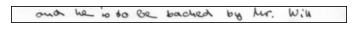

BLURRED SENTENCE: 
DIMENSION :  2
SHAPE :  (55, 1150)
SIZE(NO OF PIXELS) :  63250


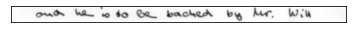

FILTERED SENTENCE: 
DIMENSION :  2
SHAPE :  (55, 1150)
SIZE(NO OF PIXELS) :  63250


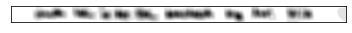

THRES SENTENCE: 
DIMENSION :  2
SHAPE :  (55, 1150)
SIZE(NO OF PIXELS) :  63250


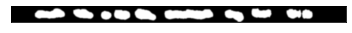

NO OF COMPONENTS :  10
CONTOURED SENTENCE: 
DIMENSION :  2
SHAPE :  (55, 1150)
SIZE(NO OF PIXELS) :  63250


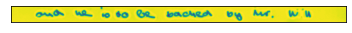

NO OF COMPONENTS AFTER FILTERING:  10
WORDS SEPERATION :  [29, 26, 9, 16, 29, 40, 27, 52, 2]
AVERAGE THRESHOLD FOR WORD SEPERATION :  5.055250296034367
RESIZED SENTENCE: 
Resized by factor :  0.9090909090909091
DIMENSION :  2
SHAPE :  (50, 1045)
SIZE(NO OF PIXELS) :  52250


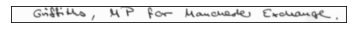

BLURRED SENTENCE: 
DIMENSION :  2
SHAPE :  (55, 1150)
SIZE(NO OF PIXELS) :  63250


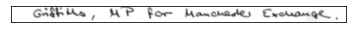

FILTERED SENTENCE: 
DIMENSION :  2
SHAPE :  (55, 1150)
SIZE(NO OF PIXELS) :  63250


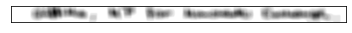

THRES SENTENCE: 
DIMENSION :  2
SHAPE :  (55, 1150)
SIZE(NO OF PIXELS) :  63250


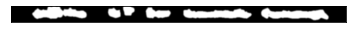

NO OF COMPONENTS :  6
CONTOURED SENTENCE: 
DIMENSION :  2
SHAPE :  (55, 1150)
SIZE(NO OF PIXELS) :  63250


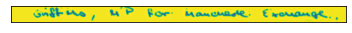

NO OF COMPONENTS AFTER FILTERING:  6
WORDS SEPERATION :  [73, 9, 39, 44, 33]
AVERAGE THRESHOLD FOR WORD SEPERATION :  6.29285308902091


In [22]:
WORDS=[]
for sentence in SENTENCES:
    
    Words=Pre_Processing_Sentence(sentence)
    WORDS.append(Word_Segmentation(Words,sentence))

MEAN GRAY INTENSITY BEFORE FILTER:  0.804656862745098
MEAN GRAY INTENSITY AFTER FILTER:  0.6547919167667067
DIMENSION :  2
SHAPE :  (28, 28)
SIZE(NO OF PIXELS) :  784


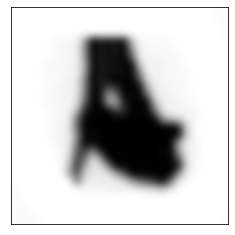

MEAN GRAY INTENSITY BEFORE FILTER:  0.8359350082744095
MEAN GRAY INTENSITY AFTER FILTER:  0.6860428263376962
DIMENSION :  2
SHAPE :  (34, 115)
SIZE(NO OF PIXELS) :  3910


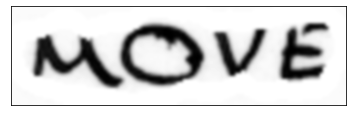

MEAN GRAY INTENSITY BEFORE FILTER:  0.8207500755254412
MEAN GRAY INTENSITY AFTER FILTER:  0.6731632931969558
DIMENSION :  2
SHAPE :  (29, 47)
SIZE(NO OF PIXELS) :  1363


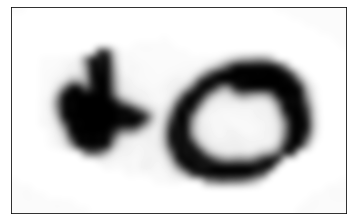

MEAN GRAY INTENSITY BEFORE FILTER:  0.8295330439868255
MEAN GRAY INTENSITY AFTER FILTER:  0.6803619909502262
DIMENSION :  2
SHAPE :  (35, 91)
SIZE(NO OF PIXELS) :  3185


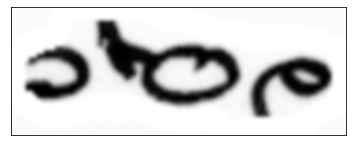

MEAN GRAY INTENSITY BEFORE FILTER:  0.8449101462216765
MEAN GRAY INTENSITY AFTER FILTER:  0.6930367972615992
DIMENSION :  2
SHAPE :  (34, 62)
SIZE(NO OF PIXELS) :  2108


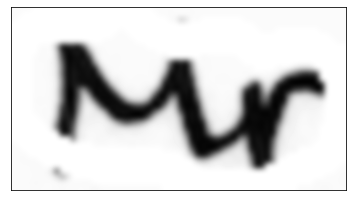

MEAN GRAY INTENSITY BEFORE FILTER:  0.8430259598070886
MEAN GRAY INTENSITY AFTER FILTER:  0.6909615715229332
DIMENSION :  2
SHAPE :  (44, 197)
SIZE(NO OF PIXELS) :  8668


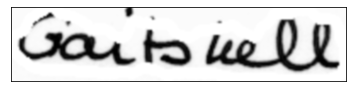

MEAN GRAY INTENSITY BEFORE FILTER:  0.8522978272390037
MEAN GRAY INTENSITY AFTER FILTER:  0.6998887122416535
DIMENSION :  2
SHAPE :  (37, 100)
SIZE(NO OF PIXELS) :  3700


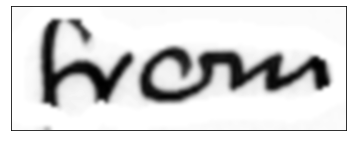

MEAN GRAY INTENSITY BEFORE FILTER:  0.8770279018260564
MEAN GRAY INTENSITY AFTER FILTER:  0.7243147770252732
DIMENSION :  2
SHAPE :  (51, 234)
SIZE(NO OF PIXELS) :  11934


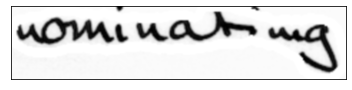

MEAN GRAY INTENSITY BEFORE FILTER:  0.8783486888731397
MEAN GRAY INTENSITY AFTER FILTER:  0.7252214741318216
DIMENSION :  2
SHAPE :  (48, 83)
SIZE(NO OF PIXELS) :  3984


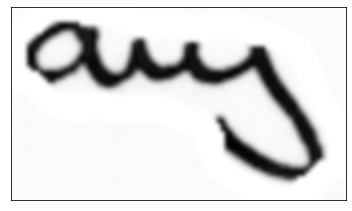

MEAN GRAY INTENSITY BEFORE FILTER:  0.8188133764832793
MEAN GRAY INTENSITY AFTER FILTER:  0.6686629862300907
DIMENSION :  2
SHAPE :  (30, 103)
SIZE(NO OF PIXELS) :  3090


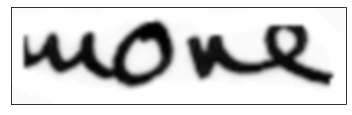

MEAN GRAY INTENSITY BEFORE FILTER:  0.8388609391124873
MEAN GRAY INTENSITY AFTER FILTER:  0.6862988762756564
DIMENSION :  2
SHAPE :  (36, 152)
SIZE(NO OF PIXELS) :  5472


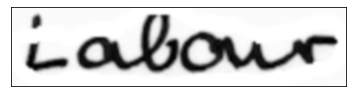

MEAN GRAY INTENSITY BEFORE FILTER:  0.8538898303604185
MEAN GRAY INTENSITY AFTER FILTER:  0.7016963958140429
DIMENSION :  2
SHAPE :  (37, 91)
SIZE(NO OF PIXELS) :  3367


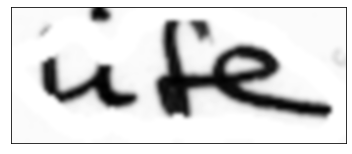

MEAN GRAY INTENSITY BEFORE FILTER:  0.8662266579663327
MEAN GRAY INTENSITY AFTER FILTER:  0.7114313119319376
DIMENSION :  2
SHAPE :  (47, 117)
SIZE(NO OF PIXELS) :  5499


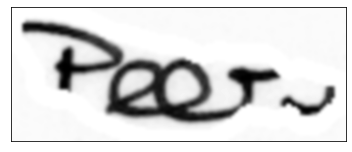

MEAN GRAY INTENSITY BEFORE FILTER:  0.8308751793400286
MEAN GRAY INTENSITY AFTER FILTER:  0.681794356767097
DIMENSION :  2
SHAPE :  (25, 41)
SIZE(NO OF PIXELS) :  1025


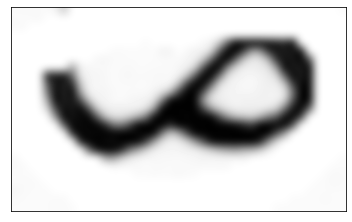

MEAN GRAY INTENSITY BEFORE FILTER:  0.8149526477257569
MEAN GRAY INTENSITY AFTER FILTER:  0.6657623049219688
DIMENSION :  2
SHAPE :  (30, 49)
SIZE(NO OF PIXELS) :  1470


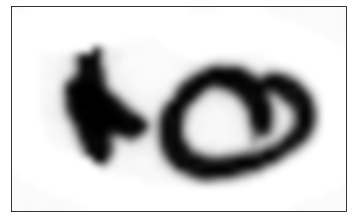

MEAN GRAY INTENSITY BEFORE FILTER:  0.8243084260731319
MEAN GRAY INTENSITY AFTER FILTER:  0.6708956014838366
DIMENSION :  2
SHAPE :  (37, 60)
SIZE(NO OF PIXELS) :  2220


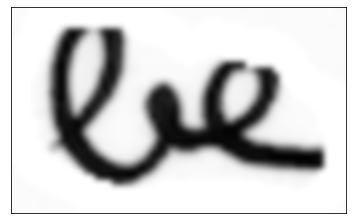

MEAN GRAY INTENSITY BEFORE FILTER:  0.8437704248366013
MEAN GRAY INTENSITY AFTER FILTER:  0.6921763995453253
DIMENSION :  2
SHAPE :  (32, 138)
SIZE(NO OF PIXELS) :  4416


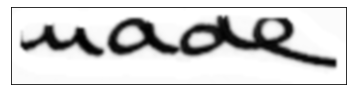

MEAN GRAY INTENSITY BEFORE FILTER:  0.8162804515745693
MEAN GRAY INTENSITY AFTER FILTER:  0.666443547115816
DIMENSION :  2
SHAPE :  (33, 49)
SIZE(NO OF PIXELS) :  1617


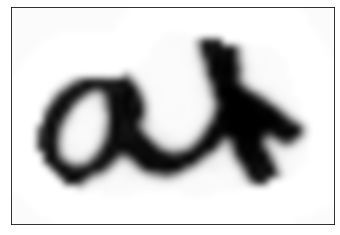

MEAN GRAY INTENSITY BEFORE FILTER:  0.8172549019607843
MEAN GRAY INTENSITY AFTER FILTER:  0.6653638344226579
DIMENSION :  2
SHAPE :  (25, 36)
SIZE(NO OF PIXELS) :  900


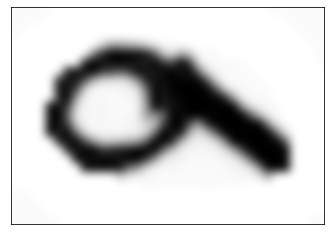

MEAN GRAY INTENSITY BEFORE FILTER:  0.8782562986421998
MEAN GRAY INTENSITY AFTER FILTER:  0.7247790397869572
DIMENSION :  2
SHAPE :  (51, 177)
SIZE(NO OF PIXELS) :  9027


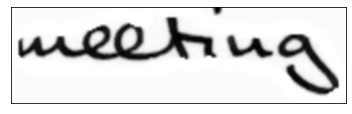

MEAN GRAY INTENSITY BEFORE FILTER:  0.8073017694882831
MEAN GRAY INTENSITY AFTER FILTER:  0.6550645624103301
DIMENSION :  2
SHAPE :  (41, 50)
SIZE(NO OF PIXELS) :  2050


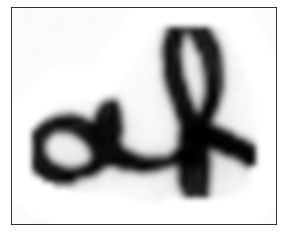

MEAN GRAY INTENSITY BEFORE FILTER:  0.8647058823529412
MEAN GRAY INTENSITY AFTER FILTER:  0.7088724657944672
DIMENSION :  2
SHAPE :  (38, 155)
SIZE(NO OF PIXELS) :  5890


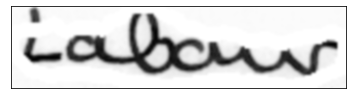

MEAN GRAY INTENSITY BEFORE FILTER:  0.8794460751110107
MEAN GRAY INTENSITY AFTER FILTER:  0.7267838090304986
DIMENSION :  2
SHAPE :  (43, 103)
SIZE(NO OF PIXELS) :  4429


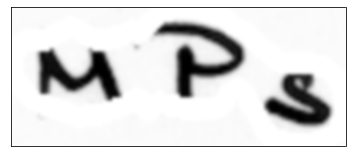

MEAN GRAY INTENSITY BEFORE FILTER:  0.8380421369678106
MEAN GRAY INTENSITY AFTER FILTER:  0.6859164009811477
DIMENSION :  2
SHAPE :  (34, 229)
SIZE(NO OF PIXELS) :  7786


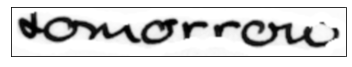

MEAN GRAY INTENSITY BEFORE FILTER:  0.8641479732388824
MEAN GRAY INTENSITY AFTER FILTER:  0.7098903473235023
DIMENSION :  2
SHAPE :  (33, 77)
SIZE(NO OF PIXELS) :  2541


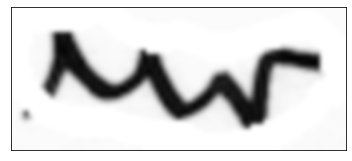

MEAN GRAY INTENSITY BEFORE FILTER:  0.846202380952381
MEAN GRAY INTENSITY AFTER FILTER:  0.6937745098039214
DIMENSION :  2
SHAPE :  (32, 175)
SIZE(NO OF PIXELS) :  5600


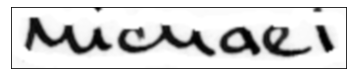

MEAN GRAY INTENSITY BEFORE FILTER:  0.8357718974114469
MEAN GRAY INTENSITY AFTER FILTER:  0.6840912251425393
DIMENSION :  2
SHAPE :  (42, 94)
SIZE(NO OF PIXELS) :  3948


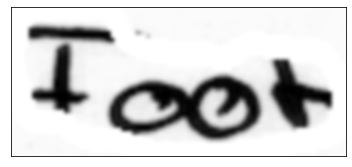

MEAN GRAY INTENSITY BEFORE FILTER:  0.8560864815134265
MEAN GRAY INTENSITY AFTER FILTER:  0.7008666223087474
DIMENSION :  2
SHAPE :  (31, 77)
SIZE(NO OF PIXELS) :  2387


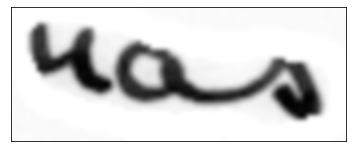

MEAN GRAY INTENSITY BEFORE FILTER:  0.8257069143446852
MEAN GRAY INTENSITY AFTER FILTER:  0.6712785231051486
DIMENSION :  2
SHAPE :  (38, 90)
SIZE(NO OF PIXELS) :  3420


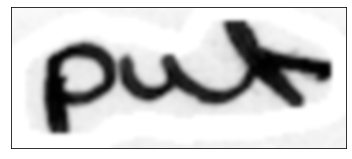

MEAN GRAY INTENSITY BEFORE FILTER:  0.8235610373181532
MEAN GRAY INTENSITY AFTER FILTER:  0.6709111992793207
DIMENSION :  2
SHAPE :  (33, 124)
SIZE(NO OF PIXELS) :  4092


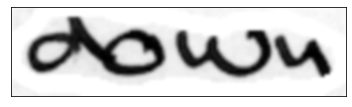

MEAN GRAY INTENSITY BEFORE FILTER:  0.8181426416720534
MEAN GRAY INTENSITY AFTER FILTER:  0.6662400344753285
DIMENSION :  2
SHAPE :  (26, 35)
SIZE(NO OF PIXELS) :  910


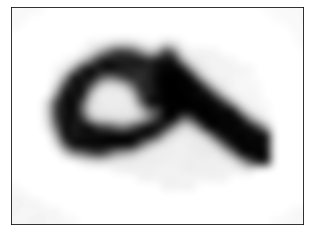

MEAN GRAY INTENSITY BEFORE FILTER:  0.8414277302169679
MEAN GRAY INTENSITY AFTER FILTER:  0.6888942178311739
DIMENSION :  2
SHAPE :  (33, 223)
SIZE(NO OF PIXELS) :  7359


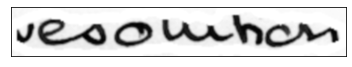

MEAN GRAY INTENSITY BEFORE FILTER:  0.8523398692810459
MEAN GRAY INTENSITY AFTER FILTER:  0.6991023965141612
DIMENSION :  2
SHAPE :  (25, 45)
SIZE(NO OF PIXELS) :  1125


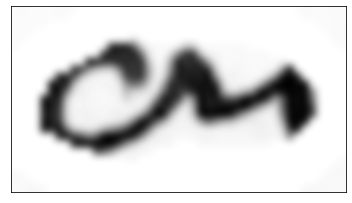

MEAN GRAY INTENSITY BEFORE FILTER:  0.8847326203208556
MEAN GRAY INTENSITY AFTER FILTER:  0.7303284950343775
DIMENSION :  2
SHAPE :  (35, 88)
SIZE(NO OF PIXELS) :  3080


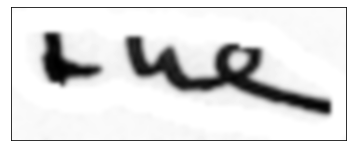

MEAN GRAY INTENSITY BEFORE FILTER:  0.8544771761853185
MEAN GRAY INTENSITY AFTER FILTER:  0.6991544424089254
DIMENSION :  2
SHAPE :  (53, 166)
SIZE(NO OF PIXELS) :  8798


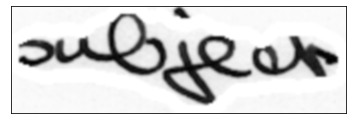

MEAN GRAY INTENSITY BEFORE FILTER:  0.834924920247593
MEAN GRAY INTENSITY AFTER FILTER:  0.6813687993585196
DIMENSION :  2
SHAPE :  (33, 103)
SIZE(NO OF PIXELS) :  3399


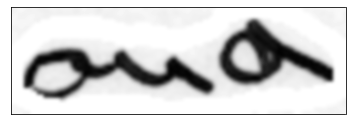

MEAN GRAY INTENSITY BEFORE FILTER:  0.8403683574879229
MEAN GRAY INTENSITY AFTER FILTER:  0.6865373685706168
DIMENSION :  2
SHAPE :  (32, 69)
SIZE(NO OF PIXELS) :  2208


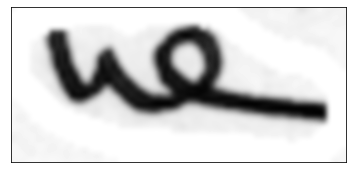

MEAN GRAY INTENSITY BEFORE FILTER:  0.8253812636165577
MEAN GRAY INTENSITY AFTER FILTER:  0.675462962962963
DIMENSION :  2
SHAPE :  (28, 36)
SIZE(NO OF PIXELS) :  1008


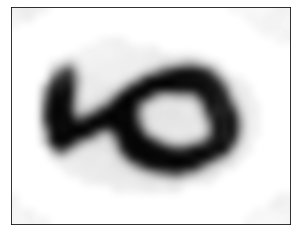

MEAN GRAY INTENSITY BEFORE FILTER:  0.8109447415329768
MEAN GRAY INTENSITY AFTER FILTER:  0.6602183600713013
DIMENSION :  2
SHAPE :  (32, 55)
SIZE(NO OF PIXELS) :  1760


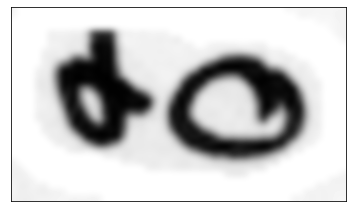

MEAN GRAY INTENSITY BEFORE FILTER:  0.8415143418578678
MEAN GRAY INTENSITY AFTER FILTER:  0.6870265914585011
DIMENSION :  2
SHAPE :  (38, 73)
SIZE(NO OF PIXELS) :  2774


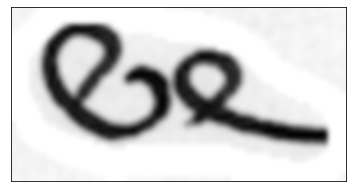

MEAN GRAY INTENSITY BEFORE FILTER:  0.8164106724163084
MEAN GRAY INTENSITY AFTER FILTER:  0.6633527953006643
DIMENSION :  2
SHAPE :  (33, 167)
SIZE(NO OF PIXELS) :  5511


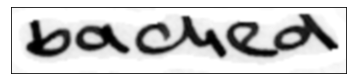

MEAN GRAY INTENSITY BEFORE FILTER:  0.8396488378388832
MEAN GRAY INTENSITY AFTER FILTER:  0.686803573500406
DIMENSION :  2
SHAPE :  (39, 65)
SIZE(NO OF PIXELS) :  2535


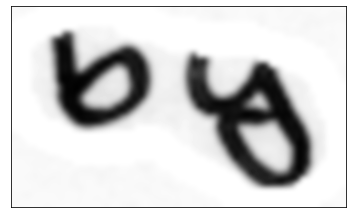

MEAN GRAY INTENSITY BEFORE FILTER:  0.8474160062506977
MEAN GRAY INTENSITY AFTER FILTER:  0.6923484763924546
DIMENSION :  2
SHAPE :  (31, 68)
SIZE(NO OF PIXELS) :  2108


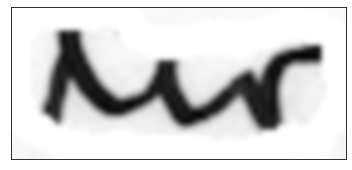

MEAN GRAY INTENSITY BEFORE FILTER:  0.8585065631906986
MEAN GRAY INTENSITY AFTER FILTER:  0.7036209481980541
DIMENSION :  2
SHAPE :  (31, 89)
SIZE(NO OF PIXELS) :  2759


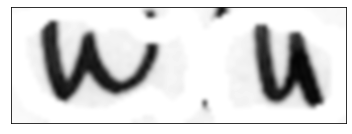

MEAN GRAY INTENSITY BEFORE FILTER:  0.864481785749992
MEAN GRAY INTENSITY AFTER FILTER:  0.7100204588737621
DIMENSION :  2
SHAPE :  (43, 187)
SIZE(NO OF PIXELS) :  8041


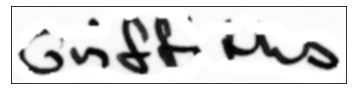

MEAN GRAY INTENSITY BEFORE FILTER:  0.8546366538158604
MEAN GRAY INTENSITY AFTER FILTER:  0.7007447940416476
DIMENSION :  2
SHAPE :  (33, 43)
SIZE(NO OF PIXELS) :  1419


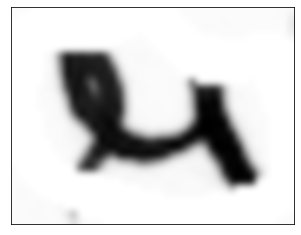

MEAN GRAY INTENSITY BEFORE FILTER:  0.8499120160884865
MEAN GRAY INTENSITY AFTER FILTER:  0.6978318250377072
DIMENSION :  2
SHAPE :  (32, 39)
SIZE(NO OF PIXELS) :  1248


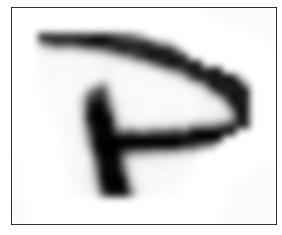

MEAN GRAY INTENSITY BEFORE FILTER:  0.8679110232328225
MEAN GRAY INTENSITY AFTER FILTER:  0.7140378975119459
DIMENSION :  2
SHAPE :  (35, 85)
SIZE(NO OF PIXELS) :  2975


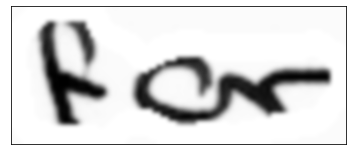

MEAN GRAY INTENSITY BEFORE FILTER:  0.8547120272610469
MEAN GRAY INTENSITY AFTER FILTER:  0.6998019409784115
DIMENSION :  2
SHAPE :  (33, 234)
SIZE(NO OF PIXELS) :  7722


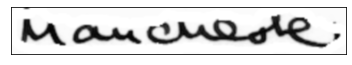

MEAN GRAY INTENSITY BEFORE FILTER:  0.870718954248366
MEAN GRAY INTENSITY AFTER FILTER:  0.7155530090824209
DIMENSION :  2
SHAPE :  (40, 231)
SIZE(NO OF PIXELS) :  9240


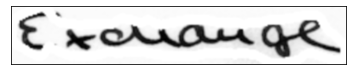

In [23]:
for sen_no in range(len(SENTENCES)):
    for word_no in range(len(WORDS[sen_no])):
        x=WORDS[sen_no][word_no][0][0]
        y=WORDS[sen_no][word_no][0][1]
        w=WORDS[sen_no][word_no][0][2]
        h=WORDS[sen_no][word_no][0][3]
        Pre_Processed_Gray_Image=SENTENCES[sen_no][y:y+h,x:x+w]
        Image_in_float=img_as_float(Pre_Processed_Gray_Image)
        Intensity=np.mean(Image_in_float)
        
        print("MEAN GRAY INTENSITY BEFORE FILTER: ",Intensity)
        if(Intensity>0.65):
            for row in range(len(Pre_Processed_Gray_Image)):
                for col in range(len(Pre_Processed_Gray_Image[0])):
                    if(Pre_Processed_Gray_Image[row][col]>40):
                        Pre_Processed_Gray_Image[row][col]=Pre_Processed_Gray_Image[row][col]-40
                    else:
                        Pre_Processed_Gray_Image[row][col]=0
        
        Image_in_float=img_as_float(Pre_Processed_Gray_Image)
        Intensity=np.mean(Image_in_float)
        print("MEAN GRAY INTENSITY AFTER FILTER: ",Intensity)
        show_image(Pre_Processed_Gray_Image,cmap='gray')
        
        Binary_Thres_Value,Binary_Thres_Image=cv2.threshold(Pre_Processed_Gray_Image,127,255,cv2.THRESH_BINARY)
        WORDS[sen_no][word_no][1]=Binary_Thres_Image

DIMENSION :  2
SHAPE :  (28, 28)
SIZE(NO OF PIXELS) :  784


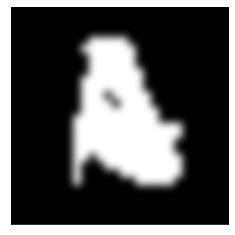

[0, 0, 0, 0, 0, 0, 0, 0, 9, 12, 15, 16, 16, 16, 18, 17, 15, 12, 10, 8, 8, 5, 0, 0, 0, 0, 0, 0]


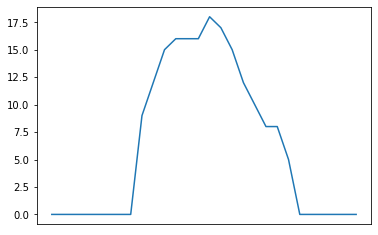

CHARACTER THRESHOLD :  0.0
CHARACTER SEGMENTS :  [[8, 22]]
DIMENSION :  2
SHAPE :  (34, 115)
SIZE(NO OF PIXELS) :  3910


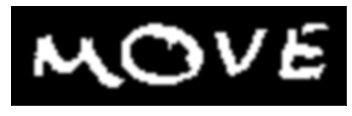

[0, 0, 0, 0, 0, 0, 0, 0, 7, 13, 13, 8, 9, 10, 9, 7, 6, 5, 4, 4, 4, 4, 3, 4, 8, 8, 8, 11, 8, 7, 8, 7, 6, 5, 5, 4, 4, 2, 10, 11, 13, 10, 9, 7, 8, 7, 6, 8, 8, 9, 8, 8, 7, 8, 11, 9, 9, 6, 8, 7, 9, 14, 13, 12, 8, 5, 0, 0, 0, 0, 2, 6, 9, 11, 12, 9, 7, 3, 3, 4, 5, 6, 6, 8, 8, 6, 3, 1, 0, 0, 0, 0, 2, 10, 12, 17, 15, 12, 7, 8, 11, 12, 11, 10, 9, 9, 7, 3, 1, 0, 0, 0, 0, 0, 0]


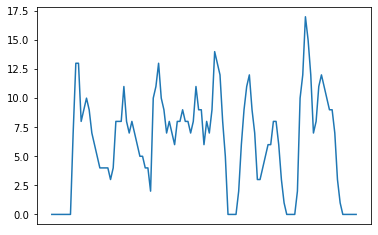

CHARACTER THRESHOLD :  1.885618083164127
CHARACTER SEGMENTS :  [[8, 66], 4, [70, 88], 4, [92, 109]]
DIMENSION :  2
SHAPE :  (29, 47)
SIZE(NO OF PIXELS) :  1363


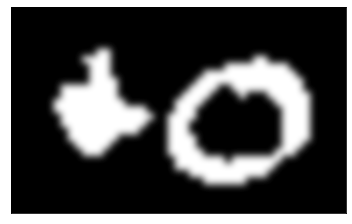

[0, 0, 0, 0, 0, 0, 2, 6, 8, 9, 11, 14, 15, 14, 9, 5, 4, 4, 3, 1, 0, 0, 6, 10, 11, 11, 8, 8, 7, 6, 6, 8, 9, 7, 8, 8, 7, 8, 13, 12, 10, 7, 0, 0, 0, 0, 0]


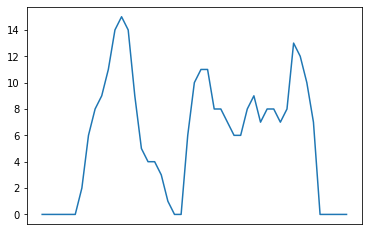

CHARACTER THRESHOLD :  0.6666666666666666
CHARACTER SEGMENTS :  [[6, 20], 2, [22, 42]]
DIMENSION :  2
SHAPE :  (35, 91)
SIZE(NO OF PIXELS) :  3185


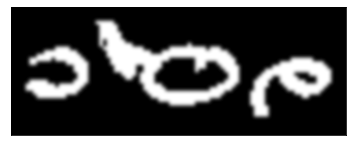

[0, 0, 0, 0, 2, 5, 6, 7, 7, 8, 7, 6, 7, 8, 8, 8, 7, 10, 10, 8, 6, 0, 0, 1, 7, 6, 10, 12, 13, 11, 10, 10, 10, 8, 5, 8, 11, 12, 12, 9, 9, 7, 6, 7, 7, 7, 7, 7, 8, 7, 10, 9, 9, 6, 7, 7, 9, 8, 9, 10, 8, 5, 0, 0, 0, 4, 10, 11, 12, 8, 3, 3, 3, 6, 7, 8, 9, 9, 8, 9, 8, 8, 7, 9, 8, 6, 4, 0, 0, 0, 0]


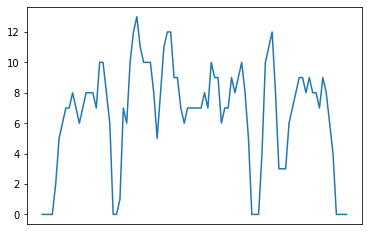

CHARACTER THRESHOLD :  1.2018504251546631
CHARACTER SEGMENTS :  [[4, 21], 2, [23, 62], 3, [65, 87]]
DIMENSION :  2
SHAPE :  (34, 62)
SIZE(NO OF PIXELS) :  2108


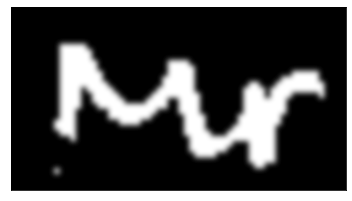

[0, 0, 0, 0, 0, 0, 0, 0, 3, 17, 17, 18, 12, 8, 8, 8, 7, 5, 6, 5, 5, 4, 4, 4, 3, 4, 4, 4, 6, 7, 7, 10, 14, 16, 12, 8, 5, 4, 3, 3, 3, 3, 5, 10, 15, 16, 15, 12, 14, 8, 7, 4, 4, 4, 4, 4, 4, 3, 0, 0, 0, 0]


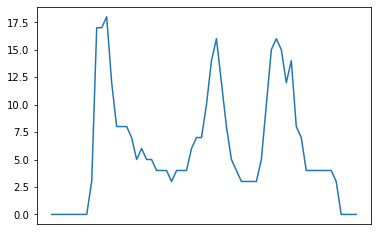

CHARACTER THRESHOLD :  0.0
CHARACTER SEGMENTS :  [[8, 58]]
DIMENSION :  2
SHAPE :  (44, 197)
SIZE(NO OF PIXELS) :  8668


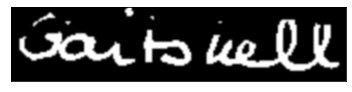

[0, 0, 0, 0, 0, 7, 8, 10, 5, 4, 3, 4, 4, 6, 6, 4, 4, 6, 5, 5, 7, 10, 11, 13, 13, 14, 12, 10, 13, 13, 10, 11, 11, 10, 8, 8, 7, 6, 7, 7, 8, 7, 8, 13, 12, 12, 13, 13, 13, 7, 4, 4, 4, 3, 3, 4, 3, 4, 4, 4, 8, 12, 12, 13, 6, 4, 4, 6, 8, 9, 9, 4, 2, 0, 0, 0, 0, 0, 4, 15, 19, 19, 20, 7, 4, 4, 4, 4, 6, 8, 9, 9, 8, 8, 7, 8, 9, 8, 8, 8, 9, 11, 12, 11, 8, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 9, 12, 15, 12, 11, 7, 6, 7, 9, 11, 13, 12, 10, 9, 3, 3, 7, 10, 11, 12, 11, 10, 9, 9, 13, 12, 10, 7, 3, 3, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 14, 22, 24, 26, 13, 10, 11, 12, 18, 24, 21, 16, 4, 4, 4, 4, 4, 3, 3, 4, 3, 3, 20, 24, 22, 13, 12, 15, 21, 18, 15, 11, 4, 3, 3, 3, 2, 0, 0, 0, 0]


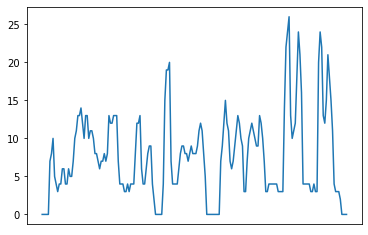

CHARACTER THRESHOLD :  3.4318767136623336
CHARACTER SEGMENTS :  [[5, 73], 5, [78, 106], 9, [115, 193]]
DIMENSION :  2
SHAPE :  (37, 100)
SIZE(NO OF PIXELS) :  3700


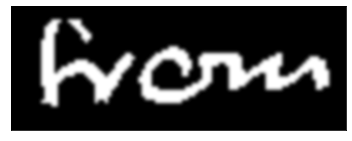

[0, 0, 0, 0, 0, 0, 0, 0, 0, 15, 23, 24, 26, 14, 5, 4, 3, 5, 6, 7, 8, 8, 9, 7, 6, 11, 9, 8, 8, 7, 6, 7, 6, 5, 5, 4, 1, 0, 2, 8, 11, 12, 8, 9, 7, 7, 7, 8, 8, 9, 9, 11, 11, 6, 4, 3, 6, 11, 10, 9, 4, 4, 3, 3, 4, 11, 11, 11, 9, 5, 3, 3, 3, 3, 3, 4, 9, 10, 10, 11, 8, 3, 3, 3, 3, 3, 3, 3, 4, 4, 7, 10, 9, 8, 5, 0, 0, 0, 0, 0]


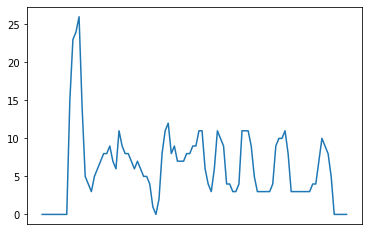

CHARACTER THRESHOLD :  0.3333333333333333
CHARACTER SEGMENTS :  [[9, 37], 1, [38, 95]]
DIMENSION :  2
SHAPE :  (51, 234)
SIZE(NO OF PIXELS) :  11934


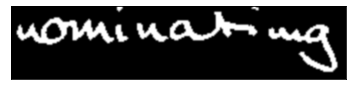

[0, 0, 0, 0, 3, 8, 10, 9, 5, 3, 4, 4, 6, 7, 8, 10, 9, 7, 6, 5, 4, 10, 12, 13, 13, 9, 8, 8, 7, 6, 7, 8, 8, 10, 11, 13, 12, 10, 9, 4, 3, 4, 5, 14, 14, 13, 8, 4, 5, 5, 6, 6, 7, 11, 14, 14, 8, 4, 5, 6, 6, 7, 8, 10, 11, 10, 8, 7, 5, 3, 3, 2, 0, 6, 13, 16, 15, 9, 4, 3, 3, 1, 0, 0, 0, 0, 0, 0, 5, 8, 10, 10, 6, 3, 4, 4, 5, 6, 8, 10, 11, 8, 6, 6, 5, 4, 4, 3, 2, 1, 0, 7, 9, 11, 10, 8, 8, 6, 6, 5, 6, 9, 11, 11, 10, 8, 7, 6, 5, 5, 4, 4, 4, 3, 4, 3, 3, 4, 3, 3, 3, 4, 6, 15, 14, 13, 11, 9, 10, 9, 10, 11, 10, 6, 4, 4, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 6, 7, 7, 9, 6, 4, 2, 0, 0, 0, 0, 0, 0, 0, 5, 6, 8, 7, 4, 4, 3, 6, 6, 7, 8, 7, 6, 5, 4, 4, 4, 5, 7, 8, 8, 7, 7, 7, 9, 9, 12, 15, 15, 13, 10, 11, 9, 11, 11, 12, 15, 17, 21, 21, 19, 17, 12, 13, 15, 12, 8, 4, 0, 0, 0, 0, 0, 0]


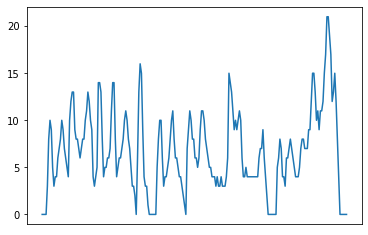

CHARACTER THRESHOLD :  3.109126351029605
CHARACTER SEGMENTS :  [[4, 72], 1, [73, 82], 6, [88, 110], 1, [111, 173], 7, [180, 228]]
DIMENSION :  2
SHAPE :  (48, 83)
SIZE(NO OF PIXELS) :  3984


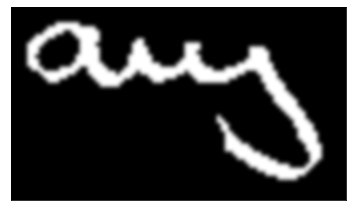

[0, 0, 0, 0, 6, 8, 8, 5, 5, 6, 6, 6, 6, 5, 4, 6, 8, 10, 10, 12, 13, 12, 6, 5, 4, 4, 3, 3, 3, 6, 8, 8, 9, 7, 6, 5, 5, 4, 3, 3, 3, 3, 4, 7, 8, 9, 9, 5, 4, 4, 3, 5, 6, 11, 8, 8, 8, 7, 8, 11, 10, 12, 13, 15, 12, 12, 11, 11, 10, 9, 10, 10, 10, 10, 11, 8, 4, 0, 0, 0, 0, 0, 0]


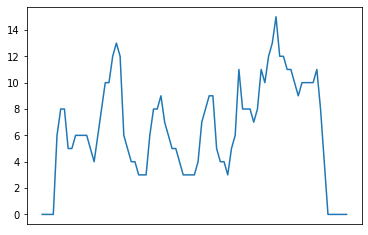

CHARACTER THRESHOLD :  0.0
CHARACTER SEGMENTS :  [[4, 77]]
DIMENSION :  2
SHAPE :  (30, 103)
SIZE(NO OF PIXELS) :  3090


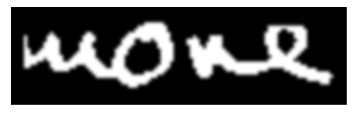

[0, 0, 0, 0, 10, 6, 3, 3, 3, 4, 5, 8, 11, 11, 10, 5, 3, 3, 3, 4, 4, 7, 9, 11, 12, 10, 6, 5, 4, 3, 3, 6, 9, 11, 14, 11, 10, 8, 7, 7, 8, 10, 9, 7, 9, 11, 16, 14, 11, 6, 0, 0, 0, 0, 2, 6, 10, 11, 10, 9, 11, 12, 9, 9, 9, 6, 6, 5, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 7, 12, 13, 13, 8, 6, 6, 8, 10, 13, 14, 12, 10, 4, 4, 4, 3, 4, 4, 4, 1, 0, 0, 0, 0]


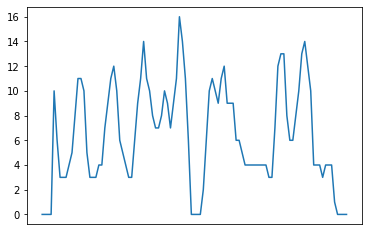

CHARACTER THRESHOLD :  1.3333333333333333
CHARACTER SEGMENTS :  [[4, 50], 4, [54, 99]]
DIMENSION :  2
SHAPE :  (36, 152)
SIZE(NO OF PIXELS) :  5472


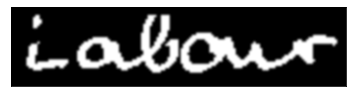

[0, 0, 0, 0, 0, 0, 0, 4, 10, 11, 17, 14, 10, 6, 3, 3, 3, 4, 4, 4, 3, 3, 4, 4, 3, 2, 0, 0, 0, 0, 5, 9, 11, 12, 8, 8, 6, 6, 6, 6, 6, 8, 12, 12, 11, 9, 9, 10, 11, 7, 6, 4, 4, 3, 3, 3, 3, 4, 3, 11, 17, 21, 24, 15, 13, 10, 10, 10, 16, 15, 14, 14, 12, 11, 10, 8, 0, 7, 11, 13, 13, 9, 8, 7, 7, 7, 7, 6, 7, 7, 12, 10, 12, 12, 10, 10, 8, 8, 10, 11, 10, 9, 6, 5, 4, 3, 4, 4, 5, 8, 9, 9, 11, 9, 6, 5, 4, 3, 3, 3, 3, 3, 3, 3, 4, 3, 3, 4, 7, 6, 7, 8, 8, 9, 11, 12, 12, 5, 4, 4, 4, 4, 4, 3, 3, 3, 4, 2, 0, 0, 0, 0]


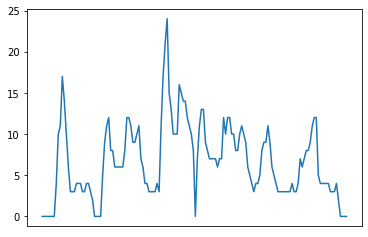

CHARACTER THRESHOLD :  1.3743685418725535
CHARACTER SEGMENTS :  [[7, 26], 4, [30, 76], 1, [77, 148]]
DIMENSION :  2
SHAPE :  (37, 91)
SIZE(NO OF PIXELS) :  3367


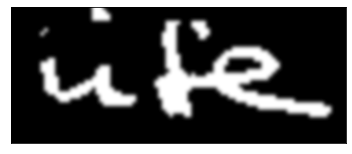

[0, 0, 0, 0, 0, 0, 0, 0, 4, 9, 10, 10, 6, 3, 3, 3, 3, 3, 4, 3, 4, 3, 7, 11, 14, 14, 13, 5, 4, 4, 3, 3, 3, 2, 0, 0, 0, 0, 0, 2, 6, 13, 24, 26, 25, 17, 12, 12, 8, 6, 6, 8, 8, 6, 4, 7, 9, 11, 10, 9, 10, 11, 10, 9, 11, 10, 11, 11, 12, 12, 10, 8, 5, 3, 3, 4, 4, 3, 3, 3, 3, 4, 4, 4, 4, 3, 2, 0, 0, 0, 0]


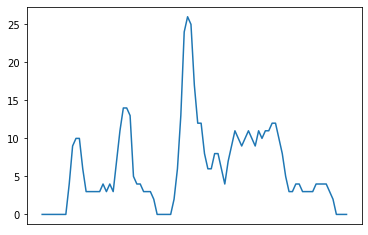

CHARACTER THRESHOLD :  1.6666666666666667
CHARACTER SEGMENTS :  [[8, 34], 5, [39, 87]]
DIMENSION :  2
SHAPE :  (47, 117)
SIZE(NO OF PIXELS) :  5499


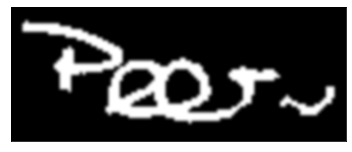

[0, 0, 0, 0, 3, 4, 3, 3, 3, 3, 3, 3, 3, 4, 4, 6, 8, 14, 17, 18, 20, 12, 7, 8, 7, 7, 7, 6, 7, 7, 7, 7, 7, 9, 17, 21, 21, 22, 16, 9, 10, 12, 11, 10, 11, 10, 10, 10, 12, 12, 16, 18, 17, 17, 12, 9, 9, 9, 9, 10, 11, 10, 11, 10, 11, 13, 16, 13, 12, 6, 3, 3, 4, 3, 3, 3, 5, 7, 6, 7, 9, 14, 12, 12, 9, 4, 3, 3, 4, 4, 4, 4, 2, 1, 2, 3, 3, 2, 2, 2, 2, 4, 4, 3, 3, 3, 4, 3, 3, 3, 6, 6, 4, 0, 0, 0, 0]


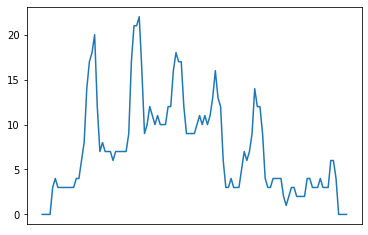

CHARACTER THRESHOLD :  0.0
CHARACTER SEGMENTS :  [[4, 113]]
DIMENSION :  2
SHAPE :  (25, 41)
SIZE(NO OF PIXELS) :  1025


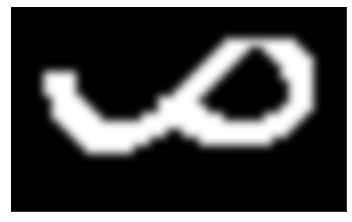

[0, 0, 0, 0, 3, 6, 7, 8, 6, 6, 5, 4, 4, 4, 4, 3, 4, 3, 5, 4, 5, 7, 8, 9, 8, 8, 7, 6, 5, 4, 4, 6, 6, 9, 11, 9, 7, 0, 0, 0, 0]


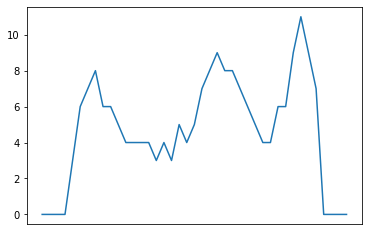

CHARACTER THRESHOLD :  0.0
CHARACTER SEGMENTS :  [[4, 37]]
DIMENSION :  2
SHAPE :  (30, 49)
SIZE(NO OF PIXELS) :  1470


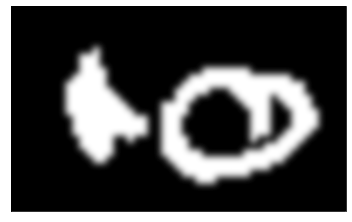

[0, 0, 0, 0, 0, 0, 0, 0, 5, 9, 14, 15, 17, 14, 10, 6, 5, 5, 3, 3, 0, 0, 8, 9, 12, 11, 8, 8, 8, 7, 6, 6, 7, 8, 10, 13, 12, 13, 6, 8, 9, 10, 9, 6, 3, 0, 0, 0, 0]


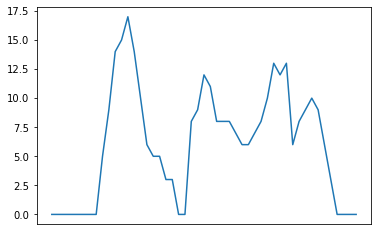

CHARACTER THRESHOLD :  0.6666666666666666
CHARACTER SEGMENTS :  [[8, 20], 2, [22, 45]]
DIMENSION :  2
SHAPE :  (37, 60)
SIZE(NO OF PIXELS) :  2220


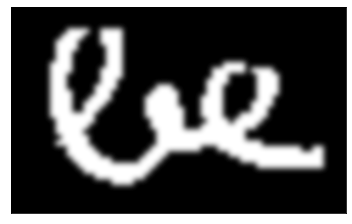

[0, 0, 0, 0, 0, 0, 0, 10, 18, 20, 20, 13, 12, 13, 10, 10, 14, 17, 15, 13, 4, 4, 3, 4, 8, 11, 14, 13, 12, 11, 8, 4, 4, 4, 8, 12, 14, 15, 10, 8, 9, 11, 7, 10, 15, 13, 11, 8, 4, 4, 4, 4, 3, 3, 4, 4, 0, 0, 0, 0]


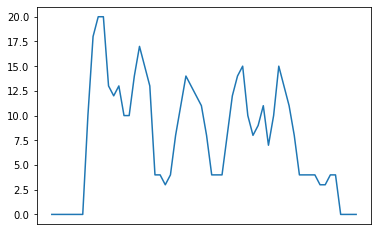

CHARACTER THRESHOLD :  0.0
CHARACTER SEGMENTS :  [[7, 56]]
DIMENSION :  2
SHAPE :  (32, 138)
SIZE(NO OF PIXELS) :  4416


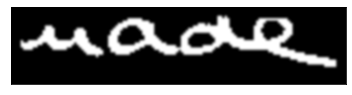

[0, 0, 0, 0, 3, 3, 3, 4, 4, 3, 3, 3, 4, 5, 7, 8, 9, 9, 5, 4, 4, 4, 4, 3, 3, 3, 5, 7, 8, 9, 9, 7, 5, 4, 4, 4, 3, 2, 0, 0, 5, 9, 10, 12, 10, 7, 7, 7, 7, 6, 6, 6, 7, 8, 9, 10, 10, 9, 10, 6, 5, 5, 4, 5, 4, 4, 4, 4, 2, 1, 7, 9, 10, 8, 6, 6, 6, 7, 7, 7, 6, 7, 7, 8, 9, 13, 12, 10, 11, 10, 7, 6, 5, 4, 5, 5, 4, 4, 4, 4, 10, 12, 13, 11, 7, 5, 6, 7, 8, 8, 10, 10, 13, 13, 10, 9, 4, 3, 4, 4, 4, 3, 4, 4, 4, 4, 3, 3, 3, 4, 4, 3, 3, 3, 0, 0, 0, 0]


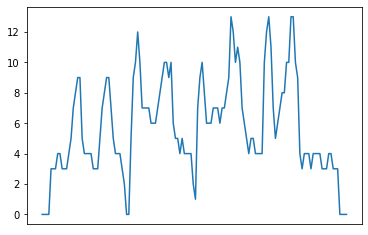

CHARACTER THRESHOLD :  0.6666666666666666
CHARACTER SEGMENTS :  [[4, 38], 2, [40, 134]]
DIMENSION :  2
SHAPE :  (33, 49)
SIZE(NO OF PIXELS) :  1617


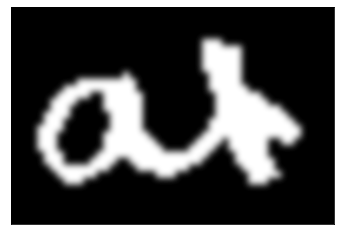

[0, 0, 0, 0, 4, 8, 11, 10, 8, 6, 6, 5, 5, 5, 11, 13, 12, 13, 13, 12, 6, 5, 5, 4, 4, 3, 3, 3, 4, 9, 13, 16, 14, 16, 18, 13, 14, 14, 13, 8, 6, 5, 4, 2, 0, 0, 0, 0, 0]


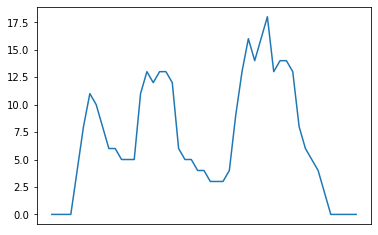

CHARACTER THRESHOLD :  0.0
CHARACTER SEGMENTS :  [[4, 44]]
DIMENSION :  2
SHAPE :  (25, 36)
SIZE(NO OF PIXELS) :  900


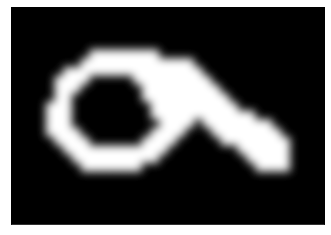

[0, 0, 0, 0, 4, 8, 10, 7, 7, 6, 6, 6, 6, 6, 7, 9, 12, 11, 10, 9, 8, 6, 6, 6, 6, 5, 5, 6, 6, 6, 5, 4, 0, 0, 0, 0]


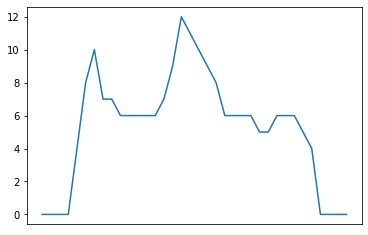

CHARACTER THRESHOLD :  0.0
CHARACTER SEGMENTS :  [[4, 32]]
DIMENSION :  2
SHAPE :  (51, 177)
SIZE(NO OF PIXELS) :  9027


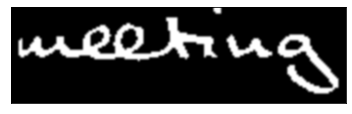

[0, 0, 0, 0, 8, 10, 4, 3, 3, 3, 4, 5, 7, 10, 10, 10, 5, 4, 3, 3, 3, 3, 3, 3, 7, 7, 9, 10, 6, 6, 5, 4, 4, 4, 4, 4, 3, 3, 9, 11, 12, 13, 8, 8, 10, 10, 9, 10, 11, 14, 12, 10, 4, 3, 5, 12, 14, 15, 13, 9, 8, 10, 9, 8, 8, 8, 13, 15, 13, 11, 3, 3, 3, 2, 3, 3, 3, 3, 2, 3, 3, 3, 6, 12, 17, 16, 16, 17, 12, 13, 13, 11, 10, 6, 4, 4, 4, 4, 4, 4, 4, 4, 11, 10, 10, 10, 6, 5, 5, 4, 4, 0, 0, 0, 2, 6, 9, 10, 9, 6, 4, 3, 3, 2, 3, 3, 4, 6, 6, 7, 9, 9, 6, 5, 4, 4, 2, 2, 0, 0, 0, 4, 7, 8, 10, 8, 11, 13, 15, 15, 12, 10, 12, 12, 14, 12, 14, 15, 12, 11, 11, 11, 10, 9, 9, 9, 9, 9, 9, 8, 8, 6, 5, 0, 0, 0, 0]


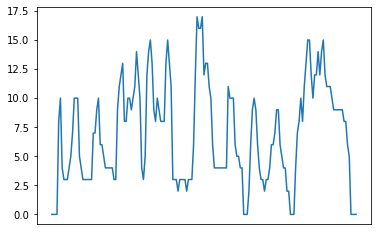

CHARACTER THRESHOLD :  1.414213562373095
CHARACTER SEGMENTS :  [[4, 111], 3, [114, 138], 3, [141, 173]]
DIMENSION :  2
SHAPE :  (41, 50)
SIZE(NO OF PIXELS) :  2050


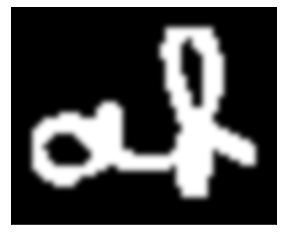

[0, 0, 0, 0, 8, 10, 11, 8, 7, 8, 8, 8, 8, 7, 9, 11, 12, 13, 12, 12, 12, 4, 4, 3, 3, 3, 3, 3, 6, 15, 18, 28, 26, 22, 21, 22, 32, 28, 19, 13, 5, 5, 5, 5, 5, 4, 0, 0, 0, 0]


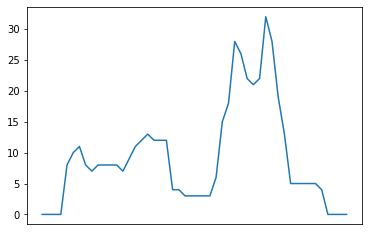

CHARACTER THRESHOLD :  0.0
CHARACTER SEGMENTS :  [[4, 46]]
DIMENSION :  2
SHAPE :  (38, 155)
SIZE(NO OF PIXELS) :  5890


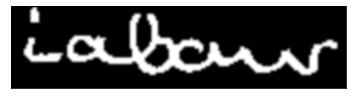

[0, 0, 0, 0, 0, 0, 3, 6, 10, 17, 13, 10, 8, 4, 4, 3, 3, 4, 4, 4, 4, 4, 3, 1, 0, 0, 6, 9, 11, 8, 7, 5, 5, 5, 6, 6, 8, 7, 7, 9, 10, 10, 11, 6, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 16, 21, 22, 12, 10, 8, 10, 9, 11, 15, 21, 19, 13, 7, 6, 7, 7, 10, 14, 12, 10, 11, 11, 9, 8, 6, 7, 7, 8, 6, 7, 7, 8, 6, 3, 3, 6, 10, 9, 9, 9, 7, 5, 4, 4, 4, 3, 3, 3, 4, 4, 6, 6, 7, 7, 7, 6, 5, 5, 4, 4, 3, 3, 3, 3, 2, 3, 3, 3, 5, 7, 6, 5, 7, 6, 6, 6, 5, 5, 5, 4, 3, 3, 9, 11, 13, 12, 4, 2, 2, 2, 3, 3, 4, 3, 3, 0, 0, 0, 0]


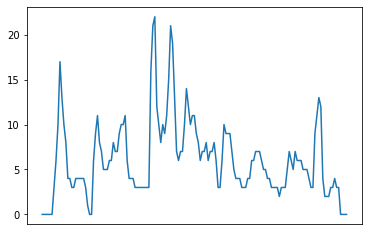

CHARACTER THRESHOLD :  0.6666666666666666
CHARACTER SEGMENTS :  [[6, 24], 2, [26, 151]]
DIMENSION :  2
SHAPE :  (43, 103)
SIZE(NO OF PIXELS) :  4429


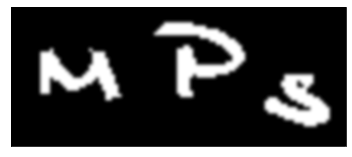

[0, 0, 0, 0, 0, 0, 0, 0, 0, 13, 13, 13, 9, 8, 7, 6, 6, 6, 5, 4, 4, 3, 4, 4, 7, 9, 8, 10, 12, 13, 10, 7, 4, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 3, 4, 4, 4, 4, 18, 19, 20, 20, 15, 8, 7, 8, 8, 7, 8, 8, 8, 7, 8, 9, 8, 10, 8, 6, 3, 0, 0, 0, 0, 0, 0, 3, 5, 5, 5, 5, 6, 11, 11, 12, 13, 11, 12, 15, 13, 13, 9, 8, 7, 6, 4, 0, 0, 0, 0, 0]


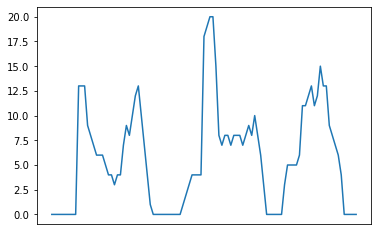

CHARACTER THRESHOLD :  3.8873012632302006
CHARACTER SEGMENTS :  [[9, 34], 10, [44, 72], 6, [78, 98]]
DIMENSION :  2
SHAPE :  (34, 229)
SIZE(NO OF PIXELS) :  7786


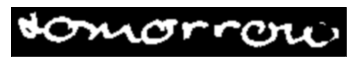

[0, 0, 0, 0, 0, 4, 8, 10, 12, 12, 11, 10, 10, 13, 17, 17, 17, 11, 5, 4, 4, 3, 4, 8, 10, 12, 10, 8, 7, 8, 7, 7, 7, 8, 7, 7, 7, 6, 7, 11, 9, 8, 10, 10, 8, 6, 4, 4, 4, 4, 5, 4, 5, 6, 10, 11, 9, 7, 5, 4, 4, 4, 6, 9, 11, 10, 6, 4, 3, 3, 3, 3, 3, 3, 3, 4, 4, 5, 6, 8, 11, 10, 8, 6, 4, 3, 3, 3, 2, 6, 9, 11, 13, 9, 7, 8, 7, 7, 7, 8, 8, 8, 10, 9, 10, 7, 11, 13, 12, 11, 10, 4, 4, 2, 0, 0, 0, 4, 12, 11, 11, 10, 8, 5, 4, 4, 3, 4, 4, 4, 4, 4, 4, 3, 2, 0, 0, 0, 0, 7, 8, 8, 8, 8, 6, 5, 4, 3, 4, 4, 4, 4, 5, 5, 4, 4, 2, 2, 8, 10, 12, 11, 8, 7, 7, 7, 7, 7, 8, 10, 13, 11, 9, 5, 3, 3, 6, 9, 13, 12, 10, 7, 3, 2, 3, 3, 3, 7, 11, 13, 14, 11, 4, 3, 3, 3, 2, 3, 3, 3, 7, 9, 11, 12, 12, 10, 5, 4, 3, 3, 3, 4, 5, 4, 4, 2, 1, 0, 1, 2, 5, 7, 7, 6, 0, 0, 0, 0, 0]


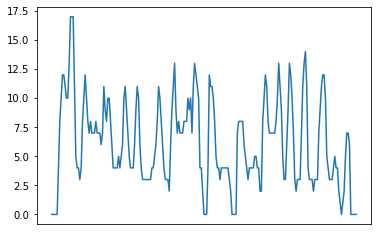

CHARACTER THRESHOLD :  1.6996731711975948
CHARACTER SEGMENTS :  [[5, 114], 3, [117, 135], 4, [139, 217], 1, [218, 224]]
DIMENSION :  2
SHAPE :  (33, 77)
SIZE(NO OF PIXELS) :  2541


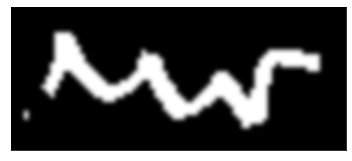

[0, 0, 0, 2, 0, 0, 0, 1, 4, 8, 13, 11, 9, 9, 9, 8, 7, 6, 6, 6, 5, 5, 4, 4, 3, 4, 3, 4, 4, 6, 7, 6, 8, 10, 10, 9, 8, 8, 6, 5, 3, 3, 4, 4, 4, 5, 6, 6, 6, 7, 7, 8, 8, 8, 7, 8, 13, 15, 15, 8, 4, 3, 4, 4, 4, 4, 4, 3, 4, 4, 4, 0, 0, 0, 0, 0, 0]


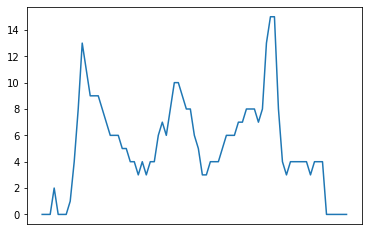

CHARACTER THRESHOLD :  1.0
CHARACTER SEGMENTS :  [[3, 4], 3, [7, 71]]
DIMENSION :  2
SHAPE :  (32, 175)
SIZE(NO OF PIXELS) :  5600


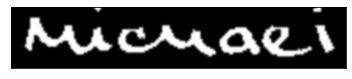

[0, 0, 0, 0, 0, 0, 0, 1, 6, 11, 17, 13, 9, 9, 10, 9, 8, 6, 6, 5, 5, 4, 4, 4, 3, 3, 4, 5, 8, 8, 10, 12, 10, 7, 6, 5, 4, 4, 3, 3, 3, 4, 6, 10, 11, 14, 14, 8, 5, 4, 4, 2, 1, 0, 0, 0, 4, 8, 11, 11, 8, 6, 5, 4, 4, 5, 7, 9, 8, 6, 3, 3, 2, 3, 2, 3, 3, 3, 4, 8, 7, 8, 9, 8, 6, 5, 4, 5, 4, 4, 4, 2, 3, 4, 6, 8, 8, 9, 10, 7, 5, 5, 4, 5, 4, 3, 2, 0, 0, 4, 7, 9, 10, 8, 8, 7, 6, 6, 6, 6, 7, 10, 12, 10, 9, 10, 8, 7, 5, 3, 0, 2, 7, 10, 11, 11, 9, 8, 8, 10, 9, 12, 10, 9, 8, 3, 3, 3, 2, 2, 3, 2, 3, 2, 2, 2, 2, 0, 2, 3, 7, 11, 10, 12, 11, 9, 6, 4, 1, 0, 0, 0, 0, 0, 0]


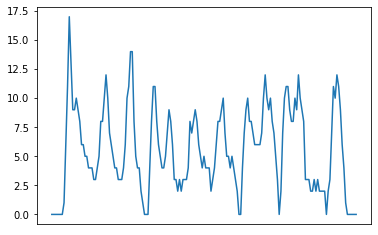

CHARACTER THRESHOLD :  1.2909944487358056
CHARACTER SEGMENTS :  [[7, 53], 3, [56, 107], 2, [109, 130], 1, [131, 157], 1, [158, 169]]
DIMENSION :  2
SHAPE :  (42, 94)
SIZE(NO OF PIXELS) :  3948


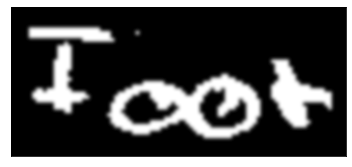

[0, 0, 0, 0, 0, 3, 5, 7, 7, 6, 7, 7, 17, 21, 21, 23, 18, 6, 6, 6, 6, 5, 4, 4, 4, 3, 3, 4, 7, 9, 10, 10, 8, 6, 6, 7, 5, 6, 6, 8, 9, 11, 10, 10, 8, 8, 9, 9, 8, 8, 9, 11, 14, 11, 9, 7, 6, 7, 10, 11, 14, 12, 11, 10, 7, 8, 13, 11, 9, 5, 0, 0, 0, 5, 10, 14, 16, 17, 16, 15, 13, 12, 11, 6, 4, 4, 4, 4, 4, 5, 0, 0, 0, 0]


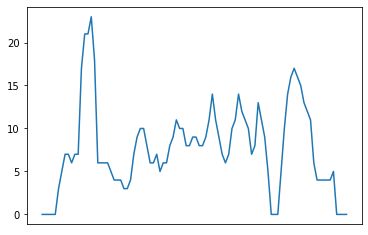

CHARACTER THRESHOLD :  1.0
CHARACTER SEGMENTS :  [[5, 70], 3, [73, 90]]
DIMENSION :  2
SHAPE :  (31, 77)
SIZE(NO OF PIXELS) :  2387


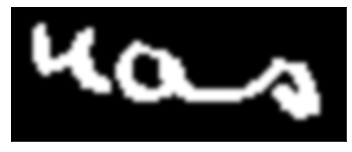

[0, 0, 0, 0, 0, 8, 11, 12, 9, 3, 3, 4, 3, 4, 8, 11, 13, 14, 11, 5, 4, 4, 3, 0, 4, 8, 11, 12, 9, 7, 6, 5, 5, 5, 10, 11, 10, 8, 9, 7, 5, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 4, 3, 4, 4, 4, 7, 8, 9, 8, 9, 11, 13, 13, 10, 8, 5, 0, 0, 0, 0, 0, 0]


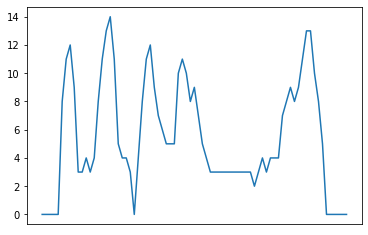

CHARACTER THRESHOLD :  0.3333333333333333
CHARACTER SEGMENTS :  [[5, 23], 1, [24, 71]]
DIMENSION :  2
SHAPE :  (38, 90)
SIZE(NO OF PIXELS) :  3420


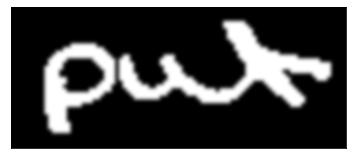

[0, 0, 0, 0, 0, 0, 0, 0, 0, 13, 19, 21, 22, 20, 18, 10, 8, 8, 8, 7, 7, 8, 8, 9, 10, 11, 10, 7, 0, 6, 9, 10, 9, 7, 5, 4, 4, 3, 3, 4, 5, 9, 10, 9, 7, 6, 5, 5, 5, 4, 4, 5, 4, 4, 4, 3, 4, 6, 9, 9, 12, 14, 15, 17, 15, 12, 10, 9, 10, 10, 11, 12, 11, 11, 11, 11, 10, 8, 6, 4, 4, 5, 6, 5, 5, 4, 0, 0, 0, 0]


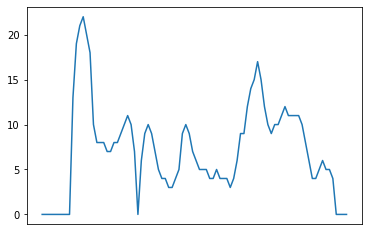

CHARACTER THRESHOLD :  0.3333333333333333
CHARACTER SEGMENTS :  [[9, 28], 1, [29, 86]]
DIMENSION :  2
SHAPE :  (33, 124)
SIZE(NO OF PIXELS) :  4092


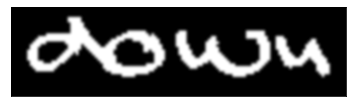

[0, 0, 0, 0, 0, 0, 4, 8, 10, 12, 8, 7, 6, 6, 6, 7, 6, 6, 6, 7, 8, 11, 14, 13, 14, 12, 8, 7, 7, 6, 6, 6, 6, 6, 8, 10, 11, 13, 11, 7, 6, 7, 6, 7, 7, 8, 7, 7, 8, 11, 11, 8, 10, 12, 10, 8, 4, 0, 0, 0, 0, 5, 9, 11, 12, 8, 7, 5, 4, 3, 4, 4, 8, 8, 10, 11, 9, 7, 6, 6, 5, 4, 5, 4, 4, 4, 4, 6, 6, 7, 6, 9, 14, 13, 10, 7, 0, 0, 5, 7, 9, 10, 7, 6, 4, 3, 3, 4, 5, 6, 6, 8, 9, 10, 9, 8, 6, 4, 0, 0, 0, 0, 0, 0]


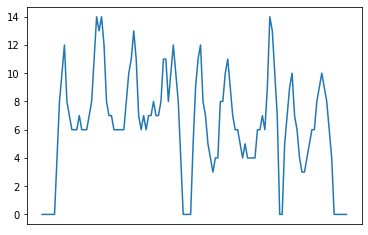

CHARACTER THRESHOLD :  1.4907119849998598
CHARACTER SEGMENTS :  [[6, 57], 4, [61, 96], 2, [98, 118]]
DIMENSION :  2
SHAPE :  (26, 35)
SIZE(NO OF PIXELS) :  910


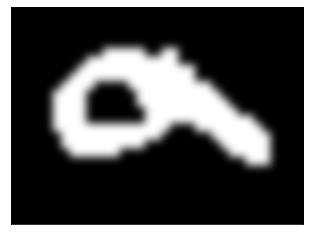

[0, 0, 0, 0, 0, 5, 8, 10, 11, 8, 7, 8, 8, 7, 8, 10, 10, 10, 10, 9, 7, 7, 6, 6, 6, 6, 6, 5, 6, 5, 4, 0, 0, 0, 0]


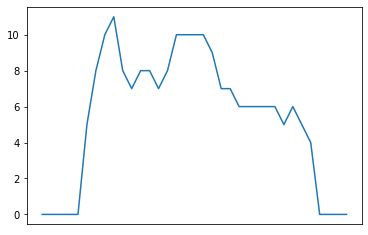

CHARACTER THRESHOLD :  0.0
CHARACTER SEGMENTS :  [[5, 31]]
DIMENSION :  2
SHAPE :  (33, 223)
SIZE(NO OF PIXELS) :  7359


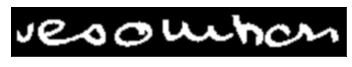

[0, 0, 0, 0, 7, 6, 5, 4, 3, 4, 4, 10, 10, 8, 6, 0, 0, 0, 6, 9, 12, 13, 11, 11, 11, 10, 10, 10, 9, 10, 10, 10, 11, 9, 8, 5, 3, 3, 3, 2, 2, 3, 3, 3, 3, 2, 3, 3, 4, 6, 7, 9, 9, 9, 8, 8, 7, 9, 10, 13, 12, 10, 7, 0, 0, 0, 0, 0, 0, 5, 9, 10, 10, 7, 6, 7, 7, 7, 7, 6, 6, 6, 6, 7, 7, 11, 11, 10, 11, 8, 9, 10, 8, 5, 0, 0, 0, 0, 0, 0, 0, 9, 11, 13, 14, 6, 4, 4, 4, 3, 3, 3, 4, 5, 9, 8, 9, 9, 7, 5, 5, 4, 4, 3, 4, 3, 3, 3, 3, 4, 4, 7, 7, 8, 9, 6, 6, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 7, 8, 11, 13, 11, 11, 13, 13, 12, 5, 5, 4, 4, 5, 5, 12, 12, 10, 10, 6, 0, 5, 8, 10, 12, 9, 7, 7, 6, 6, 6, 6, 6, 8, 8, 9, 9, 5, 2, 3, 2, 3, 3, 5, 9, 9, 6, 6, 7, 10, 9, 8, 6, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 2, 3, 6, 9, 8, 7, 4, 0, 0, 0, 0, 0]


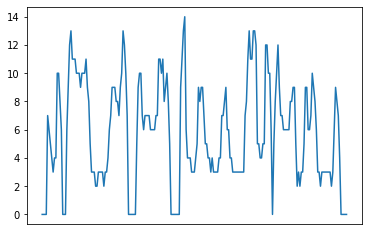

CHARACTER THRESHOLD :  3.2489314482696545
CHARACTER SEGMENTS :  [[4, 15], 3, [18, 63], 6, [69, 94], 7, [101, 168], 1, [169, 218]]
DIMENSION :  2
SHAPE :  (25, 45)
SIZE(NO OF PIXELS) :  1125


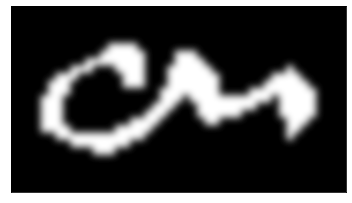

[0, 0, 0, 0, 5, 7, 9, 5, 4, 3, 4, 4, 5, 6, 7, 9, 9, 8, 3, 3, 4, 6, 7, 6, 7, 8, 8, 7, 3, 3, 3, 2, 3, 2, 3, 3, 6, 10, 8, 6, 4, 0, 0, 0, 0]


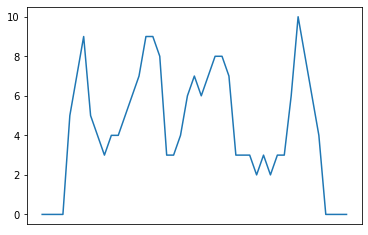

CHARACTER THRESHOLD :  0.0
CHARACTER SEGMENTS :  [[4, 41]]
DIMENSION :  2
SHAPE :  (35, 88)
SIZE(NO OF PIXELS) :  3080


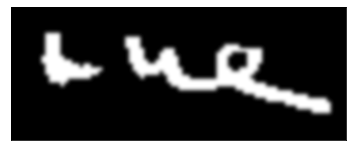

[0, 0, 0, 0, 0, 0, 0, 0, 2, 11, 13, 13, 13, 8, 6, 5, 4, 4, 3, 4, 4, 2, 2, 1, 0, 0, 0, 0, 0, 0, 3, 7, 9, 10, 8, 4, 3, 3, 4, 5, 7, 9, 10, 8, 6, 4, 4, 3, 3, 3, 3, 3, 3, 3, 9, 10, 11, 8, 6, 7, 7, 8, 12, 11, 10, 8, 4, 4, 4, 4, 3, 3, 4, 4, 3, 4, 4, 4, 3, 4, 4, 4, 4, 3, 0, 0, 0, 0]


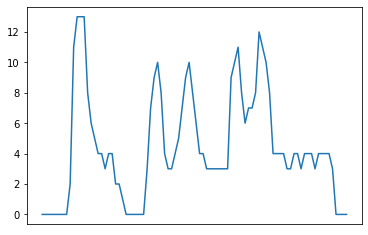

CHARACTER THRESHOLD :  2.0
CHARACTER SEGMENTS :  [[8, 24], 6, [30, 84]]
DIMENSION :  2
SHAPE :  (53, 166)
SIZE(NO OF PIXELS) :  8798


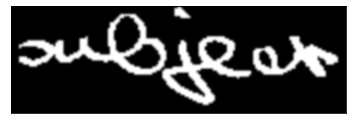

[0, 0, 0, 0, 5, 4, 6, 6, 6, 7, 6, 6, 7, 7, 7, 7, 8, 9, 9, 7, 6, 4, 8, 10, 11, 11, 4, 3, 3, 4, 3, 3, 3, 4, 9, 8, 8, 10, 6, 5, 5, 4, 4, 4, 3, 3, 4, 4, 12, 19, 19, 16, 9, 9, 9, 10, 8, 9, 9, 9, 9, 12, 12, 16, 17, 14, 12, 6, 6, 6, 7, 8, 9, 12, 13, 15, 11, 8, 9, 9, 9, 13, 12, 17, 22, 24, 22, 16, 15, 12, 12, 14, 15, 21, 23, 25, 24, 19, 16, 13, 10, 7, 10, 11, 11, 11, 11, 15, 13, 12, 7, 3, 4, 3, 3, 3, 3, 3, 2, 0, 7, 10, 11, 7, 5, 6, 7, 8, 9, 13, 12, 10, 4, 3, 3, 2, 3, 3, 6, 8, 14, 14, 13, 9, 8, 7, 10, 10, 13, 14, 14, 15, 12, 11, 9, 8, 6, 6, 6, 5, 4, 3, 0, 0, 0, 0]


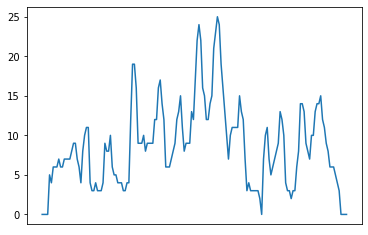

CHARACTER THRESHOLD :  0.3333333333333333
CHARACTER SEGMENTS :  [[4, 119], 1, [120, 162]]
DIMENSION :  2
SHAPE :  (33, 103)
SIZE(NO OF PIXELS) :  3399


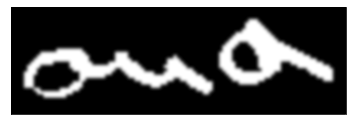

[0, 0, 0, 0, 5, 7, 8, 6, 6, 5, 6, 6, 6, 5, 6, 7, 7, 6, 9, 10, 10, 12, 9, 7, 5, 4, 4, 4, 4, 3, 4, 3, 5, 5, 6, 7, 6, 5, 6, 5, 5, 4, 4, 5, 4, 4, 3, 5, 7, 7, 7, 6, 6, 5, 5, 6, 5, 5, 5, 5, 4, 3, 0, 0, 5, 8, 10, 12, 10, 8, 8, 8, 10, 12, 13, 15, 17, 17, 15, 14, 12, 10, 9, 6, 5, 5, 5, 5, 5, 5, 4, 5, 5, 5, 5, 5, 5, 5, 4, 0, 0, 0, 0]


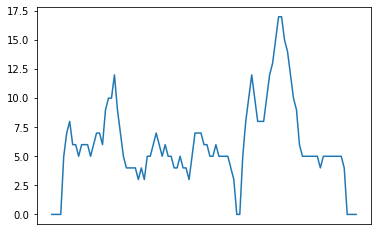

CHARACTER THRESHOLD :  0.6666666666666666
CHARACTER SEGMENTS :  [[4, 62], 2, [64, 99]]
DIMENSION :  2
SHAPE :  (32, 69)
SIZE(NO OF PIXELS) :  2208


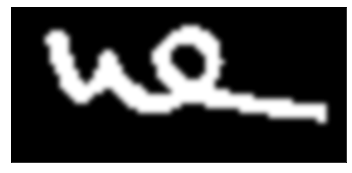

[0, 0, 0, 0, 0, 0, 0, 2, 7, 9, 12, 12, 9, 7, 5, 4, 4, 5, 8, 8, 8, 8, 7, 6, 6, 5, 6, 5, 4, 7, 11, 13, 15, 13, 11, 10, 9, 9, 10, 11, 16, 15, 12, 5, 4, 3, 3, 4, 4, 4, 3, 3, 3, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 4, 4, 0, 0, 0, 0]


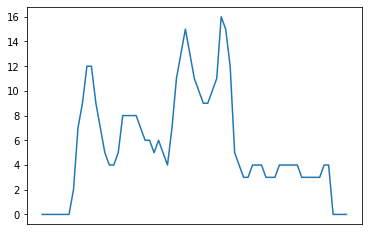

CHARACTER THRESHOLD :  0.0
CHARACTER SEGMENTS :  [[7, 65]]
DIMENSION :  2
SHAPE :  (28, 36)
SIZE(NO OF PIXELS) :  1008


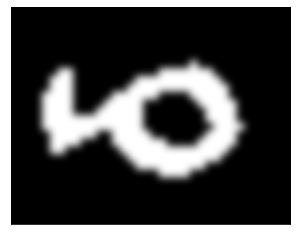

[0, 0, 0, 0, 5, 10, 11, 10, 4, 3, 3, 3, 4, 7, 8, 10, 12, 8, 7, 8, 7, 7, 7, 8, 9, 11, 11, 9, 6, 1, 0, 0, 0, 0, 0, 0]


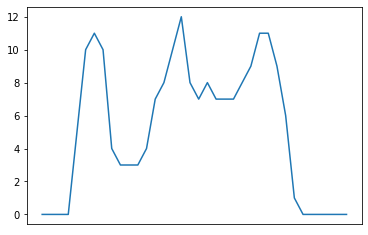

CHARACTER THRESHOLD :  0.0
CHARACTER SEGMENTS :  [[4, 30]]
DIMENSION :  2
SHAPE :  (32, 55)
SIZE(NO OF PIXELS) :  1760


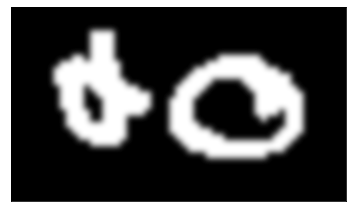

[0, 0, 0, 0, 0, 0, 0, 3, 8, 11, 13, 14, 9, 14, 15, 19, 19, 14, 10, 5, 5, 4, 3, 0, 0, 0, 6, 9, 11, 13, 10, 8, 9, 7, 8, 7, 7, 7, 8, 9, 13, 13, 10, 11, 10, 12, 9, 7, 0, 0, 0, 0, 0, 0, 0]


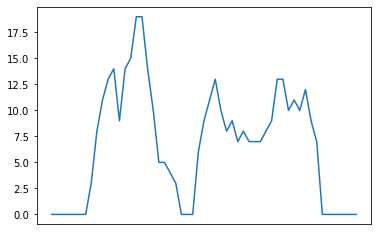

CHARACTER THRESHOLD :  1.0
CHARACTER SEGMENTS :  [[7, 23], 3, [26, 48]]
DIMENSION :  2
SHAPE :  (38, 73)
SIZE(NO OF PIXELS) :  2774


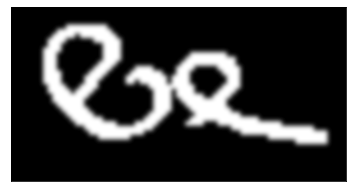

[0, 0, 0, 0, 0, 0, 0, 8, 12, 15, 13, 9, 9, 9, 10, 12, 13, 13, 13, 13, 15, 13, 11, 8, 3, 5, 5, 6, 7, 7, 9, 12, 11, 9, 6, 3, 7, 9, 12, 12, 10, 10, 8, 8, 9, 12, 14, 13, 12, 9, 4, 4, 4, 4, 3, 3, 4, 4, 4, 3, 3, 3, 4, 4, 4, 4, 3, 3, 3, 0, 0, 0, 0]


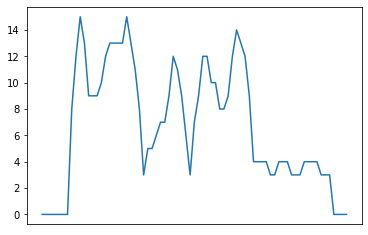

CHARACTER THRESHOLD :  0.0
CHARACTER SEGMENTS :  [[7, 69]]
DIMENSION :  2
SHAPE :  (33, 167)
SIZE(NO OF PIXELS) :  5511


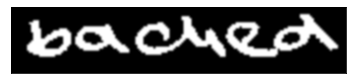

[0, 0, 0, 0, 0, 0, 0, 0, 3, 6, 11, 17, 17, 17, 14, 9, 9, 8, 8, 7, 8, 8, 7, 6, 8, 8, 11, 11, 8, 6, 0, 0, 4, 7, 9, 10, 9, 7, 7, 7, 6, 6, 7, 8, 8, 10, 10, 11, 10, 9, 8, 7, 5, 5, 5, 4, 4, 3, 2, 0, 0, 0, 4, 8, 10, 12, 9, 9, 8, 7, 7, 6, 7, 8, 9, 9, 11, 10, 7, 3, 3, 3, 3, 3, 3, 6, 12, 11, 11, 11, 8, 8, 7, 5, 4, 3, 3, 8, 7, 8, 9, 9, 8, 7, 7, 6, 4, 2, 7, 9, 11, 9, 8, 8, 7, 10, 12, 12, 11, 13, 13, 11, 9, 5, 4, 4, 4, 4, 3, 4, 4, 8, 10, 8, 10, 8, 7, 7, 6, 6, 6, 6, 6, 7, 12, 12, 15, 14, 12, 9, 8, 6, 7, 6, 7, 6, 6, 6, 6, 6, 4, 3, 2, 0, 0, 0, 0]


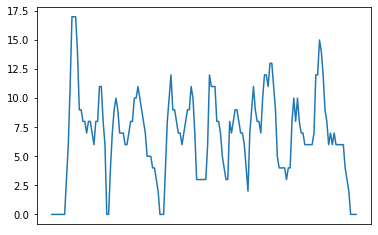

CHARACTER THRESHOLD :  1.2018504251546631
CHARACTER SEGMENTS :  [[8, 30], 2, [32, 59], 3, [62, 163]]
DIMENSION :  2
SHAPE :  (39, 65)
SIZE(NO OF PIXELS) :  2535


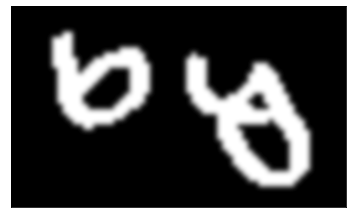

[0, 0, 0, 0, 0, 0, 0, 0, 6, 13, 16, 17, 13, 10, 10, 9, 8, 7, 7, 6, 6, 8, 8, 12, 12, 10, 6, 0, 0, 0, 0, 0, 0, 0, 7, 10, 10, 11, 5, 4, 8, 10, 12, 14, 15, 15, 15, 14, 14, 15, 13, 13, 12, 12, 16, 13, 11, 8, 0, 0, 0, 0, 0, 0, 0]


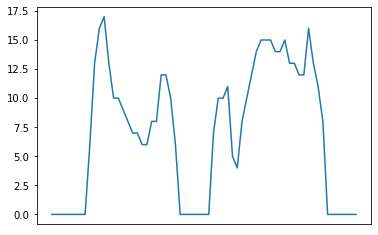

CHARACTER THRESHOLD :  2.3333333333333335
CHARACTER SEGMENTS :  [[8, 27], 7, [34, 58]]
DIMENSION :  2
SHAPE :  (31, 68)
SIZE(NO OF PIXELS) :  2108


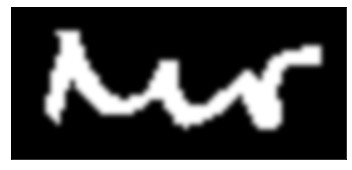

[0, 0, 0, 0, 0, 0, 0, 4, 10, 15, 16, 12, 10, 12, 10, 8, 7, 7, 6, 5, 4, 4, 3, 3, 4, 3, 3, 3, 4, 6, 8, 10, 11, 13, 7, 6, 4, 4, 4, 3, 4, 4, 5, 4, 4, 4, 4, 7, 9, 10, 10, 12, 14, 15, 11, 4, 3, 3, 3, 4, 4, 4, 4, 0, 0, 0, 0, 0]


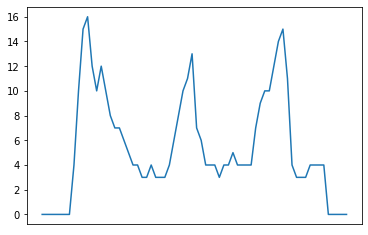

CHARACTER THRESHOLD :  0.0
CHARACTER SEGMENTS :  [[7, 63]]
DIMENSION :  2
SHAPE :  (31, 89)
SIZE(NO OF PIXELS) :  2759


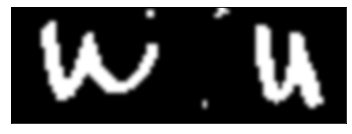

[0, 0, 0, 0, 0, 0, 0, 0, 5, 12, 17, 19, 15, 9, 6, 5, 7, 8, 10, 11, 11, 12, 10, 8, 6, 6, 5, 4, 3, 3, 3, 3, 4, 4, 5, 6, 10, 8, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 3, 2, 1, 0, 0, 0, 0, 0, 0, 0, 11, 15, 19, 19, 11, 6, 3, 5, 8, 16, 14, 14, 16, 14, 12, 10, 6, 2, 0, 0, 0, 0, 0, 0]


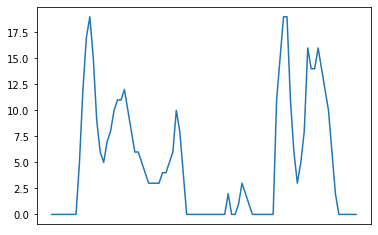

CHARACTER THRESHOLD :  4.678556282539399
CHARACTER SEGMENTS :  [[8, 39], 12, [51, 52], 2, [54, 58], 7, [65, 83]]
DIMENSION :  2
SHAPE :  (43, 187)
SIZE(NO OF PIXELS) :  8041


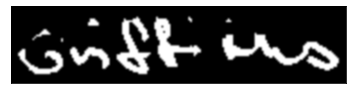

[0, 0, 0, 0, 2, 5, 7, 8, 3, 3, 4, 3, 5, 5, 5, 4, 5, 5, 6, 9, 8, 7, 6, 8, 8, 10, 10, 8, 7, 0, 0, 0, 0, 3, 6, 8, 8, 7, 5, 4, 5, 6, 6, 7, 8, 9, 9, 7, 6, 5, 6, 10, 9, 7, 4, 0, 0, 0, 0, 3, 4, 6, 14, 20, 22, 23, 19, 16, 16, 16, 16, 18, 18, 21, 19, 15, 6, 1, 0, 0, 4, 11, 17, 22, 22, 23, 26, 24, 20, 12, 12, 9, 6, 4, 3, 3, 3, 3, 3, 5, 6, 3, 6, 5, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 8, 13, 16, 15, 14, 7, 6, 5, 5, 4, 4, 4, 4, 4, 3, 3, 3, 10, 8, 7, 7, 9, 11, 9, 7, 6, 5, 5, 6, 7, 7, 6, 5, 5, 4, 4, 4, 4, 3, 3, 4, 3, 3, 4, 7, 7, 8, 8, 7, 9, 9, 10, 9, 9, 9, 9, 9, 9, 9, 10, 9, 7, 6, 3, 0, 0, 0, 0]


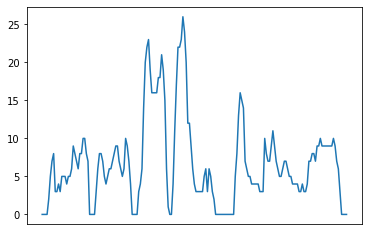

CHARACTER THRESHOLD :  4.47213595499958
CHARACTER SEGMENTS :  [[4, 29], 4, [33, 55], 4, [59, 78], 2, [80, 106], 12, [118, 183]]
DIMENSION :  2
SHAPE :  (33, 43)
SIZE(NO OF PIXELS) :  1419


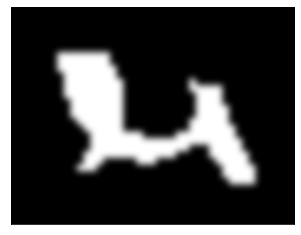

[0, 0, 0, 0, 0, 0, 0, 3, 7, 10, 12, 15, 18, 17, 16, 14, 12, 4, 4, 5, 4, 4, 3, 3, 3, 3, 3, 6, 9, 9, 11, 12, 11, 9, 7, 5, 3, 0, 0, 0, 0, 0, 0]


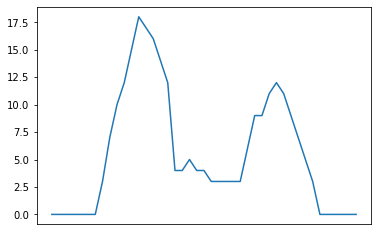

CHARACTER THRESHOLD :  0.0
CHARACTER SEGMENTS :  [[7, 37]]
DIMENSION :  2
SHAPE :  (32, 39)
SIZE(NO OF PIXELS) :  1248


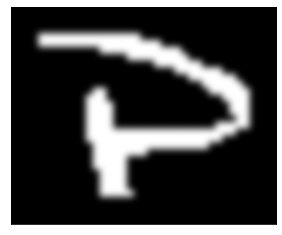

[0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 9, 14, 19, 17, 13, 13, 9, 8, 7, 6, 7, 6, 6, 7, 6, 6, 6, 6, 6, 7, 6, 8, 7, 6, 0, 0, 0, 0]


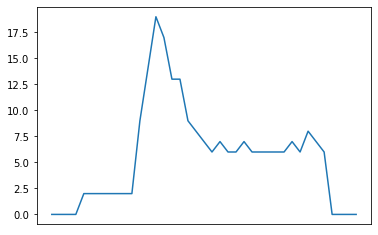

CHARACTER THRESHOLD :  0.0
CHARACTER SEGMENTS :  [[4, 35]]
DIMENSION :  2
SHAPE :  (35, 85)
SIZE(NO OF PIXELS) :  2975


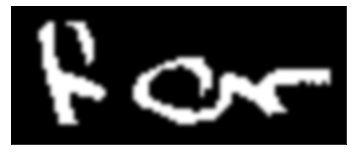

[0, 0, 0, 0, 0, 0, 0, 3, 11, 16, 19, 14, 14, 13, 14, 10, 7, 10, 13, 13, 10, 4, 4, 2, 0, 0, 0, 0, 0, 0, 0, 4, 7, 9, 9, 6, 5, 5, 4, 5, 6, 5, 6, 6, 7, 7, 7, 7, 13, 9, 8, 3, 4, 9, 9, 8, 5, 4, 5, 5, 5, 4, 5, 7, 9, 11, 10, 8, 6, 5, 4, 4, 4, 3, 3, 4, 3, 4, 4, 3, 4, 0, 0, 0, 0]


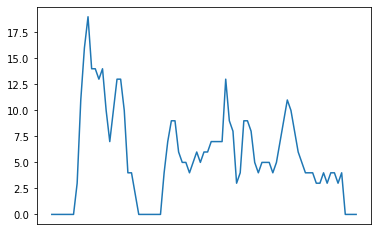

CHARACTER THRESHOLD :  2.3333333333333335
CHARACTER SEGMENTS :  [[7, 24], 7, [31, 81]]
DIMENSION :  2
SHAPE :  (33, 234)
SIZE(NO OF PIXELS) :  7722


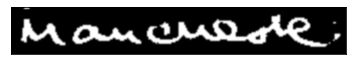

[0, 0, 0, 0, 0, 0, 0, 2, 9, 17, 18, 14, 12, 10, 8, 6, 6, 5, 4, 3, 4, 3, 4, 4, 4, 6, 7, 8, 10, 11, 11, 8, 6, 4, 4, 3, 2, 2, 0, 0, 0, 0, 0, 3, 7, 9, 11, 9, 7, 6, 6, 6, 6, 6, 7, 10, 9, 8, 8, 9, 8, 5, 5, 4, 4, 4, 3, 3, 3, 3, 4, 6, 7, 8, 7, 5, 5, 4, 4, 3, 4, 4, 6, 7, 8, 5, 4, 4, 3, 3, 2, 0, 0, 0, 0, 4, 8, 9, 10, 7, 5, 5, 3, 4, 4, 5, 6, 12, 11, 10, 8, 3, 2, 3, 3, 2, 3, 12, 11, 10, 9, 8, 7, 5, 4, 4, 3, 3, 3, 3, 5, 6, 7, 7, 8, 6, 6, 5, 4, 4, 4, 6, 10, 12, 15, 11, 8, 7, 7, 6, 5, 7, 8, 10, 13, 13, 12, 7, 3, 3, 3, 3, 3, 3, 2, 3, 5, 6, 7, 8, 8, 7, 7, 7, 11, 11, 11, 10, 5, 3, 4, 4, 8, 9, 10, 12, 14, 14, 6, 5, 3, 4, 3, 6, 9, 11, 13, 10, 11, 12, 10, 9, 9, 10, 9, 11, 12, 8, 6, 4, 4, 3, 3, 3, 3, 3, 2, 2, 2, 2, 1, 0, 1, 0, 0, 2, 5, 4, 3, 2, 0, 0, 0, 0]


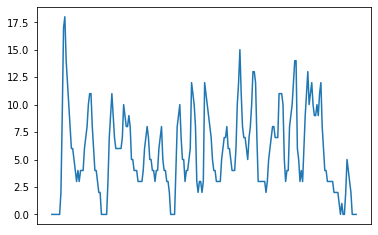

CHARACTER THRESHOLD :  2.260776661041756
CHARACTER SEGMENTS :  [[7, 38], 5, [43, 91], 4, [95, 221], 1, [222, 223], 2, [225, 230]]
DIMENSION :  2
SHAPE :  (40, 231)
SIZE(NO OF PIXELS) :  9240


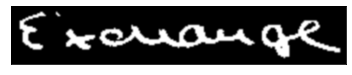

[0, 0, 0, 0, 0, 0, 6, 6, 15, 15, 16, 15, 11, 10, 9, 9, 9, 7, 7, 6, 6, 5, 2, 1, 0, 0, 0, 0, 0, 0, 0, 2, 2, 1, 0, 0, 0, 0, 5, 8, 11, 11, 9, 7, 6, 6, 7, 8, 8, 9, 9, 8, 8, 7, 5, 3, 3, 2, 0, 0, 0, 2, 6, 9, 9, 9, 7, 7, 6, 6, 7, 7, 7, 8, 10, 8, 7, 2, 3, 3, 3, 3, 4, 8, 8, 7, 8, 8, 7, 6, 5, 5, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 8, 8, 9, 9, 8, 7, 5, 5, 4, 5, 4, 4, 3, 4, 10, 11, 12, 10, 8, 7, 7, 6, 5, 5, 5, 9, 12, 13, 12, 11, 11, 7, 5, 4, 4, 4, 3, 3, 3, 3, 8, 8, 8, 8, 6, 3, 3, 3, 3, 3, 3, 4, 3, 4, 6, 7, 8, 9, 6, 5, 4, 5, 4, 3, 2, 1, 0, 0, 0, 0, 0, 7, 11, 13, 10, 9, 7, 6, 5, 5, 8, 13, 20, 21, 19, 16, 16, 14, 14, 11, 3, 3, 3, 3, 3, 3, 5, 7, 11, 13, 12, 12, 11, 9, 9, 8, 9, 9, 10, 8, 6, 3, 3, 4, 3, 3, 4, 3, 3, 3, 3, 4, 3, 3, 3, 0, 0, 0, 0]


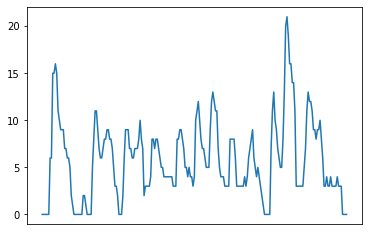

CHARACTER THRESHOLD :  3.3166247903554
CHARACTER SEGMENTS :  [[6, 24], 7, [31, 34], 4, [38, 58], 3, [61, 168], 5, [173, 227]]


In [24]:
CHARACTERS=[]
for sen_no in range(len(SENTENCES)):
    Characters_in_Sentences=[]
    for word_no in range(len(WORDS[sen_no])):
        Pre_Processed_Binary_Image=WORDS[sen_no][word_no][1]
        show_image(Pre_Processed_Binary_Image,cmap='binary')
        
        Characters_in_Words=First_Level_Character_Segmentation_Under_VPP(Pre_Processed_Binary_Image)
        Characters_in_Sentences.append(Characters_in_Words)
        
    CHARACTERS.append(Characters_in_Sentences)
        

BOUNDARIES OF THE IMAGE :  [8, 0, 14, 28]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (28, 14)
SIZE(NO OF PIXELS) :  392


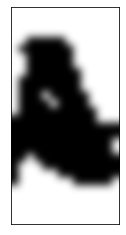

BOUNDARIES OF THE IMAGE :  [8, 0, 58, 34]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (34, 58)
SIZE(NO OF PIXELS) :  1972


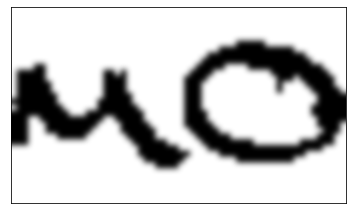

BOUNDARIES OF THE IMAGE :  [70, 0, 18, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 18)
SIZE(NO OF PIXELS) :  612


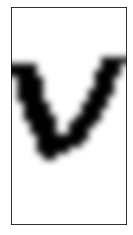

BOUNDARIES OF THE IMAGE :  [92, 0, 17, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 17)
SIZE(NO OF PIXELS) :  578


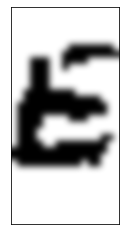

BOUNDARIES OF THE IMAGE :  [6, 0, 14, 29]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (29, 14)
SIZE(NO OF PIXELS) :  406


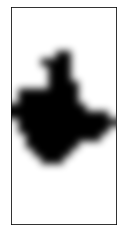

BOUNDARIES OF THE IMAGE :  [22, 0, 20, 29]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (29, 20)
SIZE(NO OF PIXELS) :  580


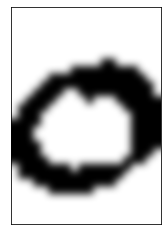

BOUNDARIES OF THE IMAGE :  [4, 0, 17, 35]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (35, 17)
SIZE(NO OF PIXELS) :  595


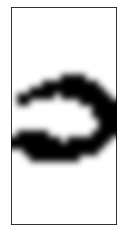

BOUNDARIES OF THE IMAGE :  [23, 0, 39, 35]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (35, 39)
SIZE(NO OF PIXELS) :  1365


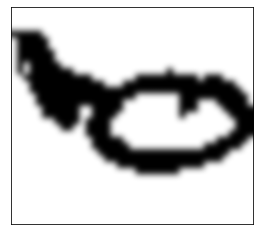

BOUNDARIES OF THE IMAGE :  [65, 0, 22, 35]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (35, 22)
SIZE(NO OF PIXELS) :  770


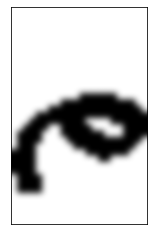

BOUNDARIES OF THE IMAGE :  [8, 0, 50, 34]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (34, 50)
SIZE(NO OF PIXELS) :  1700


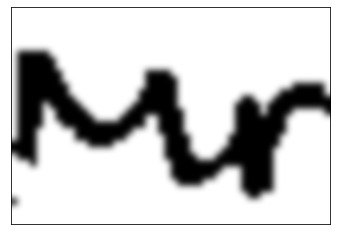

BOUNDARIES OF THE IMAGE :  [5, 0, 68, 44]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (44, 68)
SIZE(NO OF PIXELS) :  2992


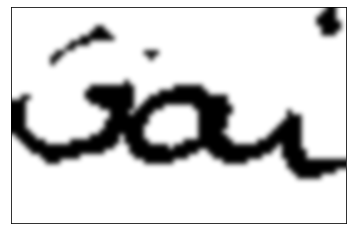

BOUNDARIES OF THE IMAGE :  [78, 0, 28, 44]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (44, 28)
SIZE(NO OF PIXELS) :  1232


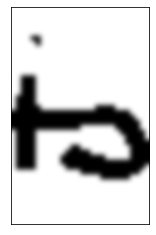

BOUNDARIES OF THE IMAGE :  [115, 0, 78, 44]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (44, 78)
SIZE(NO OF PIXELS) :  3432


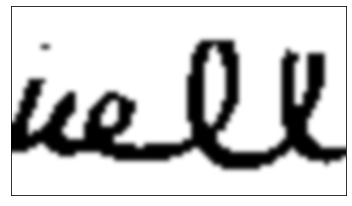

BOUNDARIES OF THE IMAGE :  [9, 0, 28, 37]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (37, 28)
SIZE(NO OF PIXELS) :  1036


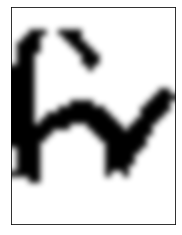

BOUNDARIES OF THE IMAGE :  [38, 0, 57, 37]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (37, 57)
SIZE(NO OF PIXELS) :  2109


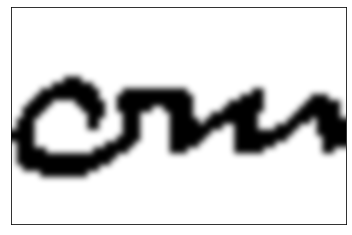

BOUNDARIES OF THE IMAGE :  [73, 0, 9, 51]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (51, 9)
SIZE(NO OF PIXELS) :  459


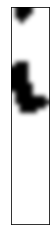

BOUNDARIES OF THE IMAGE :  [111, 0, 62, 51]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (51, 62)
SIZE(NO OF PIXELS) :  3162


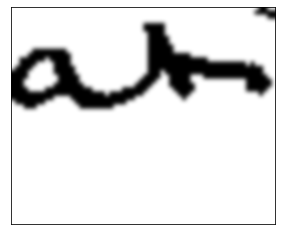

BOUNDARIES OF THE IMAGE :  [180, 0, 48, 51]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (51, 48)
SIZE(NO OF PIXELS) :  2448


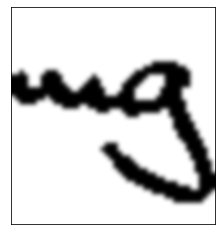

BOUNDARIES OF THE IMAGE :  [4, 0, 73, 48]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (48, 73)
SIZE(NO OF PIXELS) :  3504


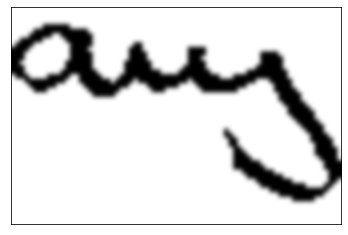

BOUNDARIES OF THE IMAGE :  [4, 0, 46, 30]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (30, 46)
SIZE(NO OF PIXELS) :  1380


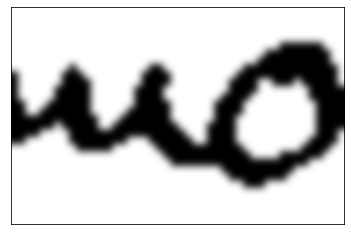

BOUNDARIES OF THE IMAGE :  [54, 0, 45, 30]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (30, 45)
SIZE(NO OF PIXELS) :  1350


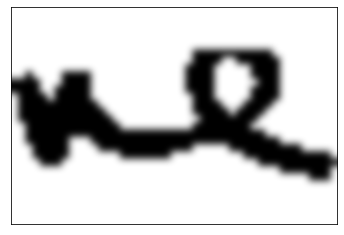

BOUNDARIES OF THE IMAGE :  [7, 0, 19, 36]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (36, 19)
SIZE(NO OF PIXELS) :  684


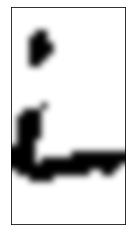

BOUNDARIES OF THE IMAGE :  [77, 0, 71, 36]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (36, 71)
SIZE(NO OF PIXELS) :  2556


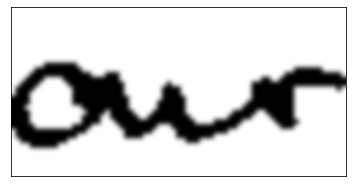

BOUNDARIES OF THE IMAGE :  [8, 0, 26, 37]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (37, 26)
SIZE(NO OF PIXELS) :  962


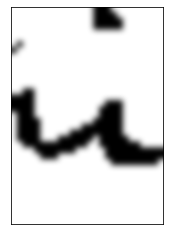

BOUNDARIES OF THE IMAGE :  [39, 0, 48, 37]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (37, 48)
SIZE(NO OF PIXELS) :  1776


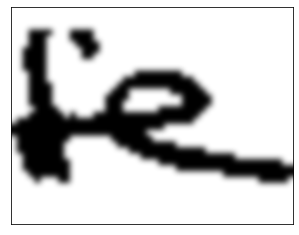

BOUNDARIES OF THE IMAGE :  [4, 0, 109, 47]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (47, 109)
SIZE(NO OF PIXELS) :  5123


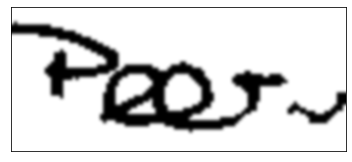

BOUNDARIES OF THE IMAGE :  [4, 0, 33, 25]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (25, 33)
SIZE(NO OF PIXELS) :  825


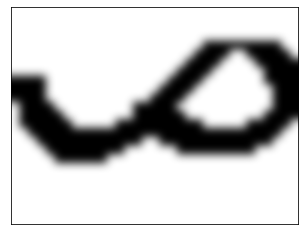

BOUNDARIES OF THE IMAGE :  [8, 0, 12, 30]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (30, 12)
SIZE(NO OF PIXELS) :  360


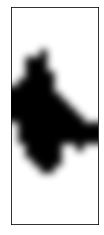

BOUNDARIES OF THE IMAGE :  [22, 0, 23, 30]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (30, 23)
SIZE(NO OF PIXELS) :  690


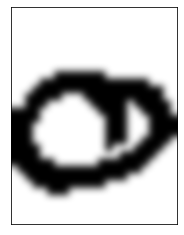

BOUNDARIES OF THE IMAGE :  [7, 0, 49, 37]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (37, 49)
SIZE(NO OF PIXELS) :  1813


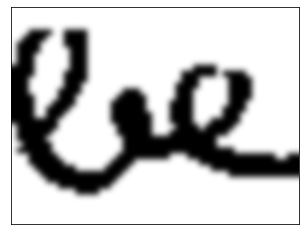

BOUNDARIES OF THE IMAGE :  [4, 0, 34, 32]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (32, 34)
SIZE(NO OF PIXELS) :  1088


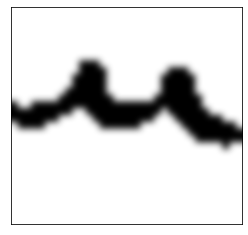

BOUNDARIES OF THE IMAGE :  [40, 0, 94, 32]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (32, 94)
SIZE(NO OF PIXELS) :  3008


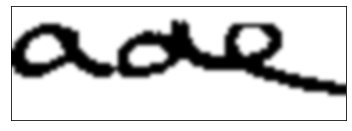

BOUNDARIES OF THE IMAGE :  [4, 0, 40, 33]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (33, 40)
SIZE(NO OF PIXELS) :  1320


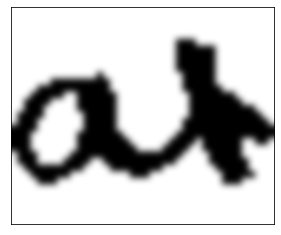

BOUNDARIES OF THE IMAGE :  [4, 0, 28, 25]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (25, 28)
SIZE(NO OF PIXELS) :  700


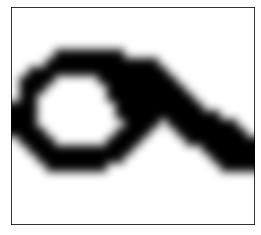

BOUNDARIES OF THE IMAGE :  [4, 0, 107, 51]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (51, 107)
SIZE(NO OF PIXELS) :  5457


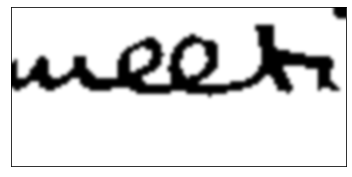

BOUNDARIES OF THE IMAGE :  [114, 0, 24, 51]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (51, 24)
SIZE(NO OF PIXELS) :  1224


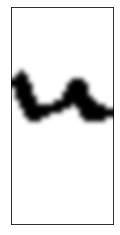

BOUNDARIES OF THE IMAGE :  [141, 0, 32, 51]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (51, 32)
SIZE(NO OF PIXELS) :  1632


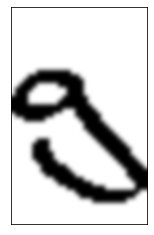

BOUNDARIES OF THE IMAGE :  [4, 0, 42, 41]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (41, 42)
SIZE(NO OF PIXELS) :  1722


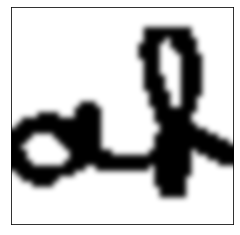

BOUNDARIES OF THE IMAGE :  [6, 0, 18, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 18)
SIZE(NO OF PIXELS) :  684


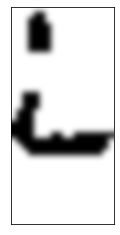

BOUNDARIES OF THE IMAGE :  [26, 0, 125, 38]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (38, 125)
SIZE(NO OF PIXELS) :  4750


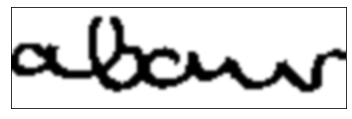

BOUNDARIES OF THE IMAGE :  [9, 0, 25, 43]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (43, 25)
SIZE(NO OF PIXELS) :  1075


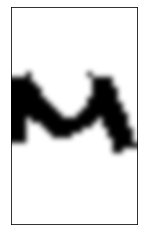

BOUNDARIES OF THE IMAGE :  [44, 0, 28, 43]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (43, 28)
SIZE(NO OF PIXELS) :  1204


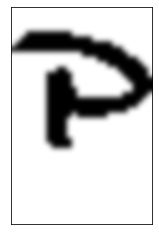

BOUNDARIES OF THE IMAGE :  [78, 0, 20, 43]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (43, 20)
SIZE(NO OF PIXELS) :  860


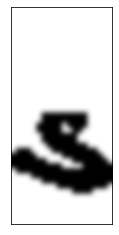

BOUNDARIES OF THE IMAGE :  [5, 0, 109, 34]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (34, 109)
SIZE(NO OF PIXELS) :  3706


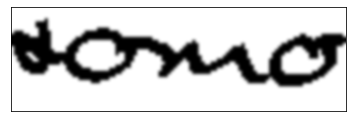

BOUNDARIES OF THE IMAGE :  [117, 0, 18, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 18)
SIZE(NO OF PIXELS) :  612


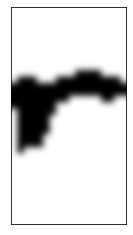

BOUNDARIES OF THE IMAGE :  [218, 0, 6, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 6)
SIZE(NO OF PIXELS) :  204


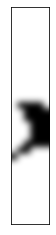

BOUNDARIES OF THE IMAGE :  [3, 0, 1, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 1)
SIZE(NO OF PIXELS) :  33


BOUNDARIES OF THE IMAGE :  [7, 0, 64, 33]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (33, 64)
SIZE(NO OF PIXELS) :  2112


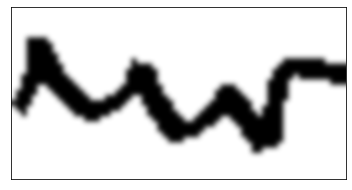

BOUNDARIES OF THE IMAGE :  [7, 0, 46, 32]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (32, 46)
SIZE(NO OF PIXELS) :  1472


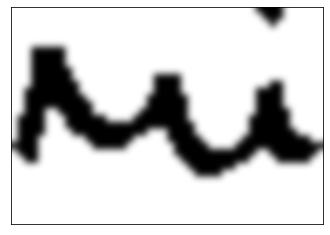

BOUNDARIES OF THE IMAGE :  [56, 0, 51, 32]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (32, 51)
SIZE(NO OF PIXELS) :  1632


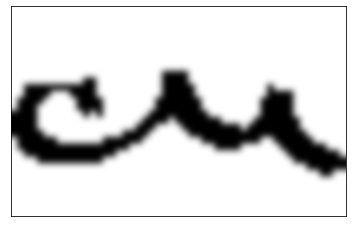

BOUNDARIES OF THE IMAGE :  [158, 0, 11, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 11)
SIZE(NO OF PIXELS) :  352


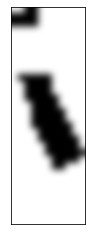

BOUNDARIES OF THE IMAGE :  [5, 0, 65, 42]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (42, 65)
SIZE(NO OF PIXELS) :  2730


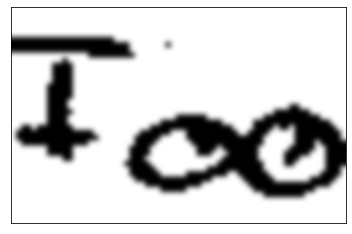

BOUNDARIES OF THE IMAGE :  [73, 0, 17, 42]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (42, 17)
SIZE(NO OF PIXELS) :  714


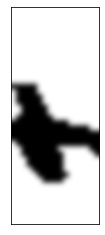

BOUNDARIES OF THE IMAGE :  [5, 0, 18, 31]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (31, 18)
SIZE(NO OF PIXELS) :  558


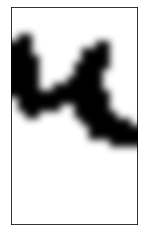

BOUNDARIES OF THE IMAGE :  [24, 0, 47, 31]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (31, 47)
SIZE(NO OF PIXELS) :  1457


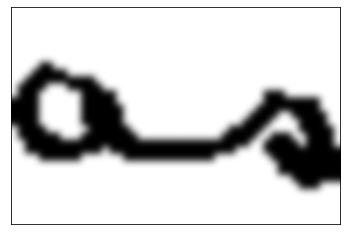

BOUNDARIES OF THE IMAGE :  [9, 0, 19, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 19)
SIZE(NO OF PIXELS) :  722


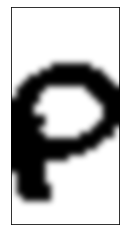

BOUNDARIES OF THE IMAGE :  [29, 0, 57, 38]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (38, 57)
SIZE(NO OF PIXELS) :  2166


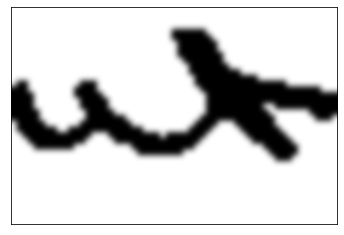

BOUNDARIES OF THE IMAGE :  [6, 0, 51, 33]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (33, 51)
SIZE(NO OF PIXELS) :  1683


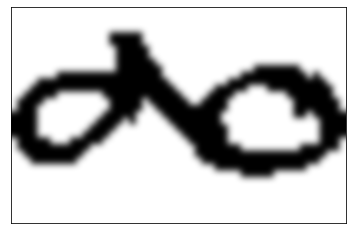

BOUNDARIES OF THE IMAGE :  [61, 0, 35, 33]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (33, 35)
SIZE(NO OF PIXELS) :  1155


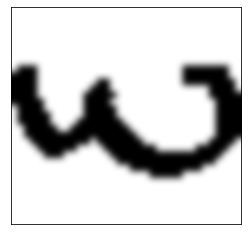

BOUNDARIES OF THE IMAGE :  [98, 0, 20, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 20)
SIZE(NO OF PIXELS) :  660


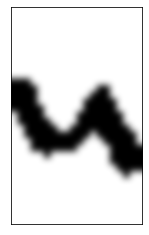

BOUNDARIES OF THE IMAGE :  [5, 0, 26, 26]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (26, 26)
SIZE(NO OF PIXELS) :  676


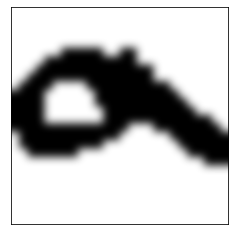

BOUNDARIES OF THE IMAGE :  [18, 0, 45, 33]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (33, 45)
SIZE(NO OF PIXELS) :  1485


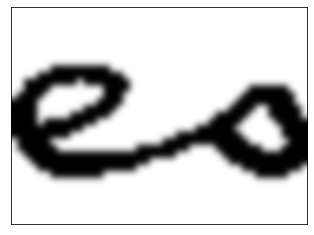

BOUNDARIES OF THE IMAGE :  [69, 0, 25, 33]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (33, 25)
SIZE(NO OF PIXELS) :  825


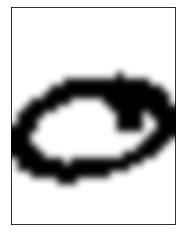

BOUNDARIES OF THE IMAGE :  [169, 0, 49, 33]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (33, 49)
SIZE(NO OF PIXELS) :  1617


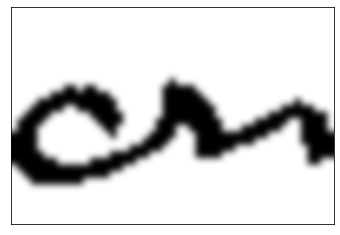

BOUNDARIES OF THE IMAGE :  [4, 0, 37, 25]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (25, 37)
SIZE(NO OF PIXELS) :  925


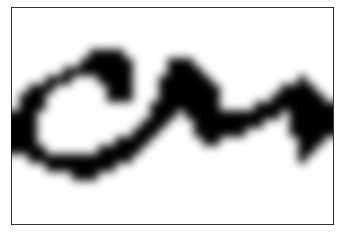

BOUNDARIES OF THE IMAGE :  [8, 0, 16, 35]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (35, 16)
SIZE(NO OF PIXELS) :  560


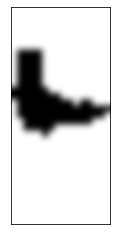

BOUNDARIES OF THE IMAGE :  [30, 0, 54, 35]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (35, 54)
SIZE(NO OF PIXELS) :  1890


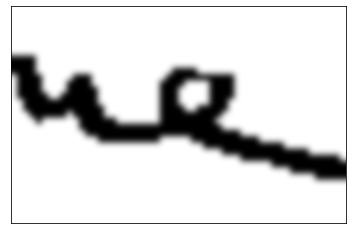

BOUNDARIES OF THE IMAGE :  [4, 0, 115, 53]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (53, 115)
SIZE(NO OF PIXELS) :  6095


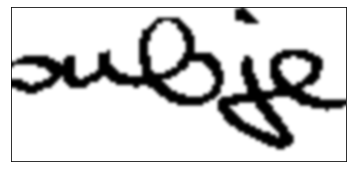

BOUNDARIES OF THE IMAGE :  [120, 0, 42, 53]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (53, 42)
SIZE(NO OF PIXELS) :  2226


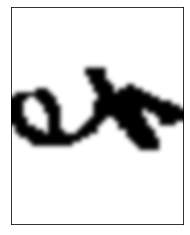

BOUNDARIES OF THE IMAGE :  [4, 0, 58, 33]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (33, 58)
SIZE(NO OF PIXELS) :  1914


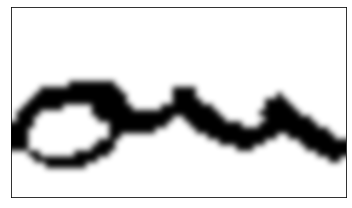

BOUNDARIES OF THE IMAGE :  [64, 0, 35, 33]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (33, 35)
SIZE(NO OF PIXELS) :  1155


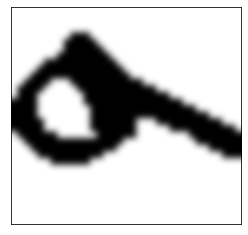

BOUNDARIES OF THE IMAGE :  [7, 0, 58, 32]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (32, 58)
SIZE(NO OF PIXELS) :  1856


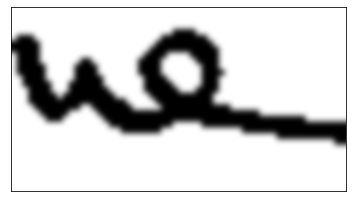

BOUNDARIES OF THE IMAGE :  [4, 0, 26, 28]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (28, 26)
SIZE(NO OF PIXELS) :  728


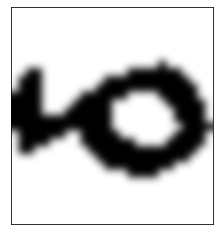

BOUNDARIES OF THE IMAGE :  [7, 0, 16, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 16)
SIZE(NO OF PIXELS) :  512


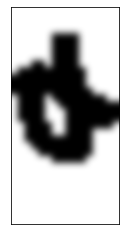

BOUNDARIES OF THE IMAGE :  [26, 0, 22, 32]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (32, 22)
SIZE(NO OF PIXELS) :  704


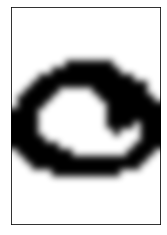

BOUNDARIES OF THE IMAGE :  [7, 0, 62, 38]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (38, 62)
SIZE(NO OF PIXELS) :  2356


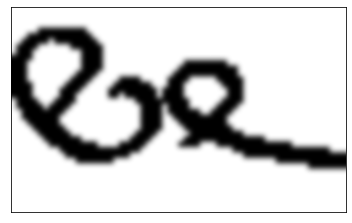

BOUNDARIES OF THE IMAGE :  [8, 0, 22, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 22)
SIZE(NO OF PIXELS) :  726


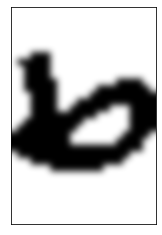

BOUNDARIES OF THE IMAGE :  [32, 0, 27, 33]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (33, 27)
SIZE(NO OF PIXELS) :  891


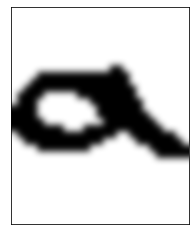

BOUNDARIES OF THE IMAGE :  [62, 0, 101, 33]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (33, 101)
SIZE(NO OF PIXELS) :  3333


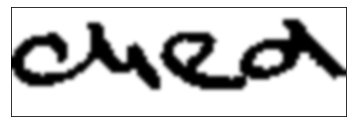

BOUNDARIES OF THE IMAGE :  [8, 0, 19, 39]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (39, 19)
SIZE(NO OF PIXELS) :  741


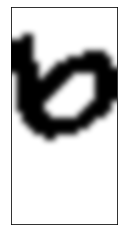

BOUNDARIES OF THE IMAGE :  [34, 0, 24, 39]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (39, 24)
SIZE(NO OF PIXELS) :  936


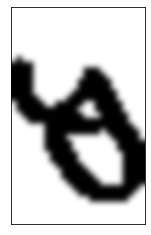

BOUNDARIES OF THE IMAGE :  [7, 0, 56, 31]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (31, 56)
SIZE(NO OF PIXELS) :  1736


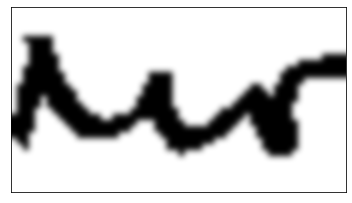

BOUNDARIES OF THE IMAGE :  [8, 0, 31, 31]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (31, 31)
SIZE(NO OF PIXELS) :  961


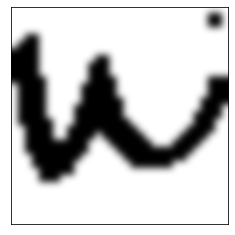

BOUNDARIES OF THE IMAGE :  [54, 0, 4, 31]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (31, 4)
SIZE(NO OF PIXELS) :  124


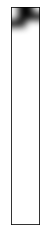

BOUNDARIES OF THE IMAGE :  [65, 0, 18, 31]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (31, 18)
SIZE(NO OF PIXELS) :  558


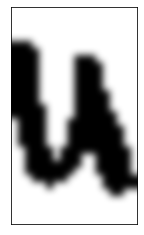

BOUNDARIES OF THE IMAGE :  [80, 0, 26, 43]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (43, 26)
SIZE(NO OF PIXELS) :  1118


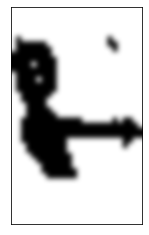

BOUNDARIES OF THE IMAGE :  [118, 0, 65, 43]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (43, 65)
SIZE(NO OF PIXELS) :  2795


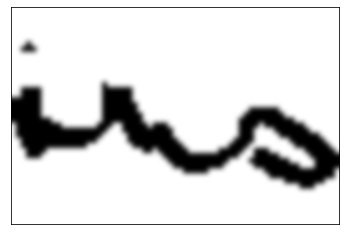

BOUNDARIES OF THE IMAGE :  [7, 0, 30, 33]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (33, 30)
SIZE(NO OF PIXELS) :  990


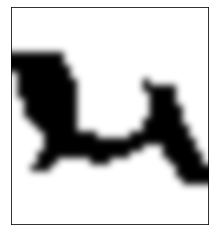

BOUNDARIES OF THE IMAGE :  [4, 0, 31, 32]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (32, 31)
SIZE(NO OF PIXELS) :  992


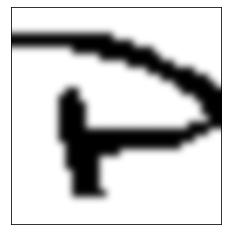

BOUNDARIES OF THE IMAGE :  [7, 0, 17, 35]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (35, 17)
SIZE(NO OF PIXELS) :  595


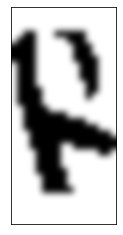

BOUNDARIES OF THE IMAGE :  [31, 0, 50, 35]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (35, 50)
SIZE(NO OF PIXELS) :  1750


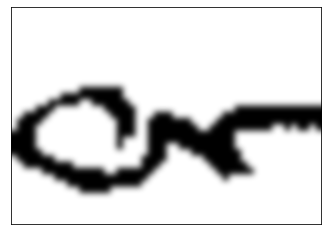

BOUNDARIES OF THE IMAGE :  [7, 0, 31, 33]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (33, 31)
SIZE(NO OF PIXELS) :  1023


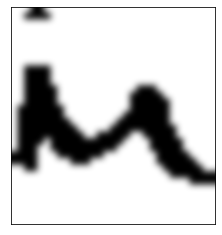

BOUNDARIES OF THE IMAGE :  [43, 0, 48, 33]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (33, 48)
SIZE(NO OF PIXELS) :  1584


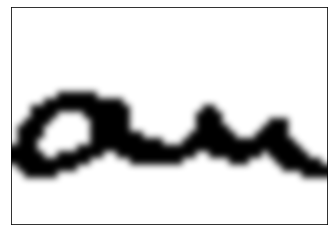

BOUNDARIES OF THE IMAGE :  [225, 0, 5, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 5)
SIZE(NO OF PIXELS) :  165


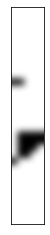

BOUNDARIES OF THE IMAGE :  [6, 0, 18, 40]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (40, 18)
SIZE(NO OF PIXELS) :  720


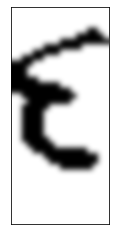

BOUNDARIES OF THE IMAGE :  [31, 0, 3, 40]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (40, 3)
SIZE(NO OF PIXELS) :  120


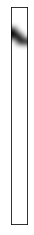

BOUNDARIES OF THE IMAGE :  [61, 0, 107, 40]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (40, 107)
SIZE(NO OF PIXELS) :  4280


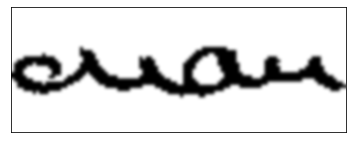

BOUNDARIES OF THE IMAGE :  [173, 0, 54, 40]
IT IS A CONNECTED COMPONENT
DIMENSION :  2
SHAPE :  (40, 54)
SIZE(NO OF PIXELS) :  2160


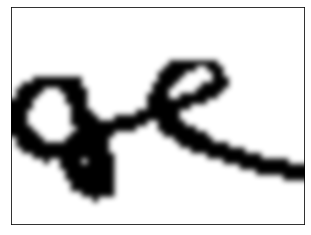

In [25]:
for sen_no in range(len(SENTENCES)):
    for word_no in range(len(WORDS[sen_no])):
        for char_no in range(len(CHARACTERS[sen_no][word_no])):
            print('BOUNDARIES OF THE IMAGE : ',CHARACTERS[sen_no][word_no][char_no][0])
            if(CHARACTERS[sen_no][word_no][char_no][2]==0):
                print("IT IS A SINGLE CHARACTER")
            else:
                print("IT IS A CONNECTED COMPONENT")
            show_image(CHARACTERS[sen_no][word_no][char_no][1],cmap='gray')

DIMENSION :  2
SHAPE :  (34, 58)
SIZE(NO OF PIXELS) :  1972


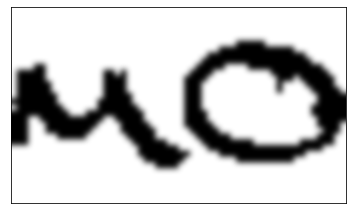

[7, 13, 13, 8, 9, 10, 9, 7, 6, 5, 4, 4, 4, 4, 3, 4, 8, 8, 8, 11, 8, 7, 8, 7, 6, 5, 5, 4, 4, 2, 10, 11, 13, 10, 9, 7, 8, 7, 6, 8, 8, 9, 8, 8, 7, 8, 11, 9, 9, 6, 8, 7, 9, 14, 13, 12, 8, 5]


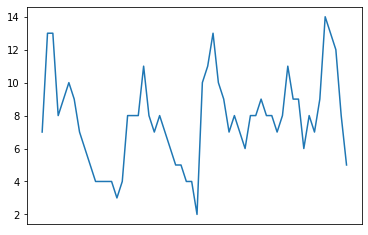

[18, 23, 23, 23, 24, 24, 21, 19, 17, 16, 15, 15, 15, 16, 16, 18, 23, 23, 22, 23, 19, 17, 16, 14, 13, 11, 11, 10, 10, 9, 22, 23, 24, 25, 26, 26, 27, 27, 27, 28, 28, 28, 28, 28, 27, 27, 27, 27, 27, 26, 26, 25, 24, 24, 23, 22, 20, 19]


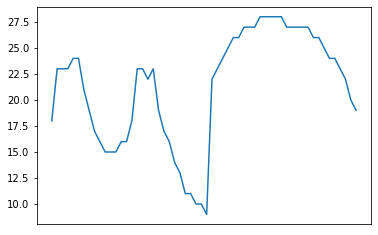

[25 36 36 31 33 34 30 26 23 21 19 19 19 20 19 22 31 31 30 34 27 24 24 21
 19 16 16 14 14 11 32 34 37 35 35 33 35 34 33 36 36 37 36 36 34 35 38 36
 36 32 34 32 33 38 36 34 28 24]


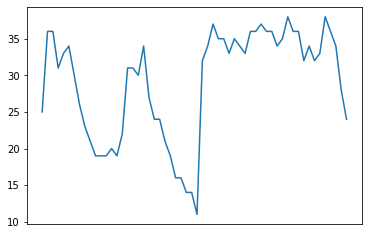

CHARACTERS BREAK POINTS :  [10, 14, 29]
DIMENSION :  2
SHAPE :  (29, 20)
SIZE(NO OF PIXELS) :  580


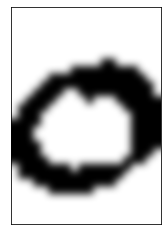

[6, 10, 11, 11, 8, 8, 7, 6, 6, 8, 9, 7, 8, 8, 7, 8, 13, 12, 10, 7]


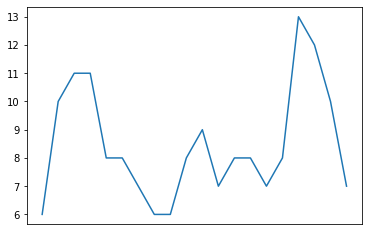

[14, 16, 17, 18, 19, 20, 20, 20, 21, 21, 21, 21, 22, 22, 21, 21, 21, 20, 19, 17]


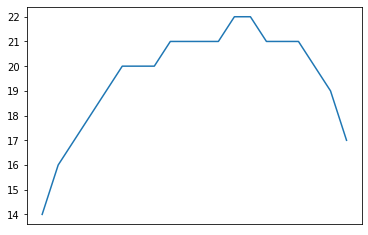

[20 26 28 29 27 28 27 26 27 29 30 28 30 30 28 29 34 32 29 24]


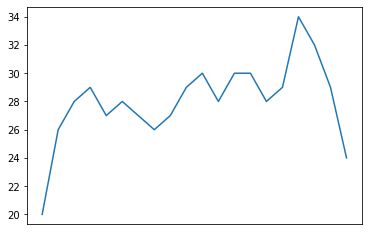

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (35, 39)
SIZE(NO OF PIXELS) :  1365


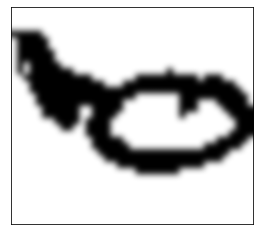

[1, 7, 6, 10, 12, 13, 11, 10, 10, 10, 8, 5, 8, 11, 12, 12, 9, 9, 7, 6, 7, 7, 7, 7, 7, 8, 7, 10, 9, 9, 6, 7, 7, 9, 8, 9, 10, 8, 5]


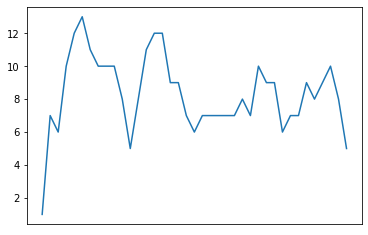

[31, 31, 31, 31, 31, 30, 28, 26, 25, 25, 24, 24, 24, 23, 23, 22, 22, 22, 23, 23, 24, 24, 24, 24, 24, 25, 24, 24, 24, 24, 23, 24, 24, 24, 23, 23, 22, 21, 19]


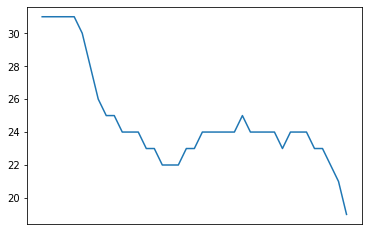

[32 38 37 41 43 43 39 36 35 35 32 29 32 34 35 34 31 31 30 29 31 31 31 31
 31 33 31 34 33 33 29 31 31 33 31 32 32 29 24]


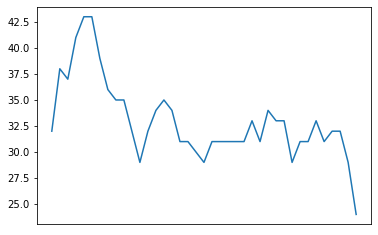

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (34, 50)
SIZE(NO OF PIXELS) :  1700


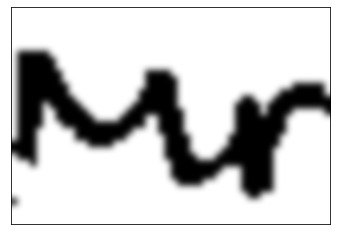

[3, 17, 17, 18, 12, 8, 8, 8, 7, 5, 6, 5, 5, 4, 4, 4, 3, 4, 4, 4, 6, 7, 7, 10, 14, 16, 12, 8, 5, 4, 3, 3, 3, 3, 5, 10, 15, 16, 15, 12, 14, 8, 7, 4, 4, 4, 4, 4, 4, 3]


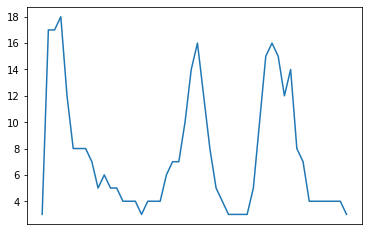

[13, 27, 27, 27, 27, 27, 26, 24, 22, 20, 19, 18, 17, 16, 16, 16, 16, 17, 18, 19, 21, 24, 24, 24, 24, 23, 18, 14, 11, 10, 10, 10, 11, 12, 14, 19, 20, 20, 19, 17, 19, 20, 21, 21, 22, 22, 22, 22, 22, 20]


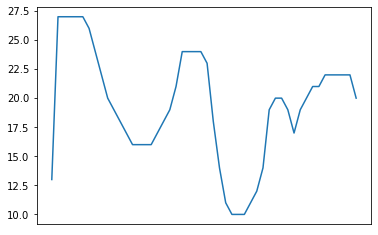

[16 44 44 45 39 35 34 32 29 25 25 23 22 20 20 20 19 21 22 23 27 31 31 34
 38 39 30 22 16 14 13 13 14 15 19 29 35 36 34 29 33 28 28 25 26 26 26 26
 26 23]


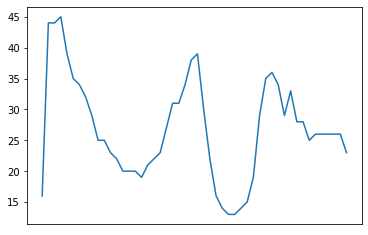

CHARACTERS BREAK POINTS :  [16, 30]
DIMENSION :  2
SHAPE :  (44, 68)
SIZE(NO OF PIXELS) :  2992


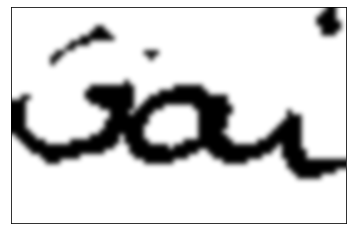

[7, 8, 10, 5, 4, 3, 4, 4, 6, 6, 4, 4, 6, 5, 5, 7, 10, 11, 13, 13, 14, 12, 10, 13, 13, 10, 11, 11, 10, 8, 8, 7, 6, 7, 7, 8, 7, 8, 13, 12, 12, 13, 13, 13, 7, 4, 4, 4, 3, 3, 4, 3, 4, 4, 4, 8, 12, 12, 13, 6, 4, 4, 6, 8, 9, 9, 4, 2]


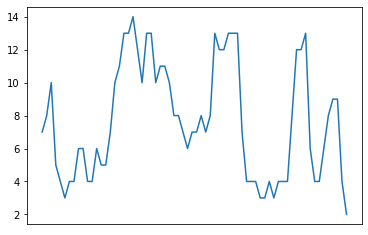

[25, 25, 26, 26, 18, 17, 17, 16, 34, 35, 35, 36, 37, 37, 38, 38, 39, 40, 40, 39, 38, 28, 28, 29, 28, 23, 24, 35, 35, 35, 27, 27, 27, 28, 28, 28, 28, 28, 28, 27, 26, 26, 26, 26, 24, 16, 16, 16, 16, 16, 17, 17, 18, 19, 20, 21, 23, 22, 22, 15, 13, 13, 42, 43, 44, 44, 41, 13]


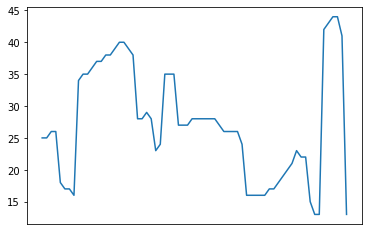

[32 33 36 31 22 20 21 20 40 41 39 40 43 42 43 45 49 51 53 52 52 40 38 42
 41 33 35 46 45 43 35 34 33 35 35 36 35 36 41 39 38 39 39 39 31 20 20 20
 19 19 21 20 22 23 24 29 35 34 35 21 17 17 48 51 53 53 45 15]


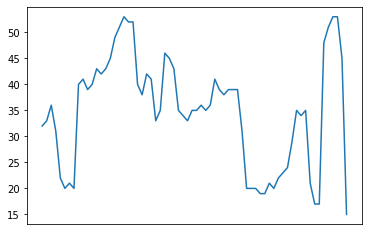

CHARACTERS BREAK POINTS :  [48, 60]
DIMENSION :  2
SHAPE :  (44, 78)
SIZE(NO OF PIXELS) :  3432


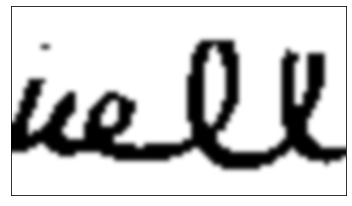

[7, 9, 12, 15, 12, 11, 7, 6, 7, 9, 11, 13, 12, 10, 9, 3, 3, 7, 10, 11, 12, 11, 10, 9, 9, 13, 12, 10, 7, 3, 3, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 14, 22, 24, 26, 13, 10, 11, 12, 18, 24, 21, 16, 4, 4, 4, 4, 4, 3, 3, 4, 3, 3, 20, 24, 22, 13, 12, 15, 21, 18, 15, 11, 4, 3, 3, 3, 2]


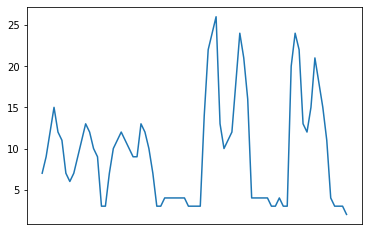

[17, 19, 22, 25, 27, 27, 27, 35, 35, 19, 21, 22, 23, 24, 24, 13, 13, 17, 20, 21, 22, 23, 24, 24, 24, 23, 23, 22, 22, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 28, 33, 35, 36, 36, 36, 36, 36, 36, 36, 36, 33, 10, 10, 10, 10, 10, 10, 10, 11, 11, 12, 32, 34, 33, 33, 21, 24, 33, 33, 33, 33, 11, 11, 11, 11, 11]


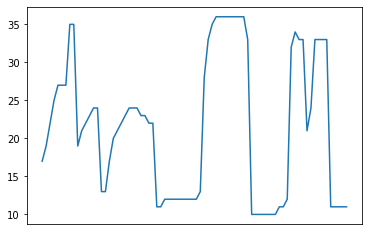

[24 28 34 40 39 38 34 41 42 28 32 35 35 34 33 16 16 24 30 32 34 34 34 33
 33 36 35 32 29 14 14 16 16 16 16 16 16 15 15 15 16 42 55 59 62 49 46 47
 48 54 60 57 49 14 14 14 14 14 13 13 15 14 15 52 58 55 46 33 39 54 51 48
 44 15 14 14 14 13]


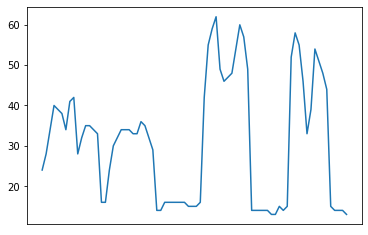

CHARACTERS BREAK POINTS :  [15, 29, 58]
DIMENSION :  2
SHAPE :  (37, 28)
SIZE(NO OF PIXELS) :  1036


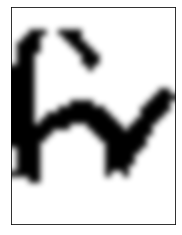

[15, 23, 24, 26, 14, 5, 4, 3, 5, 6, 7, 8, 8, 9, 7, 6, 11, 9, 8, 8, 7, 6, 7, 6, 5, 5, 4, 1]


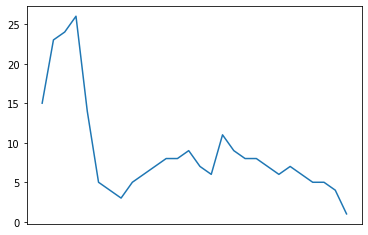

[27, 31, 32, 33, 33, 33, 19, 19, 33, 33, 33, 33, 31, 30, 29, 20, 19, 18, 17, 16, 17, 18, 20, 21, 22, 23, 23, 22]


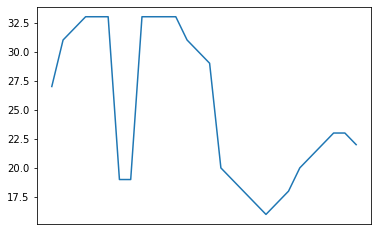

[42 54 56 59 47 38 23 22 38 39 40 41 39 39 36 26 30 27 25 24 24 24 27 27
 27 28 27 23]


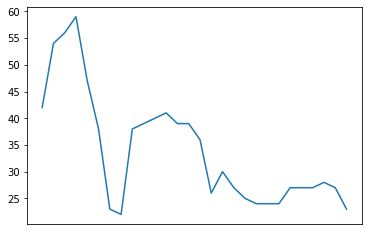

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (37, 57)
SIZE(NO OF PIXELS) :  2109


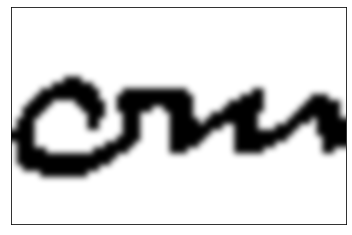

[2, 8, 11, 12, 8, 9, 7, 7, 7, 8, 8, 9, 9, 11, 11, 6, 4, 3, 6, 11, 10, 9, 4, 4, 3, 3, 4, 11, 11, 11, 9, 5, 3, 3, 3, 3, 3, 4, 9, 10, 10, 11, 8, 3, 3, 3, 3, 3, 3, 3, 4, 4, 7, 10, 9, 8, 5]


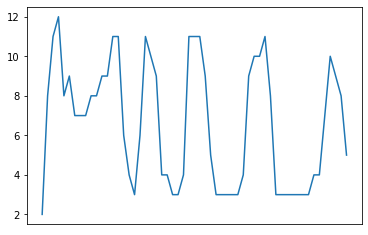

[16, 18, 20, 21, 22, 23, 23, 24, 24, 25, 25, 25, 24, 24, 23, 21, 14, 14, 22, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 22, 18, 17, 18, 19, 19, 20, 21, 21, 22, 22, 23, 23, 16, 16, 17, 17, 18, 19, 20, 21, 22, 22, 22, 21, 21, 18]


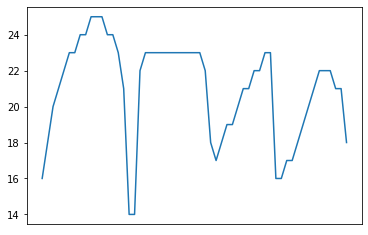

[18 26 31 33 30 32 30 31 31 33 33 34 33 35 34 27 18 17 28 34 33 32 27 27
 26 26 27 34 34 34 31 23 20 21 22 22 23 25 30 32 32 34 31 19 19 20 20 21
 22 23 25 26 29 32 30 29 23]


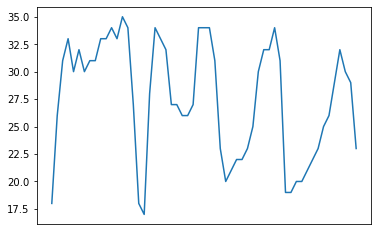

CHARACTERS BREAK POINTS :  [17, 43]
DIMENSION :  2
SHAPE :  (51, 62)
SIZE(NO OF PIXELS) :  3162


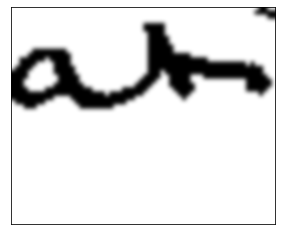

[7, 9, 11, 10, 8, 8, 6, 6, 5, 6, 9, 11, 11, 10, 8, 7, 6, 5, 5, 4, 4, 4, 3, 4, 3, 3, 4, 3, 3, 3, 4, 6, 15, 14, 13, 11, 9, 10, 9, 10, 11, 10, 6, 4, 4, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 6, 7, 7, 9, 6, 4, 2]


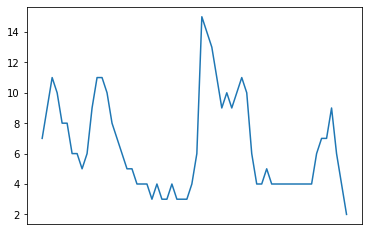

[36, 37, 39, 39, 40, 41, 41, 41, 41, 41, 41, 41, 41, 40, 37, 35, 33, 32, 32, 31, 31, 31, 30, 31, 31, 31, 32, 32, 32, 33, 34, 47, 47, 47, 47, 47, 44, 42, 40, 40, 40, 40, 39, 39, 39, 39, 38, 38, 38, 38, 38, 38, 38, 38, 38, 37, 38, 50, 51, 51, 50, 50]


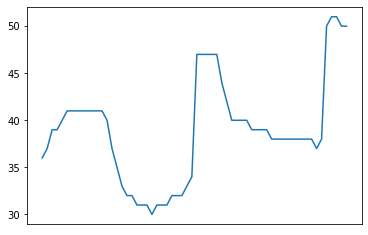

[43 46 50 49 48 49 47 47 46 47 50 52 52 50 45 42 39 37 37 35 35 35 33 35
 34 34 36 35 35 36 38 53 62 61 60 58 53 52 49 50 51 50 45 43 43 44 42 42
 42 42 42 42 42 42 42 43 45 57 60 57 54 52]


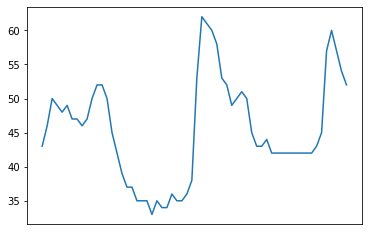

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (51, 48)
SIZE(NO OF PIXELS) :  2448


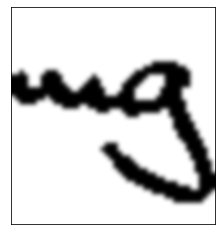

[5, 6, 8, 7, 4, 4, 3, 6, 6, 7, 8, 7, 6, 5, 4, 4, 4, 5, 7, 8, 8, 7, 7, 7, 9, 9, 12, 15, 15, 13, 10, 11, 9, 11, 11, 12, 15, 17, 21, 21, 19, 17, 12, 13, 15, 12, 8, 4]


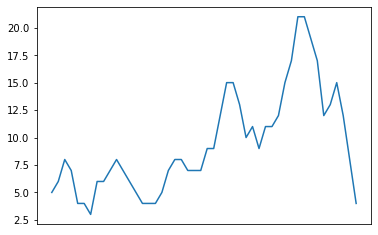

[35, 35, 36, 35, 32, 32, 32, 35, 36, 36, 36, 35, 33, 32, 31, 31, 32, 33, 34, 35, 34, 32, 30, 30, 30, 31, 33, 34, 35, 36, 36, 37, 37, 38, 38, 38, 38, 38, 38, 37, 37, 36, 24, 22, 20, 18, 15, 12]


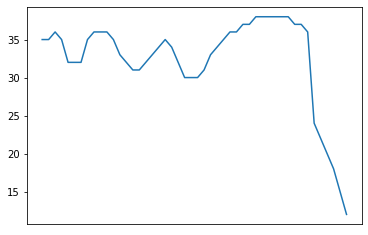

[40 41 44 42 36 36 35 41 42 43 44 42 39 37 35 35 36 38 41 43 42 39 37 37
 39 40 45 49 50 49 46 48 46 49 49 50 53 55 59 58 56 53 36 35 35 30 23 16]


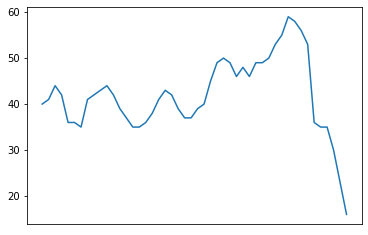

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (48, 73)
SIZE(NO OF PIXELS) :  3504


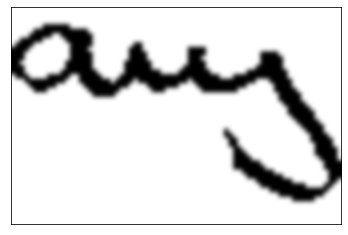

[6, 8, 8, 5, 5, 6, 6, 6, 6, 5, 4, 6, 8, 10, 10, 12, 13, 12, 6, 5, 4, 4, 3, 3, 3, 6, 8, 8, 9, 7, 6, 5, 5, 4, 3, 3, 3, 3, 4, 7, 8, 9, 9, 5, 4, 4, 3, 5, 6, 11, 8, 8, 8, 7, 8, 11, 10, 12, 13, 15, 12, 12, 11, 11, 10, 9, 10, 10, 10, 10, 11, 8, 4]


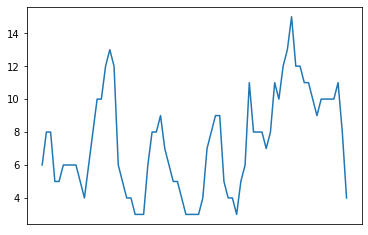

[39, 40, 41, 41, 42, 43, 43, 44, 44, 44, 44, 44, 44, 43, 43, 43, 43, 42, 34, 33, 32, 32, 31, 32, 33, 36, 39, 40, 40, 38, 36, 34, 34, 33, 33, 33, 33, 34, 35, 39, 39, 39, 39, 34, 33, 33, 32, 32, 32, 33, 33, 33, 34, 34, 35, 38, 38, 38, 38, 37, 34, 32, 30, 29, 27, 26, 25, 23, 22, 20, 19, 17, 14]


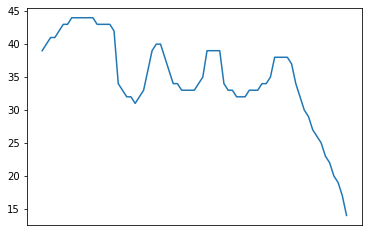

[45 48 49 46 47 49 49 50 50 49 48 50 52 53 53 55 56 54 40 38 36 36 34 35
 36 42 47 48 49 45 42 39 39 37 36 36 36 37 39 46 47 48 48 39 37 37 35 37
 38 44 41 41 42 41 43 49 48 50 51 52 46 44 41 40 37 35 35 33 32 30 30 25
 18]


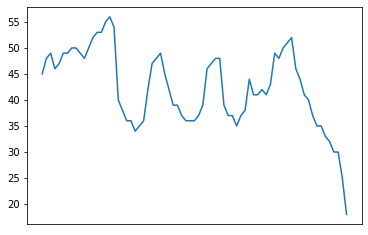

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (30, 46)
SIZE(NO OF PIXELS) :  1380


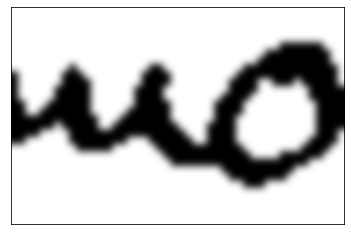

[10, 6, 3, 3, 3, 4, 5, 8, 11, 11, 10, 5, 3, 3, 3, 4, 4, 7, 9, 11, 12, 10, 6, 5, 4, 3, 3, 6, 9, 11, 14, 11, 10, 8, 7, 7, 8, 10, 9, 7, 9, 11, 16, 14, 11, 6]


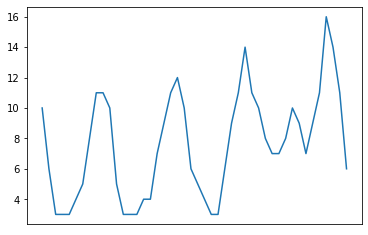

[21, 17, 15, 15, 16, 17, 19, 21, 22, 21, 20, 15, 13, 13, 14, 15, 16, 19, 21, 22, 22, 21, 14, 13, 12, 11, 11, 14, 17, 18, 20, 21, 22, 22, 23, 24, 24, 25, 25, 25, 25, 25, 25, 24, 22, 19]


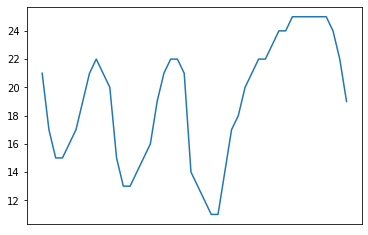

[31 23 18 18 19 21 24 29 33 32 30 20 16 16 17 19 20 26 30 33 34 31 20 18
 16 14 14 20 26 29 34 32 32 30 30 31 32 35 34 32 34 36 41 38 33 25]


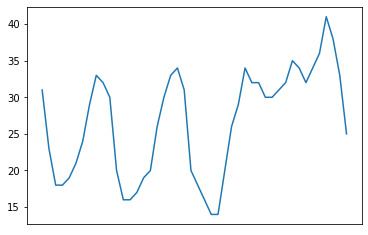

CHARACTERS BREAK POINTS :  [2, 12, 25]
DIMENSION :  2
SHAPE :  (30, 45)
SIZE(NO OF PIXELS) :  1350


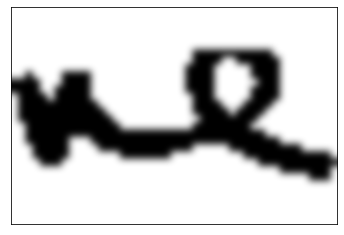

[2, 6, 10, 11, 10, 9, 11, 12, 9, 9, 9, 6, 6, 5, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 7, 12, 13, 13, 8, 6, 6, 8, 10, 13, 14, 12, 10, 4, 4, 4, 3, 4, 4, 4, 1]


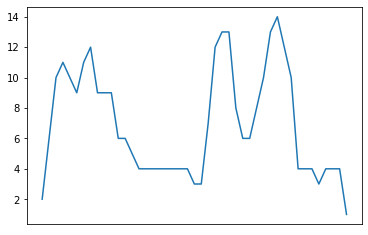

[20, 20, 21, 20, 18, 17, 19, 21, 21, 21, 21, 17, 16, 15, 14, 13, 13, 13, 13, 13, 13, 13, 13, 13, 22, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 23, 11, 11, 11, 10, 10, 10, 10, 9]


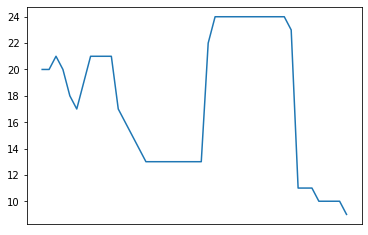

[22 26 31 31 28 26 30 33 30 30 30 23 22 20 18 17 17 17 17 17 17 17 16 16
 29 36 37 37 32 30 30 32 34 37 38 36 33 15 15 15 13 14 14 14 10]


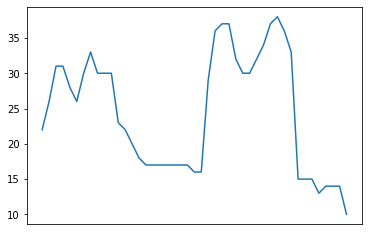

CHARACTERS BREAK POINTS :  [22]
DIMENSION :  2
SHAPE :  (36, 71)
SIZE(NO OF PIXELS) :  2556


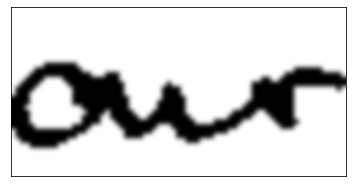

[7, 11, 13, 13, 9, 8, 7, 7, 7, 7, 6, 7, 7, 12, 10, 12, 12, 10, 10, 8, 8, 10, 11, 10, 9, 6, 5, 4, 3, 4, 4, 5, 8, 9, 9, 11, 9, 6, 5, 4, 3, 3, 3, 3, 3, 3, 3, 4, 3, 3, 4, 7, 6, 7, 8, 8, 9, 11, 12, 12, 5, 4, 4, 4, 4, 4, 3, 3, 3, 4, 2]


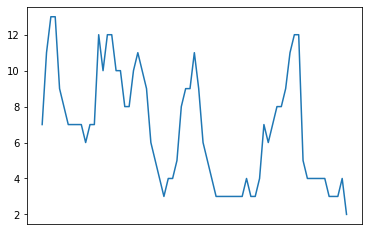

[17, 19, 20, 21, 22, 23, 23, 24, 24, 24, 24, 24, 24, 24, 23, 22, 22, 21, 21, 21, 22, 22, 22, 20, 17, 14, 13, 12, 12, 13, 14, 16, 19, 20, 19, 19, 17, 13, 12, 11, 11, 11, 11, 12, 12, 12, 13, 14, 14, 15, 16, 20, 20, 21, 21, 20, 20, 21, 22, 22, 23, 23, 23, 23, 23, 23, 22, 22, 22, 22, 21]


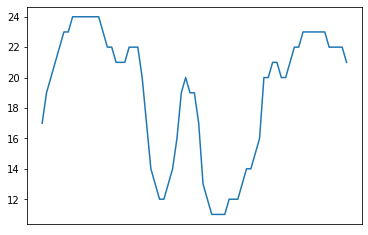

[24 30 33 34 31 31 30 31 31 31 30 31 31 36 33 34 34 31 31 29 30 32 33 30
 26 20 18 16 15 17 18 21 27 29 28 30 26 19 17 15 14 14 14 15 15 15 16 18
 17 18 20 27 26 28 29 28 29 32 34 34 28 27 27 27 27 27 25 25 25 26 23]


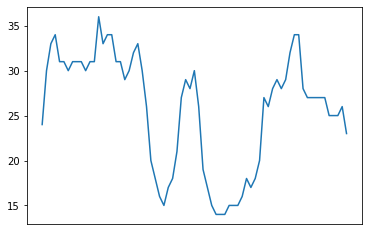

CHARACTERS BREAK POINTS :  [28, 40]
DIMENSION :  2
SHAPE :  (37, 26)
SIZE(NO OF PIXELS) :  962


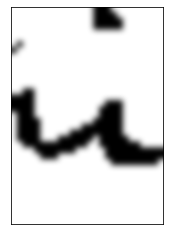

[4, 9, 10, 10, 6, 3, 3, 3, 3, 3, 4, 3, 4, 3, 7, 11, 14, 14, 13, 5, 4, 4, 3, 3, 3, 2]


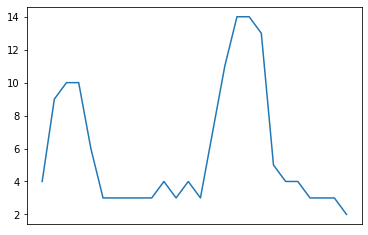

[30, 31, 23, 23, 18, 14, 14, 14, 15, 15, 16, 16, 17, 17, 37, 37, 37, 36, 35, 15, 14, 14, 13, 13, 13, 13]


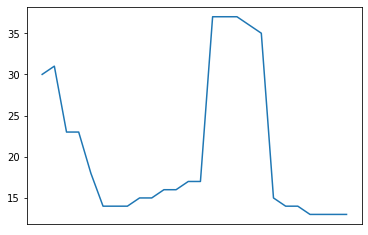

[34 40 33 33 24 17 17 17 18 18 20 19 21 20 44 48 51 50 48 20 18 18 16 16
 16 15]


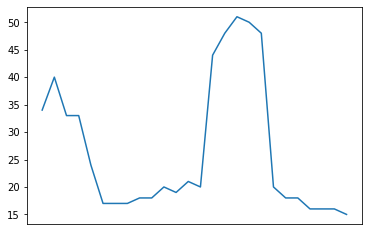

CHARACTERS BREAK POINTS :  [5, 11]
DIMENSION :  2
SHAPE :  (37, 48)
SIZE(NO OF PIXELS) :  1776


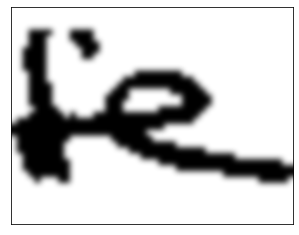

[2, 6, 13, 24, 26, 25, 17, 12, 12, 8, 6, 6, 8, 8, 6, 4, 7, 9, 11, 10, 9, 10, 11, 10, 9, 11, 10, 11, 11, 12, 12, 10, 8, 5, 3, 3, 4, 4, 3, 3, 3, 3, 4, 4, 4, 4, 3, 2]


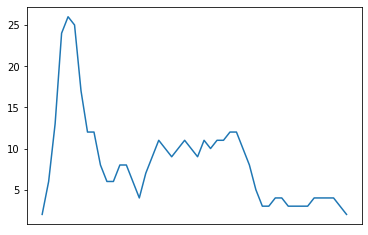

[17, 18, 30, 33, 33, 33, 33, 20, 19, 18, 33, 33, 33, 33, 31, 19, 22, 23, 24, 25, 25, 26, 26, 26, 26, 26, 26, 26, 26, 25, 25, 24, 23, 22, 12, 12, 12, 12, 11, 11, 11, 11, 11, 11, 11, 11, 10, 10]


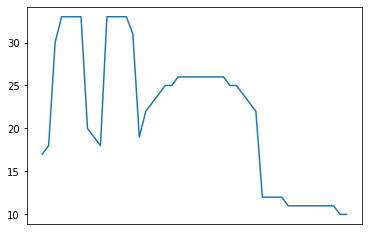

[19 24 43 57 59 58 50 32 31 26 39 39 41 41 37 23 29 32 35 35 34 36 37 36
 35 37 36 37 37 37 37 34 31 27 15 15 16 16 14 14 14 14 15 15 15 15 13 12]


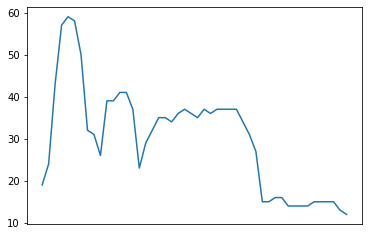

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (47, 109)
SIZE(NO OF PIXELS) :  5123


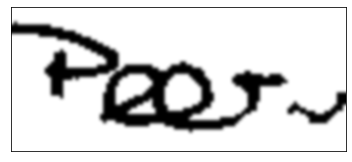

[3, 4, 3, 3, 3, 3, 3, 3, 3, 4, 4, 6, 8, 14, 17, 18, 20, 12, 7, 8, 7, 7, 7, 6, 7, 7, 7, 7, 7, 9, 17, 21, 21, 22, 16, 9, 10, 12, 11, 10, 11, 10, 10, 10, 12, 12, 16, 18, 17, 17, 12, 9, 9, 9, 9, 10, 11, 10, 11, 10, 11, 13, 16, 13, 12, 6, 3, 3, 4, 3, 3, 3, 5, 7, 6, 7, 9, 14, 12, 12, 9, 4, 3, 3, 4, 4, 4, 4, 2, 1, 2, 3, 3, 2, 2, 2, 2, 4, 4, 3, 3, 3, 4, 3, 3, 3, 6, 6, 4]


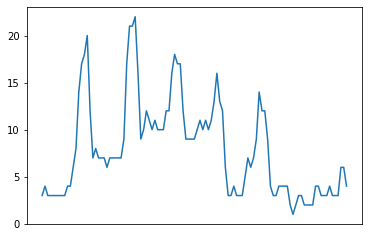

[41, 42, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 40, 40, 40, 40, 39, 39, 39, 39, 38, 38, 37, 37, 37, 36, 36, 35, 35, 34, 34, 33, 33, 32, 26, 27, 28, 28, 28, 28, 28, 28, 28, 28, 28, 27, 27, 26, 26, 26, 27, 28, 28, 28, 29, 29, 28, 28, 27, 27, 27, 26, 24, 23, 19, 10, 10, 11, 11, 11, 11, 24, 25, 25, 25, 26, 26, 25, 25, 25, 25, 24, 24, 25, 25, 25, 25, 24, 23, 14, 15, 16, 15, 14, 14, 13, 13, 13, 12, 12, 12, 13, 13, 14, 15, 19, 19, 19]


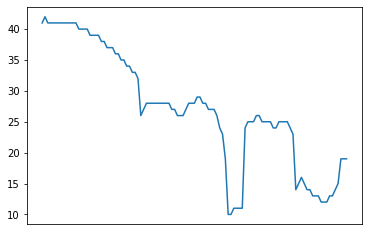

[44 46 44 44 44 44 44 44 44 45 45 47 49 54 57 58 60 51 46 47 46 45 45 43
 44 44 43 43 42 44 51 55 54 55 48 35 37 40 39 38 39 38 38 38 40 40 43 45
 43 43 38 36 37 37 37 39 40 38 39 37 38 40 42 37 35 25 13 13 15 14 14 14
 29 32 31 32 35 40 37 37 34 29 27 27 29 29 29 29 26 24 16 18 19 17 16 16
 15 17 17 15 15 15 17 16 17 18 25 25 23]


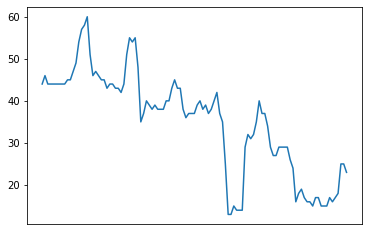

CHARACTERS BREAK POINTS :  [66, 96]
DIMENSION :  2
SHAPE :  (25, 33)
SIZE(NO OF PIXELS) :  825


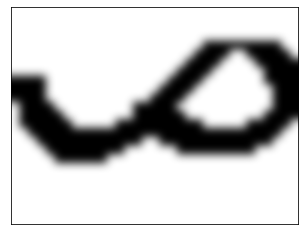

[3, 6, 7, 8, 6, 6, 5, 4, 4, 4, 4, 3, 4, 3, 5, 4, 5, 7, 8, 9, 8, 8, 7, 6, 5, 4, 4, 6, 6, 9, 11, 9, 7]


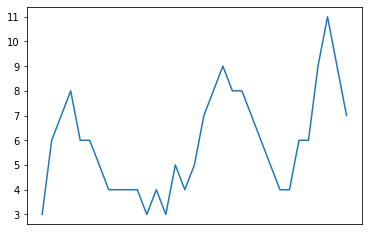

[17, 17, 17, 17, 14, 13, 12, 11, 11, 11, 11, 11, 12, 12, 14, 14, 15, 16, 17, 18, 19, 20, 21, 21, 21, 21, 21, 21, 21, 21, 21, 20, 19]


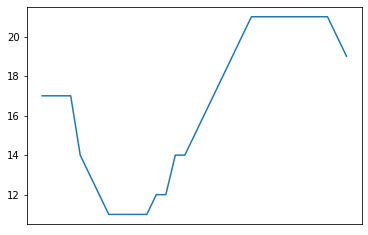

[20 23 24 25 20 19 17 15 15 15 15 14 16 15 19 18 20 23 25 27 27 28 28 27
 26 25 25 27 27 30 32 29 26]


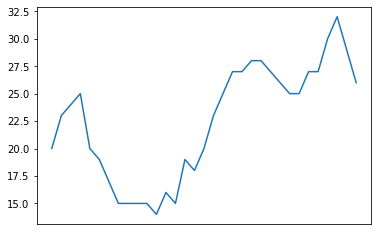

CHARACTERS BREAK POINTS :  [11]
DIMENSION :  2
SHAPE :  (30, 23)
SIZE(NO OF PIXELS) :  690


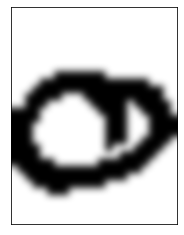

[8, 9, 12, 11, 8, 8, 8, 7, 6, 6, 7, 8, 10, 13, 12, 13, 6, 8, 9, 10, 9, 6, 3]


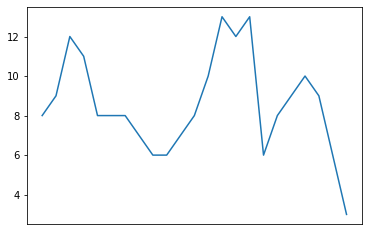

[16, 16, 18, 19, 20, 20, 21, 21, 21, 21, 21, 21, 21, 20, 20, 20, 20, 20, 20, 19, 19, 17, 15]


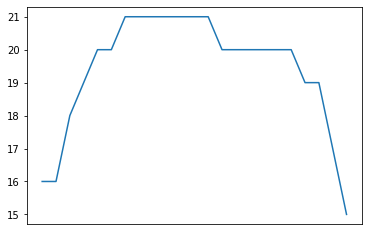

[24 25 30 30 28 28 29 28 27 27 28 29 31 33 32 33 26 28 29 29 28 23 18]


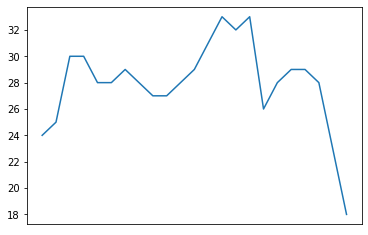

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (37, 49)
SIZE(NO OF PIXELS) :  1813


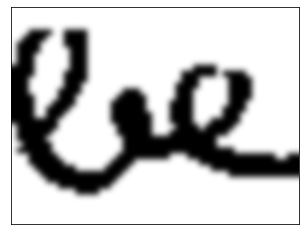

[10, 18, 20, 20, 13, 12, 13, 10, 10, 14, 17, 15, 13, 4, 4, 3, 4, 8, 11, 14, 13, 12, 11, 8, 4, 4, 4, 8, 12, 14, 15, 10, 8, 9, 11, 7, 10, 15, 13, 11, 8, 4, 4, 4, 4, 3, 3, 4, 4]


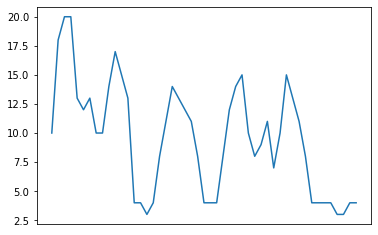

[27, 31, 32, 33, 33, 33, 33, 21, 23, 33, 33, 33, 33, 9, 9, 9, 10, 21, 22, 23, 23, 23, 22, 19, 15, 15, 15, 21, 24, 26, 26, 27, 27, 27, 27, 18, 26, 26, 26, 26, 25, 12, 12, 12, 12, 11, 11, 12, 12]


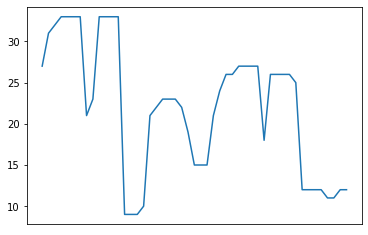

[37 49 52 53 46 45 46 31 33 47 50 48 46 13 13 12 14 29 33 37 36 35 33 27
 19 19 19 29 36 40 41 37 35 36 38 25 36 41 39 37 33 16 16 16 16 14 14 16
 16]


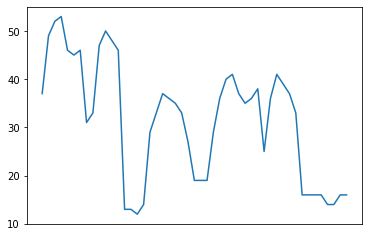

CHARACTERS BREAK POINTS :  [15, 24]
DIMENSION :  2
SHAPE :  (32, 34)
SIZE(NO OF PIXELS) :  1088


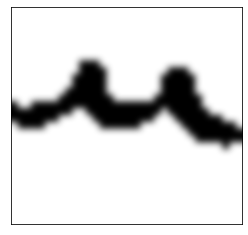

[3, 3, 3, 4, 4, 3, 3, 3, 4, 5, 7, 8, 9, 9, 5, 4, 4, 4, 4, 3, 3, 3, 5, 7, 8, 9, 9, 7, 5, 4, 4, 4, 3, 2]


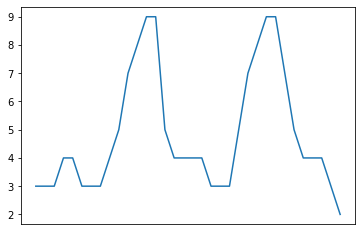

[18, 17, 17, 18, 18, 18, 18, 19, 20, 22, 24, 24, 24, 23, 19, 18, 18, 18, 18, 18, 18, 19, 22, 23, 23, 23, 22, 19, 17, 16, 16, 15, 15, 14]


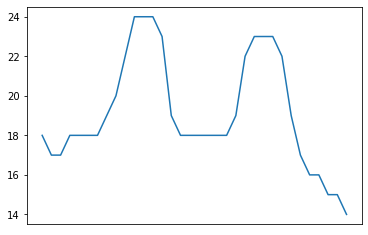

[21 20 20 22 22 21 21 22 24 27 31 32 33 32 24 22 22 22 22 21 21 22 27 30
 31 32 31 26 22 20 20 19 18 16]


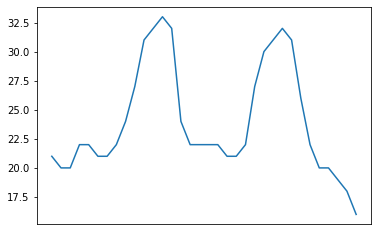

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (32, 94)
SIZE(NO OF PIXELS) :  3008


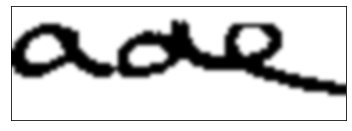

[5, 9, 10, 12, 10, 7, 7, 7, 7, 6, 6, 6, 7, 8, 9, 10, 10, 9, 10, 6, 5, 5, 4, 5, 4, 4, 4, 4, 2, 1, 7, 9, 10, 8, 6, 6, 6, 7, 7, 7, 6, 7, 7, 8, 9, 13, 12, 10, 11, 10, 7, 6, 5, 4, 5, 5, 4, 4, 4, 4, 10, 12, 13, 11, 7, 5, 6, 7, 8, 8, 10, 10, 13, 13, 10, 9, 4, 3, 4, 4, 4, 3, 4, 4, 4, 4, 3, 3, 3, 4, 4, 3, 3, 3]


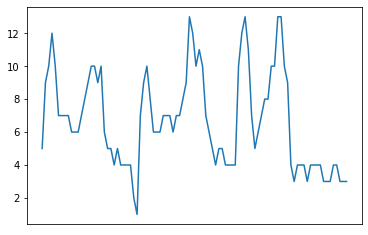

[20, 22, 23, 24, 25, 25, 26, 26, 27, 27, 27, 27, 27, 27, 26, 26, 26, 25, 25, 20, 19, 18, 17, 17, 16, 16, 16, 16, 15, 15, 20, 21, 22, 23, 23, 24, 24, 25, 25, 25, 24, 25, 24, 24, 24, 28, 28, 27, 28, 27, 23, 21, 20, 19, 19, 19, 18, 18, 18, 18, 24, 26, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 26, 25, 14, 13, 13, 13, 13, 12, 12, 12, 12, 12, 11, 11, 11, 11, 11, 10, 10, 10]


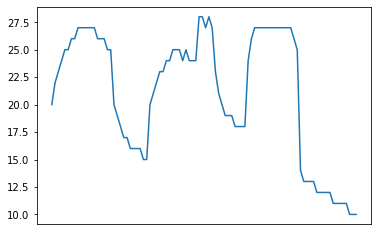

[25 31 33 36 35 32 33 33 34 33 33 33 34 35 35 36 36 34 35 26 24 23 21 22
 20 20 20 20 17 16 27 30 32 31 29 30 30 32 32 32 30 32 31 32 33 41 40 37
 39 37 30 27 25 23 24 24 22 22 22 22 34 38 40 38 34 32 33 34 35 35 37 37
 40 40 36 34 18 16 17 17 17 15 16 16 16 16 14 14 14 15 15 13 13 13]


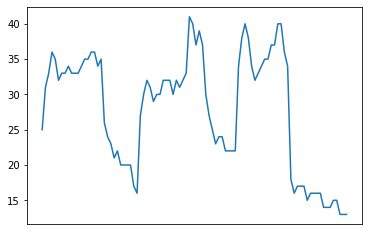

CHARACTERS BREAK POINTS :  [29]
DIMENSION :  2
SHAPE :  (33, 40)
SIZE(NO OF PIXELS) :  1320


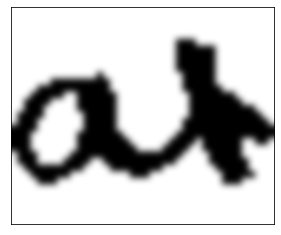

[4, 8, 11, 10, 8, 6, 6, 5, 5, 5, 11, 13, 12, 13, 13, 12, 6, 5, 5, 4, 4, 3, 3, 3, 4, 9, 13, 16, 14, 16, 18, 13, 14, 14, 13, 8, 6, 5, 4, 2]


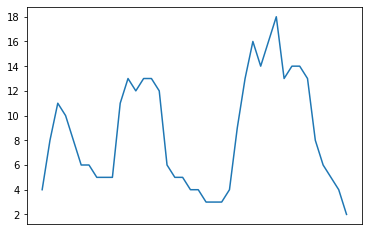

[15, 17, 19, 20, 21, 21, 22, 22, 22, 22, 22, 22, 22, 23, 22, 20, 14, 13, 12, 11, 11, 11, 11, 12, 13, 28, 28, 28, 27, 27, 27, 21, 20, 20, 19, 18, 18, 17, 16, 15]


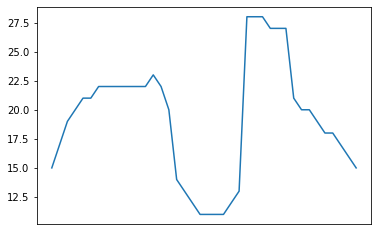

[19 25 30 30 29 27 28 27 27 27 33 35 34 36 35 32 20 18 17 15 15 14 14 15
 17 37 41 44 41 43 45 34 34 34 32 26 24 22 20 17]


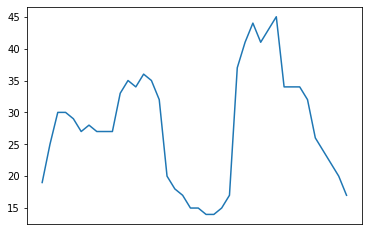

CHARACTERS BREAK POINTS :  [21]
DIMENSION :  2
SHAPE :  (25, 28)
SIZE(NO OF PIXELS) :  700


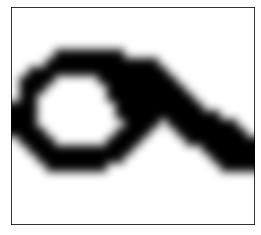

[4, 8, 10, 7, 7, 6, 6, 6, 6, 6, 7, 9, 12, 11, 10, 9, 8, 6, 6, 6, 6, 5, 5, 6, 6, 6, 5, 4]


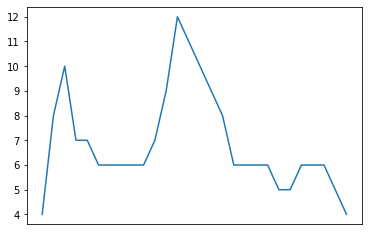

[14, 17, 18, 18, 19, 20, 20, 20, 20, 20, 20, 20, 20, 19, 19, 19, 19, 18, 17, 16, 15, 14, 13, 13, 12, 12, 11, 10]


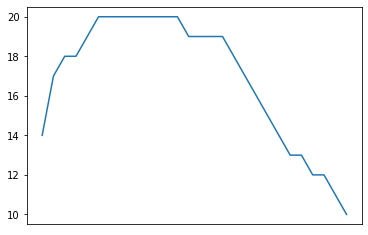

[18 25 28 25 26 26 26 26 26 26 27 29 32 30 29 28 27 24 23 22 21 19 18 19
 18 18 16 14]


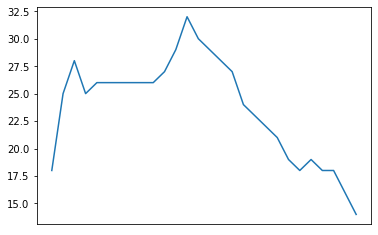

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (51, 107)
SIZE(NO OF PIXELS) :  5457


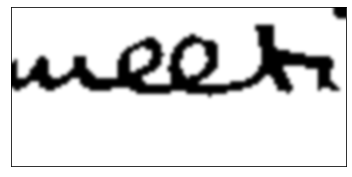

[8, 10, 4, 3, 3, 3, 4, 5, 7, 10, 10, 10, 5, 4, 3, 3, 3, 3, 3, 3, 7, 7, 9, 10, 6, 6, 5, 4, 4, 4, 4, 4, 3, 3, 9, 11, 12, 13, 8, 8, 10, 10, 9, 10, 11, 14, 12, 10, 4, 3, 5, 12, 14, 15, 13, 9, 8, 10, 9, 8, 8, 8, 13, 15, 13, 11, 3, 3, 3, 2, 3, 3, 3, 3, 2, 3, 3, 3, 6, 12, 17, 16, 16, 17, 12, 13, 13, 11, 10, 6, 4, 4, 4, 4, 4, 4, 4, 4, 11, 10, 10, 10, 6, 5, 5, 4, 4]


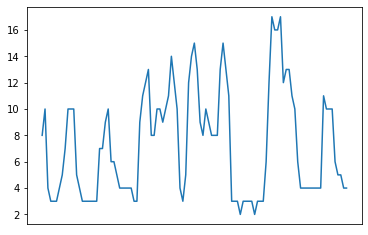

[33, 34, 28, 28, 28, 29, 31, 32, 34, 35, 35, 34, 29, 28, 28, 28, 29, 29, 30, 31, 35, 35, 35, 35, 31, 30, 29, 28, 28, 28, 28, 28, 28, 28, 34, 36, 37, 38, 38, 39, 39, 40, 40, 41, 41, 41, 40, 39, 36, 26, 32, 36, 38, 39, 40, 41, 41, 42, 42, 41, 41, 40, 40, 40, 40, 39, 26, 26, 26, 26, 27, 27, 27, 27, 27, 28, 28, 29, 45, 45, 45, 45, 45, 45, 38, 37, 37, 37, 37, 36, 36, 36, 36, 36, 35, 35, 35, 35, 35, 35, 35, 35, 34, 51, 51, 51, 51]


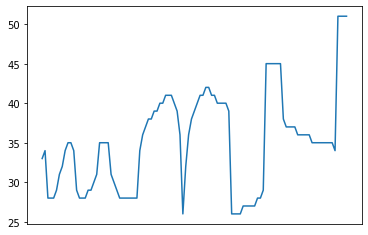

[41 44 32 31 31 32 35 37 41 45 45 44 34 32 31 31 32 32 33 34 42 42 44 45
 37 36 34 32 32 32 32 32 31 31 43 47 49 51 46 47 49 50 49 51 52 55 52 49
 40 29 37 48 52 54 53 50 49 52 51 49 49 48 53 55 53 50 29 29 29 28 30 30
 30 30 29 31 31 32 51 57 62 61 61 62 50 50 50 48 47 42 40 40 40 40 39 39
 39 39 46 45 45 45 40 56 56 55 55]


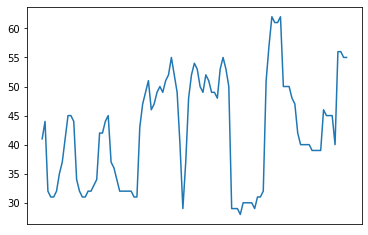

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (41, 42)
SIZE(NO OF PIXELS) :  1722


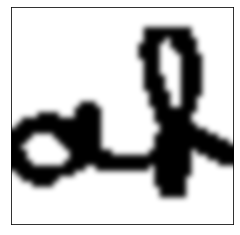

[8, 10, 11, 8, 7, 8, 8, 8, 8, 7, 9, 11, 12, 13, 12, 12, 12, 4, 4, 3, 3, 3, 3, 3, 6, 15, 18, 28, 26, 22, 21, 22, 32, 28, 19, 13, 5, 5, 5, 5, 5, 4]


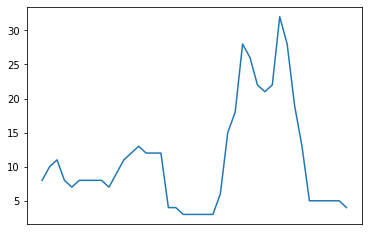

[18, 19, 20, 20, 20, 21, 21, 21, 21, 20, 20, 20, 22, 23, 23, 23, 22, 14, 14, 13, 13, 13, 13, 13, 34, 37, 37, 37, 37, 37, 37, 37, 37, 37, 35, 32, 18, 17, 17, 16, 16, 15]


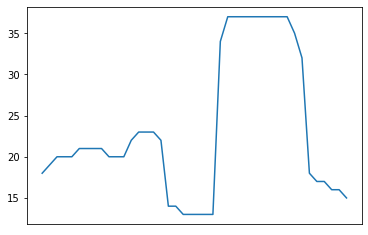

[26 29 31 28 27 29 29 29 29 27 29 31 34 36 35 35 34 18 18 16 16 16 16 16
 40 52 55 65 63 59 58 59 69 65 54 45 23 22 22 21 21 19]


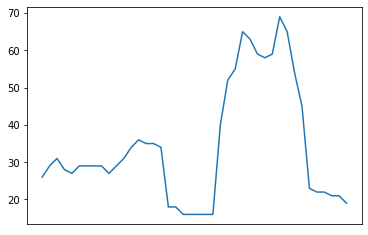

CHARACTERS BREAK POINTS :  [19]
DIMENSION :  2
SHAPE :  (38, 125)
SIZE(NO OF PIXELS) :  4750


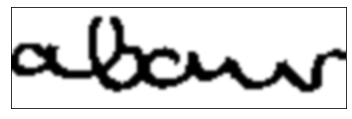

[6, 9, 11, 8, 7, 5, 5, 5, 6, 6, 8, 7, 7, 9, 10, 10, 11, 6, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 16, 21, 22, 12, 10, 8, 10, 9, 11, 15, 21, 19, 13, 7, 6, 7, 7, 10, 14, 12, 10, 11, 11, 9, 8, 6, 7, 7, 8, 6, 7, 7, 8, 6, 3, 3, 6, 10, 9, 9, 9, 7, 5, 4, 4, 4, 3, 3, 3, 4, 4, 6, 6, 7, 7, 7, 6, 5, 5, 4, 4, 3, 3, 3, 3, 2, 3, 3, 3, 5, 7, 6, 5, 7, 6, 6, 6, 5, 5, 5, 4, 3, 3, 9, 11, 13, 12, 4, 2, 2, 2, 3, 3, 4, 3, 3]


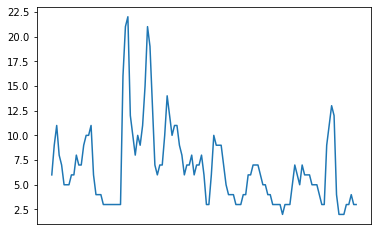

[20, 22, 23, 24, 24, 24, 24, 24, 24, 24, 24, 23, 22, 23, 24, 23, 23, 23, 16, 15, 15, 14, 14, 14, 14, 14, 14, 14, 14, 31, 33, 34, 34, 34, 16, 17, 18, 34, 34, 34, 33, 31, 24, 23, 23, 23, 23, 23, 22, 20, 20, 20, 21, 22, 22, 22, 22, 23, 22, 22, 22, 21, 20, 12, 13, 16, 21, 21, 21, 20, 17, 15, 14, 14, 14, 14, 14, 15, 16, 17, 19, 19, 18, 18, 17, 15, 13, 12, 11, 11, 10, 10, 10, 10, 10, 11, 11, 12, 14, 17, 17, 17, 18, 16, 15, 14, 13, 12, 11, 10, 9, 9, 15, 18, 20, 20, 20, 20, 21, 21, 22, 22, 22, 21, 21]


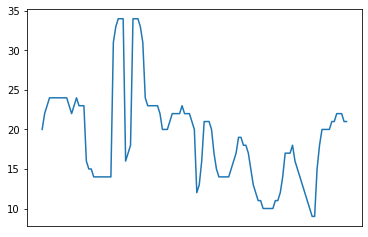

[26 31 34 32 31 29 29 29 30 30 32 30 29 32 34 33 34 29 20 19 19 17 17 17
 17 17 17 17 17 47 54 56 46 44 24 27 27 45 49 55 52 44 31 29 30 30 33 37
 34 30 31 31 30 30 28 29 29 31 28 29 29 29 26 15 16 22 31 30 30 29 24 20
 18 18 18 17 17 18 20 21 25 25 25 25 24 21 18 17 15 15 13 13 13 13 12 14
 14 15 19 24 23 22 25 22 21 20 18 17 16 14 12 12 24 29 33 32 24 22 23 23
 25 25 26 24 24]


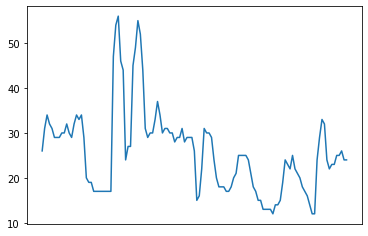

CHARACTERS BREAK POINTS :  [21, 63, 75, 94, 110]
DIMENSION :  2
SHAPE :  (34, 109)
SIZE(NO OF PIXELS) :  3706


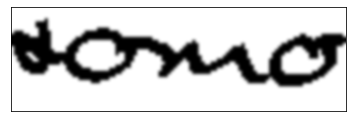

[4, 8, 10, 12, 12, 11, 10, 10, 13, 17, 17, 17, 11, 5, 4, 4, 3, 4, 8, 10, 12, 10, 8, 7, 8, 7, 7, 7, 8, 7, 7, 7, 6, 7, 11, 9, 8, 10, 10, 8, 6, 4, 4, 4, 4, 5, 4, 5, 6, 10, 11, 9, 7, 5, 4, 4, 4, 6, 9, 11, 10, 6, 4, 3, 3, 3, 3, 3, 3, 3, 4, 4, 5, 6, 8, 11, 10, 8, 6, 4, 3, 3, 3, 2, 6, 9, 11, 13, 9, 7, 8, 7, 7, 7, 8, 8, 8, 10, 9, 10, 7, 11, 13, 12, 11, 10, 4, 4, 2]


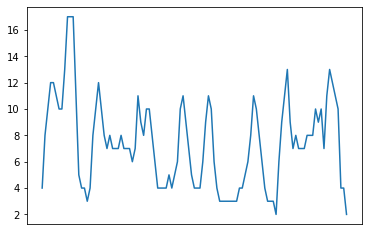

[25, 26, 26, 26, 25, 25, 24, 24, 29, 29, 29, 30, 26, 20, 19, 19, 19, 19, 21, 22, 23, 24, 24, 25, 26, 26, 26, 26, 27, 27, 27, 27, 26, 26, 26, 25, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 23, 23, 22, 22, 22, 21, 20, 19, 19, 20, 21, 22, 22, 23, 22, 18, 16, 15, 15, 16, 16, 17, 17, 18, 19, 20, 21, 21, 21, 22, 20, 17, 15, 13, 12, 12, 12, 12, 17, 19, 20, 21, 22, 22, 23, 23, 24, 24, 25, 25, 24, 24, 23, 24, 24, 25, 25, 25, 25, 25, 25, 25, 24]


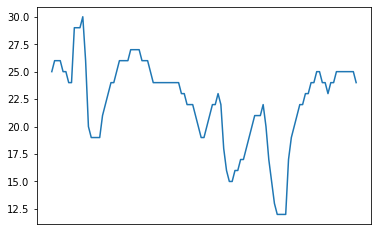

[29 34 36 38 37 36 34 34 42 46 46 47 37 25 23 23 22 23 29 32 35 34 32 32
 34 33 33 33 35 34 34 34 32 33 37 34 32 34 34 32 30 28 28 28 28 29 27 28
 28 32 33 30 27 24 23 24 25 28 31 34 32 24 20 18 18 19 19 20 20 21 23 24
 26 27 29 33 30 25 21 17 15 15 15 14 23 28 31 34 31 29 31 30 31 31 33 33
 32 34 32 34 31 36 38 37 36 35 29 29 26]


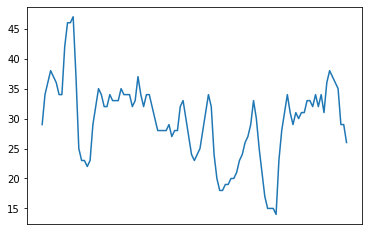

CHARACTERS BREAK POINTS :  [63, 83]
DIMENSION :  2
SHAPE :  (33, 64)
SIZE(NO OF PIXELS) :  2112


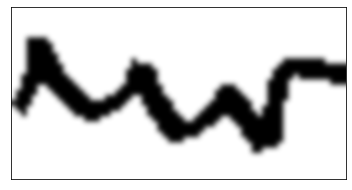

[1, 4, 8, 13, 11, 9, 9, 9, 8, 7, 6, 6, 6, 5, 5, 4, 4, 3, 4, 3, 4, 4, 6, 7, 6, 8, 10, 10, 9, 8, 8, 6, 5, 3, 3, 4, 4, 4, 5, 6, 6, 6, 7, 7, 8, 8, 8, 7, 8, 13, 15, 15, 8, 4, 3, 4, 4, 4, 4, 4, 3, 4, 4, 4]


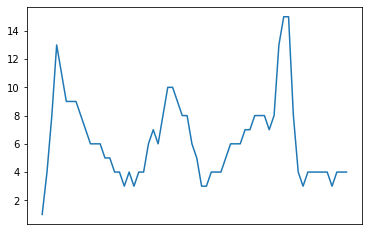

[15, 17, 20, 27, 27, 27, 27, 26, 24, 22, 20, 19, 18, 17, 16, 15, 15, 15, 16, 16, 17, 18, 21, 23, 22, 22, 22, 21, 18, 16, 15, 13, 12, 11, 11, 12, 13, 14, 15, 17, 18, 18, 18, 17, 16, 15, 13, 12, 14, 19, 21, 22, 23, 23, 23, 23, 23, 23, 23, 23, 22, 22, 22, 22]


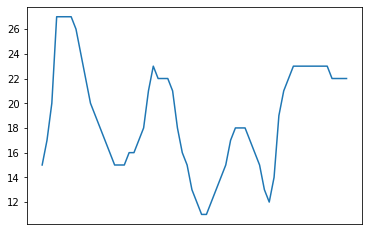

[16 21 28 40 38 36 36 35 32 29 26 25 24 22 21 19 19 18 20 19 21 22 27 30
 28 30 32 31 27 24 23 19 17 14 14 16 17 18 20 23 24 24 25 24 24 23 21 19
 22 32 36 37 31 27 26 27 27 27 27 27 25 26 26 26]


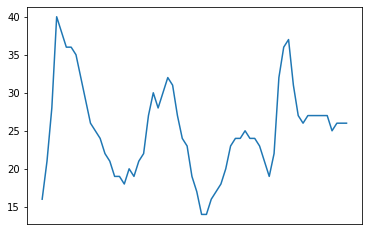

CHARACTERS BREAK POINTS :  [17, 19, 33, 47]
DIMENSION :  2
SHAPE :  (32, 46)
SIZE(NO OF PIXELS) :  1472


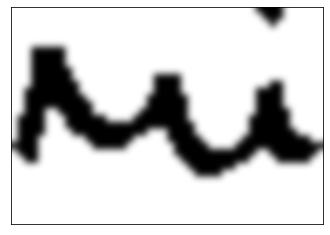

[1, 6, 11, 17, 13, 9, 9, 10, 9, 8, 6, 6, 5, 5, 4, 4, 4, 3, 3, 4, 5, 8, 8, 10, 12, 10, 7, 6, 5, 4, 4, 3, 3, 3, 4, 6, 10, 11, 14, 14, 8, 5, 4, 4, 2, 1]


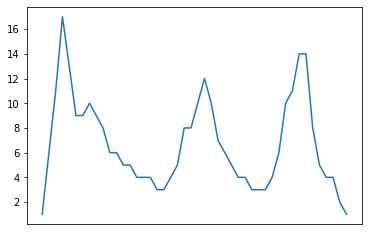

[12, 16, 20, 26, 26, 26, 26, 26, 23, 21, 19, 18, 16, 16, 15, 15, 15, 15, 16, 17, 19, 22, 22, 22, 22, 19, 15, 13, 12, 11, 11, 11, 11, 12, 13, 16, 32, 32, 32, 32, 17, 14, 13, 13, 12, 12]


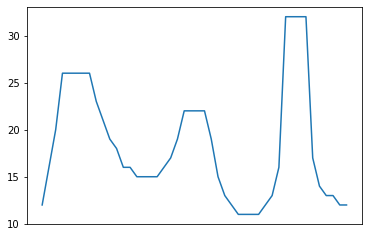

[13 22 31 43 39 35 35 36 32 29 25 24 21 21 19 19 19 18 19 21 24 30 30 32
 34 29 22 19 17 15 15 14 14 15 17 22 42 43 46 46 25 19 17 17 14 13]


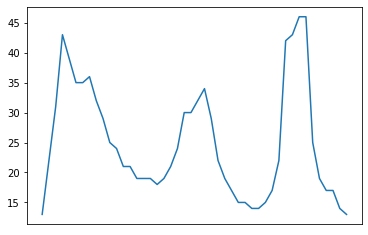

CHARACTERS BREAK POINTS :  [17, 31]
DIMENSION :  2
SHAPE :  (32, 51)
SIZE(NO OF PIXELS) :  1632


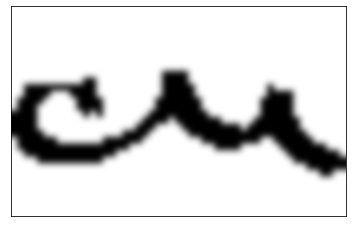

[4, 8, 11, 11, 8, 6, 5, 4, 4, 5, 7, 9, 8, 6, 3, 3, 2, 3, 2, 3, 3, 3, 4, 8, 7, 8, 9, 8, 6, 5, 4, 5, 4, 4, 4, 2, 3, 4, 6, 8, 8, 9, 10, 7, 5, 5, 4, 5, 4, 3, 2]


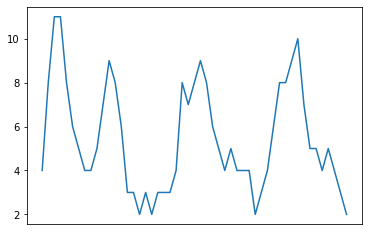

[16, 18, 20, 20, 20, 20, 20, 20, 20, 20, 20, 21, 21, 18, 12, 12, 12, 13, 13, 14, 15, 16, 18, 22, 22, 22, 22, 20, 18, 16, 15, 15, 14, 14, 14, 13, 14, 15, 18, 20, 19, 19, 19, 15, 13, 12, 11, 11, 10, 10, 9]


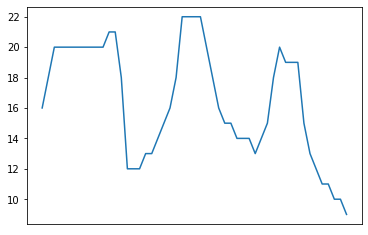

[20 26 31 31 28 26 25 24 24 25 27 30 29 24 15 15 14 16 15 17 18 19 22 30
 29 30 31 28 24 21 19 20 18 18 18 15 17 19 24 28 27 28 29 22 18 17 15 16
 14 13 11]


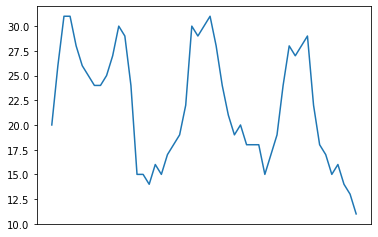

CHARACTERS BREAK POINTS :  [16, 30, 35]
DIMENSION :  2
SHAPE :  (42, 65)
SIZE(NO OF PIXELS) :  2730


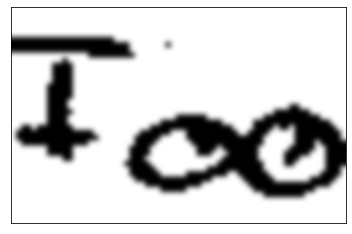

[3, 5, 7, 7, 6, 7, 7, 17, 21, 21, 23, 18, 6, 6, 6, 6, 5, 4, 4, 4, 3, 3, 4, 7, 9, 10, 10, 8, 6, 6, 7, 5, 6, 6, 8, 9, 11, 10, 10, 8, 8, 9, 9, 8, 8, 9, 11, 14, 11, 9, 7, 6, 7, 10, 11, 14, 12, 11, 10, 7, 8, 13, 11, 9, 5]


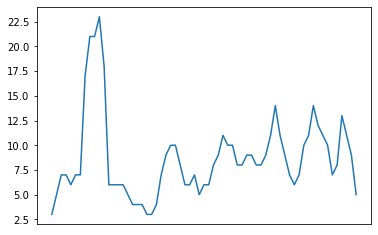

[36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 35, 35, 35, 33, 17, 18, 18, 19, 19, 20, 35, 20, 21, 21, 21, 21, 21, 21, 20, 20, 20, 19, 19, 18, 17, 17, 18, 20, 20, 21, 21, 22, 22, 22, 23, 23, 22, 22, 21, 21, 20, 20, 19, 18, 16]


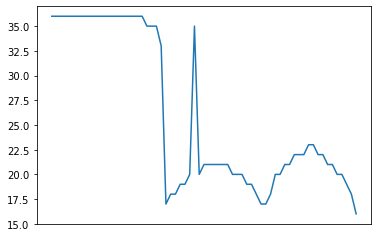

[39 41 43 43 42 43 43 53 57 57 59 54 42 42 42 42 41 40 40 40 38 38 39 40
 26 28 28 27 25 26 42 25 27 27 29 30 32 31 30 28 28 28 28 26 25 26 29 34
 31 30 28 28 29 32 34 37 34 33 31 28 28 33 30 27 21]


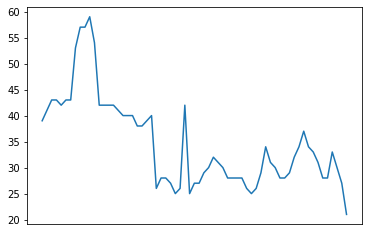

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (31, 47)
SIZE(NO OF PIXELS) :  1457


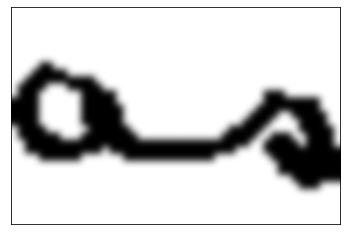

[4, 8, 11, 12, 9, 7, 6, 5, 5, 5, 10, 11, 10, 8, 9, 7, 5, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 4, 3, 4, 4, 4, 7, 8, 9, 8, 9, 11, 13, 13, 10, 8, 5]


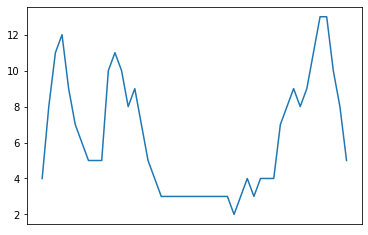

[18, 20, 21, 22, 23, 23, 22, 22, 21, 21, 21, 21, 20, 19, 19, 17, 14, 13, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 14, 14, 15, 16, 17, 19, 19, 19, 18, 18, 18, 18, 18, 16, 14, 11]


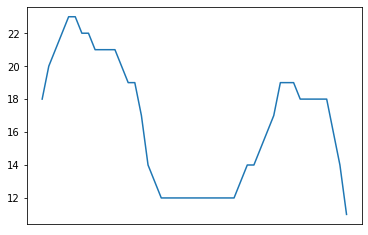

[22 28 32 34 32 30 28 27 26 26 31 32 30 27 28 24 19 17 15 15 15 15 15 15
 15 15 15 15 15 14 16 18 17 19 20 21 26 27 28 26 27 29 31 31 26 22 16]


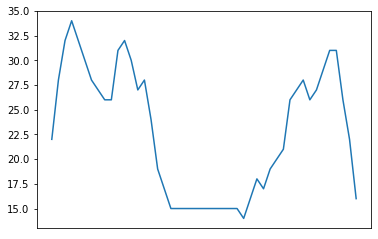

CHARACTERS BREAK POINTS :  [29]
DIMENSION :  2
SHAPE :  (38, 57)
SIZE(NO OF PIXELS) :  2166


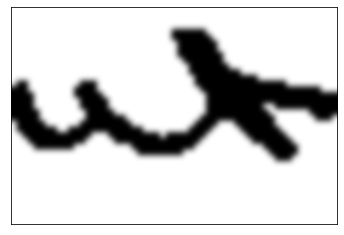

[6, 9, 10, 9, 7, 5, 4, 4, 3, 3, 4, 5, 9, 10, 9, 7, 6, 5, 5, 5, 4, 4, 5, 4, 4, 4, 3, 4, 6, 9, 9, 12, 14, 15, 17, 15, 12, 10, 9, 10, 10, 11, 12, 11, 11, 11, 11, 10, 8, 6, 4, 4, 5, 6, 5, 5, 4]


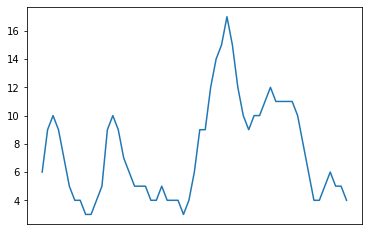

[24, 25, 25, 23, 20, 18, 17, 17, 16, 16, 17, 24, 25, 25, 25, 23, 22, 20, 19, 19, 18, 17, 17, 16, 16, 16, 15, 16, 34, 34, 34, 34, 34, 34, 33, 32, 30, 28, 27, 27, 26, 26, 26, 25, 25, 25, 25, 25, 24, 24, 24, 24, 24, 24, 23, 23, 23]


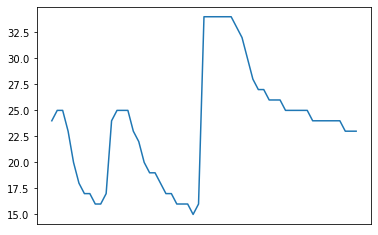

[30 34 35 32 27 23 21 21 19 19 21 29 34 35 34 30 28 25 24 24 22 21 22 20
 20 20 18 20 40 43 43 46 48 49 50 47 42 38 36 37 36 37 38 36 36 36 36 35
 32 30 28 28 29 30 28 28 27]


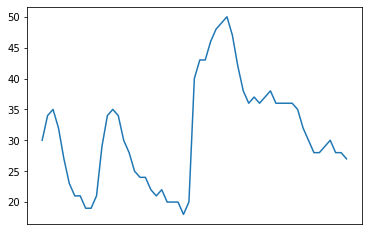

CHARACTERS BREAK POINTS :  [8, 26]
DIMENSION :  2
SHAPE :  (33, 51)
SIZE(NO OF PIXELS) :  1683


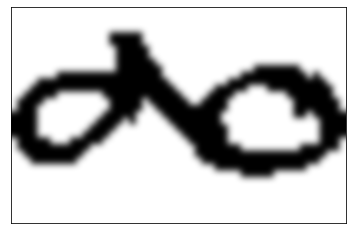

[4, 8, 10, 12, 8, 7, 6, 6, 6, 7, 6, 6, 6, 7, 8, 11, 14, 13, 14, 12, 8, 7, 7, 6, 6, 6, 6, 6, 8, 10, 11, 13, 11, 7, 6, 7, 6, 7, 7, 8, 7, 7, 8, 11, 11, 8, 10, 12, 10, 8, 4]


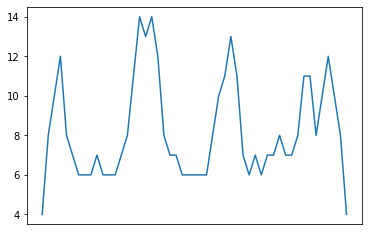

[17, 19, 20, 21, 22, 22, 22, 23, 23, 23, 23, 23, 23, 23, 23, 29, 29, 29, 29, 29, 27, 25, 24, 22, 21, 20, 19, 18, 18, 19, 20, 21, 21, 22, 22, 23, 23, 24, 24, 24, 24, 24, 24, 24, 23, 22, 23, 22, 21, 19, 17]


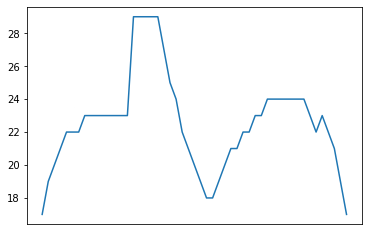

[21 27 30 33 30 29 28 29 29 30 29 29 29 30 31 40 43 42 43 41 35 32 31 28
 27 26 25 24 26 29 31 34 32 29 28 30 29 31 31 32 31 31 32 35 34 30 33 34
 31 27 21]


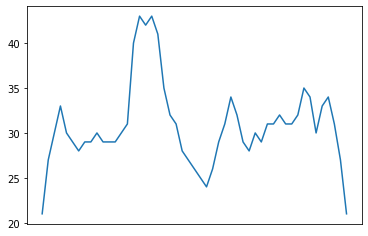

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (33, 35)
SIZE(NO OF PIXELS) :  1155


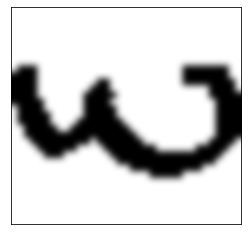

[5, 9, 11, 12, 8, 7, 5, 4, 3, 4, 4, 8, 8, 10, 11, 9, 7, 6, 6, 5, 4, 5, 4, 4, 4, 4, 6, 6, 7, 6, 9, 14, 13, 10, 7]


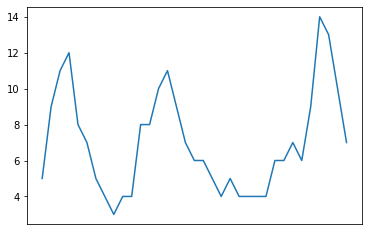

[23, 24, 24, 24, 19, 17, 15, 14, 14, 15, 16, 20, 21, 22, 22, 20, 16, 15, 14, 13, 12, 12, 11, 11, 11, 11, 24, 24, 24, 24, 24, 24, 24, 22, 20]


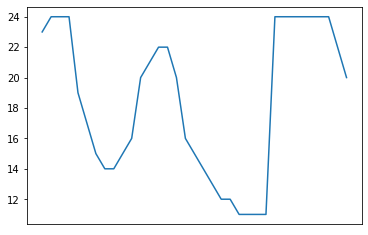

[28 33 35 36 27 24 20 18 17 19 20 28 29 32 33 29 23 21 20 18 16 17 15 15
 15 15 30 30 31 30 33 38 37 32 27]


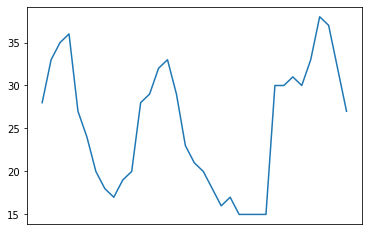

CHARACTERS BREAK POINTS :  [8, 22]
DIMENSION :  2
SHAPE :  (26, 26)
SIZE(NO OF PIXELS) :  676


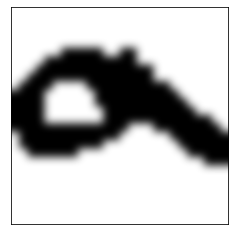

[5, 8, 10, 11, 8, 7, 8, 8, 7, 8, 10, 10, 10, 10, 9, 7, 7, 6, 6, 6, 6, 6, 5, 6, 5, 4]


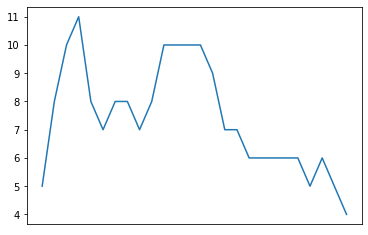

[16, 17, 18, 19, 20, 20, 21, 21, 21, 21, 21, 20, 20, 21, 21, 19, 19, 17, 17, 16, 15, 14, 13, 13, 12, 11]


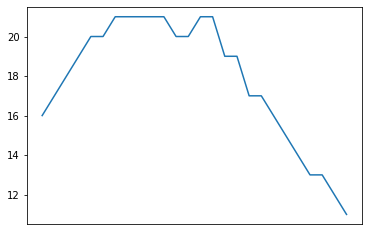

[21 25 28 30 28 27 29 29 28 29 31 30 30 31 30 26 26 23 23 22 21 20 18 19
 17 15]


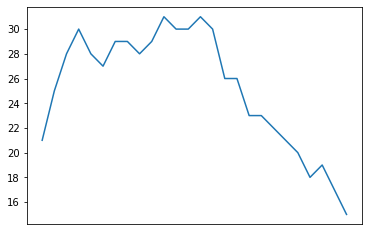

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (33, 45)
SIZE(NO OF PIXELS) :  1485


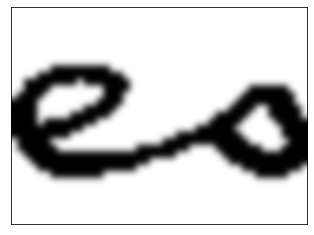

[6, 9, 12, 13, 11, 11, 11, 10, 10, 10, 9, 10, 10, 10, 11, 9, 8, 5, 3, 3, 3, 2, 2, 3, 3, 3, 3, 2, 3, 3, 4, 6, 7, 9, 9, 9, 8, 8, 7, 9, 10, 13, 12, 10, 7]


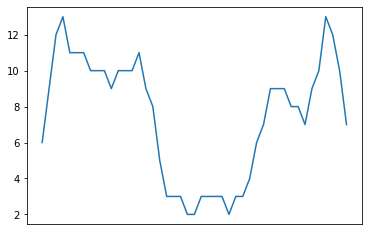

[19, 20, 22, 22, 23, 23, 24, 24, 24, 24, 24, 24, 24, 24, 24, 23, 23, 22, 11, 12, 12, 12, 12, 13, 13, 14, 14, 14, 15, 15, 16, 17, 17, 18, 19, 20, 21, 21, 21, 21, 21, 21, 20, 18, 16]


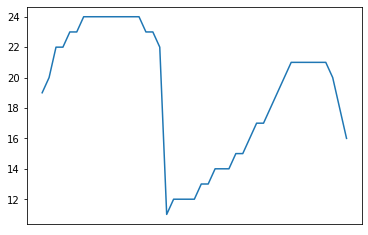

[25 29 34 35 34 34 35 34 34 34 33 34 34 34 35 32 31 27 14 15 15 14 14 16
 16 17 17 16 18 18 20 23 24 27 28 29 29 29 28 30 31 34 32 28 23]


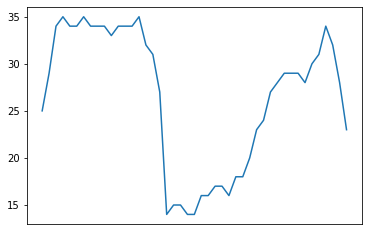

CHARACTERS BREAK POINTS :  [18]
DIMENSION :  2
SHAPE :  (33, 25)
SIZE(NO OF PIXELS) :  825


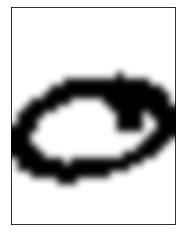

[5, 9, 10, 10, 7, 6, 7, 7, 7, 7, 6, 6, 6, 6, 7, 7, 11, 11, 10, 11, 8, 9, 10, 8, 5]


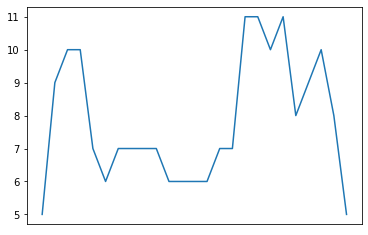

[15, 17, 18, 19, 19, 20, 21, 21, 22, 22, 22, 22, 22, 22, 22, 22, 23, 22, 22, 22, 22, 21, 21, 20, 18]


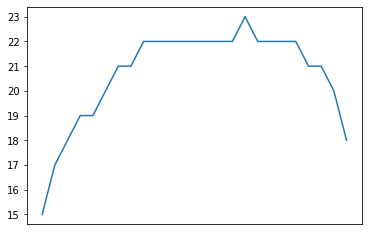

[20 26 28 29 26 26 28 28 29 29 28 28 28 28 29 29 34 33 32 33 30 30 31 28
 23]


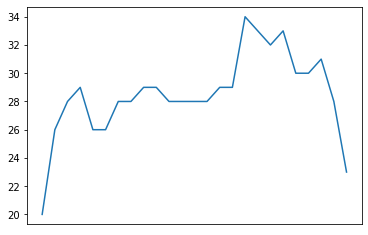

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (33, 49)
SIZE(NO OF PIXELS) :  1617


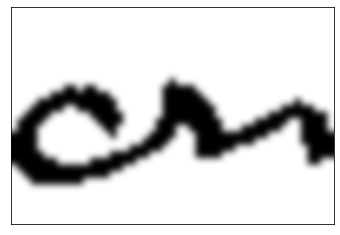

[5, 8, 10, 12, 9, 7, 7, 6, 6, 6, 6, 6, 8, 8, 9, 9, 5, 2, 3, 2, 3, 3, 5, 9, 9, 6, 6, 7, 10, 9, 8, 6, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 2, 3, 6, 9, 8, 7, 4]


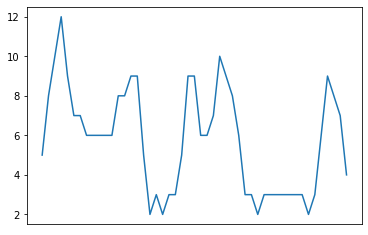

[14, 16, 17, 18, 19, 19, 20, 20, 21, 21, 20, 21, 21, 20, 20, 19, 17, 11, 12, 12, 13, 14, 16, 21, 22, 21, 21, 21, 20, 19, 18, 16, 14, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 19, 18, 18, 17, 17, 14]


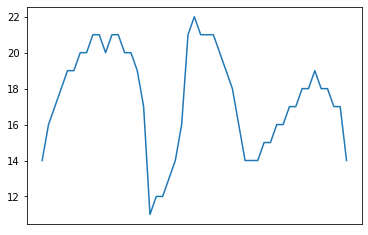

[19 24 27 30 28 26 27 26 27 27 26 27 29 28 29 28 22 13 15 14 16 17 21 30
 31 27 27 28 30 28 26 22 17 17 16 18 18 19 19 20 20 21 20 22 24 27 25 24
 18]


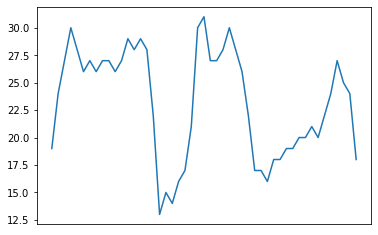

CHARACTERS BREAK POINTS :  [17, 34]
DIMENSION :  2
SHAPE :  (25, 37)
SIZE(NO OF PIXELS) :  925


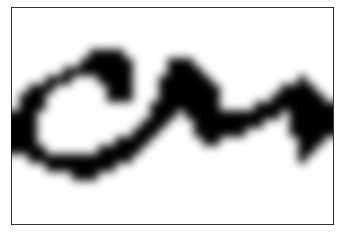

[5, 7, 9, 5, 4, 3, 4, 4, 5, 6, 7, 9, 9, 8, 3, 3, 4, 6, 7, 6, 7, 8, 8, 7, 3, 3, 3, 2, 3, 2, 3, 3, 6, 10, 8, 6, 4]


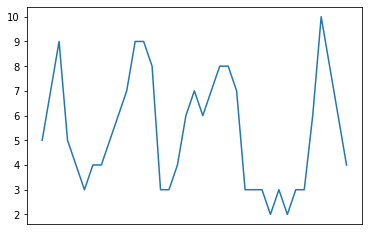

[13, 15, 16, 16, 17, 17, 18, 18, 19, 20, 20, 20, 20, 19, 11, 12, 14, 17, 19, 19, 19, 18, 17, 16, 13, 13, 13, 13, 14, 14, 15, 16, 16, 17, 16, 15, 14]


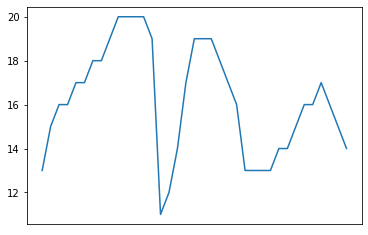

[18 22 25 21 21 20 22 22 24 26 27 29 29 27 14 15 18 23 26 25 26 26 25 23
 16 16 16 15 17 16 18 19 22 27 24 21 18]


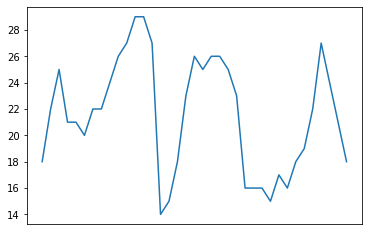

CHARACTERS BREAK POINTS :  [14, 27]
DIMENSION :  2
SHAPE :  (35, 54)
SIZE(NO OF PIXELS) :  1890


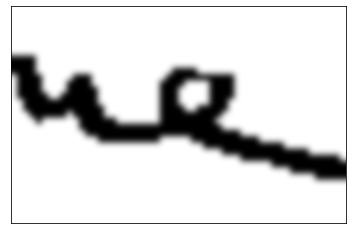

[3, 7, 9, 10, 8, 4, 3, 3, 4, 5, 7, 9, 10, 8, 6, 4, 4, 3, 3, 3, 3, 3, 3, 3, 9, 10, 11, 8, 6, 7, 7, 8, 12, 11, 10, 8, 4, 4, 4, 4, 3, 3, 4, 4, 3, 4, 4, 4, 3, 4, 4, 4, 4, 3]


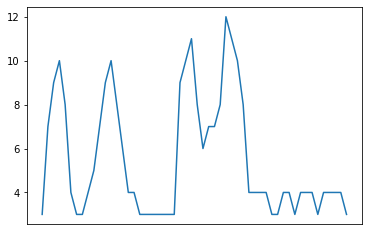

[27, 27, 27, 27, 24, 21, 20, 20, 21, 23, 24, 24, 24, 22, 19, 17, 17, 16, 16, 16, 16, 16, 16, 16, 23, 24, 25, 25, 25, 25, 24, 24, 24, 24, 24, 24, 15, 14, 14, 14, 13, 13, 13, 13, 12, 12, 12, 12, 11, 11, 11, 11, 11, 10]


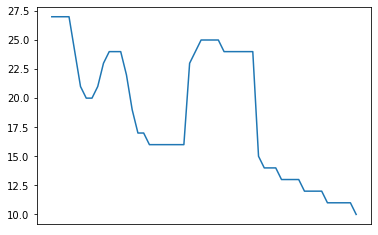

[30 34 36 37 32 25 23 23 25 28 31 33 34 30 25 21 21 19 19 19 19 19 19 19
 32 34 36 33 31 32 31 32 36 35 34 32 19 18 18 18 16 16 17 17 15 16 16 16
 14 15 15 15 15 13]


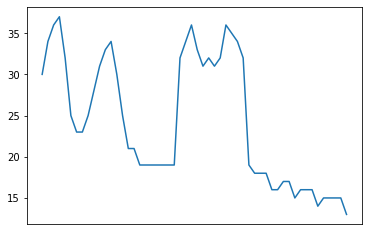

CHARACTERS BREAK POINTS :  [17]
DIMENSION :  2
SHAPE :  (53, 115)
SIZE(NO OF PIXELS) :  6095


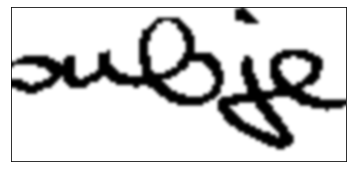

[5, 4, 6, 6, 6, 7, 6, 6, 7, 7, 7, 7, 8, 9, 9, 7, 6, 4, 8, 10, 11, 11, 4, 3, 3, 4, 3, 3, 3, 4, 9, 8, 8, 10, 6, 5, 5, 4, 4, 4, 3, 3, 4, 4, 12, 19, 19, 16, 9, 9, 9, 10, 8, 9, 9, 9, 9, 12, 12, 16, 17, 14, 12, 6, 6, 6, 7, 8, 9, 12, 13, 15, 11, 8, 9, 9, 9, 13, 12, 17, 22, 24, 22, 16, 15, 12, 12, 14, 15, 21, 23, 25, 24, 19, 16, 13, 10, 7, 10, 11, 11, 11, 11, 15, 13, 12, 7, 3, 4, 3, 3, 3, 3, 3, 2]


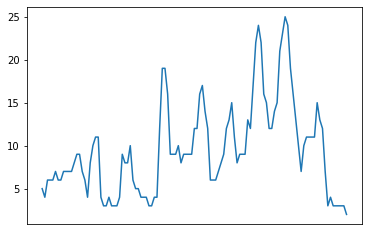

[34, 34, 35, 35, 36, 36, 36, 36, 36, 36, 36, 36, 36, 35, 35, 34, 34, 33, 35, 36, 36, 36, 29, 28, 28, 29, 29, 30, 30, 31, 37, 37, 37, 38, 33, 32, 31, 30, 30, 30, 29, 29, 29, 29, 42, 45, 45, 46, 47, 48, 49, 49, 49, 49, 49, 49, 49, 49, 48, 47, 46, 45, 43, 37, 37, 37, 37, 37, 37, 36, 35, 34, 31, 22, 22, 22, 23, 52, 52, 53, 52, 51, 50, 49, 48, 25, 24, 24, 24, 35, 36, 37, 37, 38, 38, 38, 38, 38, 38, 38, 38, 38, 37, 37, 36, 36, 35, 21, 21, 21, 21, 21, 21, 21, 21]


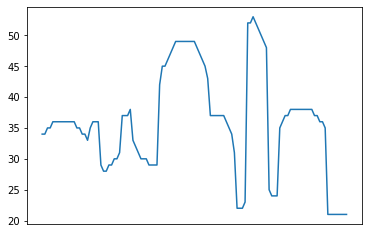

[39 38 41 41 42 43 42 42 43 43 43 43 44 44 44 41 40 37 43 46 47 47 33 31
 31 33 32 33 33 35 46 45 45 48 39 37 36 34 34 34 32 32 33 33 54 64 64 62
 56 57 58 59 57 58 58 58 58 61 60 63 63 59 55 43 43 43 44 45 46 48 48 49
 42 30 31 31 32 65 64 70 74 75 72 65 63 37 36 38 39 56 59 62 61 57 54 51
 48 45 48 49 49 49 48 52 49 48 42 24 25 24 24 24 24 24 23]


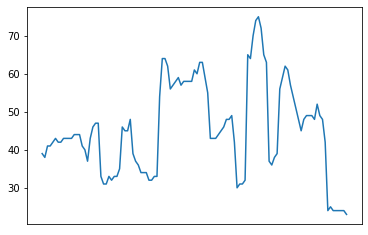

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (53, 42)
SIZE(NO OF PIXELS) :  2226


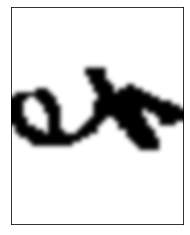

[7, 10, 11, 7, 5, 6, 7, 8, 9, 13, 12, 10, 4, 3, 3, 2, 3, 3, 6, 8, 14, 14, 13, 9, 8, 7, 10, 10, 13, 14, 14, 15, 12, 11, 9, 8, 6, 6, 6, 5, 4, 3]


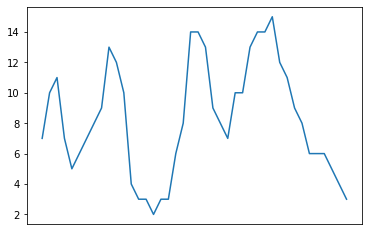

[31, 32, 32, 32, 32, 32, 33, 33, 33, 32, 31, 29, 23, 22, 22, 22, 23, 24, 38, 38, 38, 38, 38, 35, 34, 32, 33, 33, 34, 34, 33, 33, 32, 32, 31, 31, 30, 30, 30, 29, 29, 28]


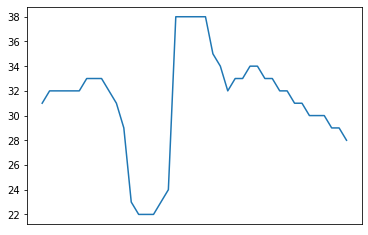

[38 42 43 39 37 38 40 41 42 45 43 39 27 25 25 24 26 27 44 46 52 52 51 44
 42 39 43 43 47 48 47 48 44 43 40 39 36 36 36 34 33 31]


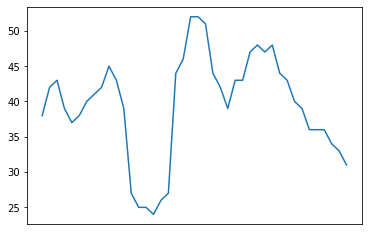

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (33, 58)
SIZE(NO OF PIXELS) :  1914


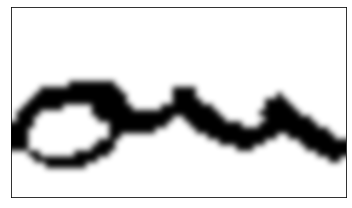

[5, 7, 8, 6, 6, 5, 6, 6, 6, 5, 6, 7, 7, 6, 9, 10, 10, 12, 9, 7, 5, 4, 4, 4, 4, 3, 4, 3, 5, 5, 6, 7, 6, 5, 6, 5, 5, 4, 4, 5, 4, 4, 3, 5, 7, 7, 7, 6, 6, 5, 5, 6, 5, 5, 5, 5, 4, 3]


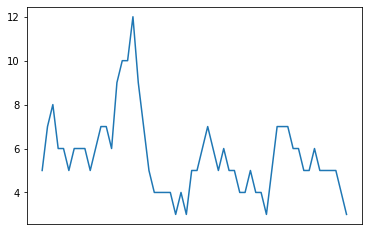

[13, 15, 16, 17, 18, 19, 19, 19, 19, 19, 20, 20, 20, 20, 20, 20, 20, 20, 19, 18, 16, 15, 15, 15, 15, 15, 16, 16, 19, 19, 19, 19, 17, 16, 16, 15, 14, 13, 13, 13, 12, 12, 12, 15, 17, 17, 18, 17, 16, 15, 14, 14, 13, 12, 12, 11, 10, 10]


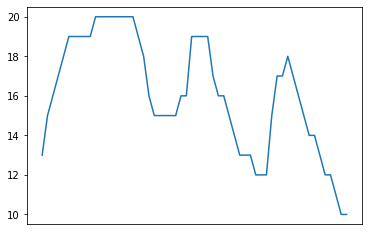

[18 22 24 23 24 24 25 25 25 24 26 27 27 26 29 30 30 32 28 25 21 19 19 19
 19 18 20 19 24 24 25 26 23 21 22 20 19 17 17 18 16 16 15 20 24 24 25 23
 22 20 19 20 18 17 17 16 14 13]


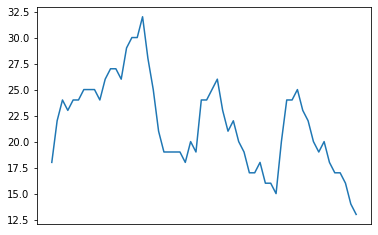

CHARACTERS BREAK POINTS :  [25, 27, 42, 50]
DIMENSION :  2
SHAPE :  (33, 35)
SIZE(NO OF PIXELS) :  1155


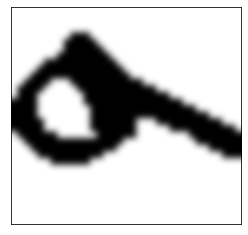

[5, 8, 10, 12, 10, 8, 8, 8, 10, 12, 13, 15, 17, 17, 15, 14, 12, 10, 9, 6, 5, 5, 5, 5, 5, 5, 4, 5, 5, 5, 5, 5, 5, 5, 4]


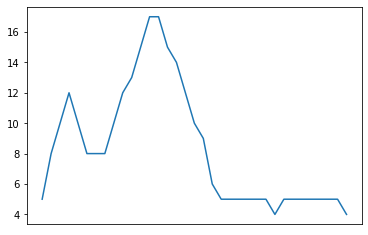

[19, 21, 22, 23, 24, 25, 25, 26, 28, 29, 29, 29, 28, 27, 26, 25, 24, 23, 22, 22, 21, 21, 20, 20, 19, 19, 18, 18, 17, 17, 16, 16, 15, 15, 14]


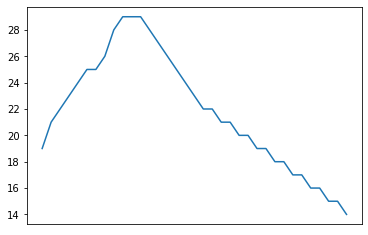

[24 29 32 35 34 33 33 34 38 41 42 44 45 44 41 39 36 33 31 28 26 26 25 25
 24 24 22 23 22 22 21 21 20 20 18]


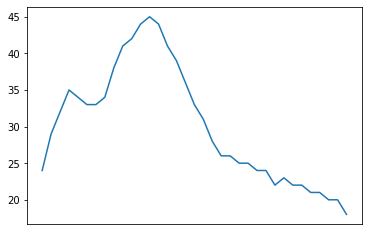

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (32, 58)
SIZE(NO OF PIXELS) :  1856


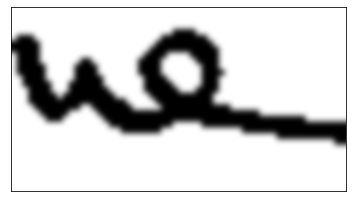

[2, 7, 9, 12, 12, 9, 7, 5, 4, 4, 5, 8, 8, 8, 8, 7, 6, 6, 5, 6, 5, 4, 7, 11, 13, 15, 13, 11, 10, 9, 9, 10, 11, 16, 15, 12, 5, 4, 3, 3, 4, 4, 4, 3, 3, 3, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 4, 4]


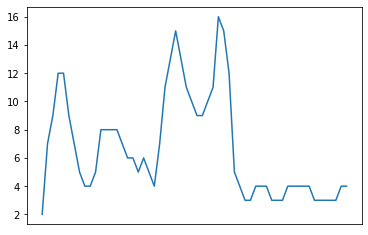

[26, 27, 27, 27, 26, 22, 19, 17, 16, 17, 19, 22, 23, 23, 22, 20, 18, 17, 16, 16, 15, 14, 23, 24, 25, 26, 27, 27, 28, 28, 28, 28, 27, 27, 26, 25, 21, 15, 14, 14, 14, 14, 14, 13, 13, 13, 13, 13, 13, 13, 13, 12, 12, 12, 12, 12, 12, 12]


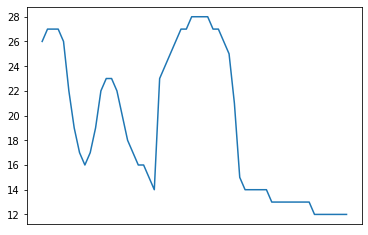

[28 34 36 39 38 31 26 22 20 21 24 30 31 31 30 27 24 23 21 22 20 18 30 35
 38 41 40 38 38 37 37 38 38 43 41 37 26 19 17 17 18 18 18 16 16 16 17 17
 17 17 17 15 15 15 15 15 16 16]


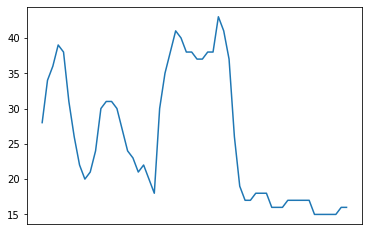

CHARACTERS BREAK POINTS :  [21]
DIMENSION :  2
SHAPE :  (28, 26)
SIZE(NO OF PIXELS) :  728


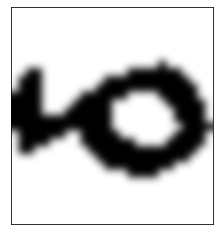

[5, 10, 11, 10, 4, 3, 3, 3, 4, 7, 8, 10, 12, 8, 7, 8, 7, 7, 7, 8, 9, 11, 11, 9, 6, 1]


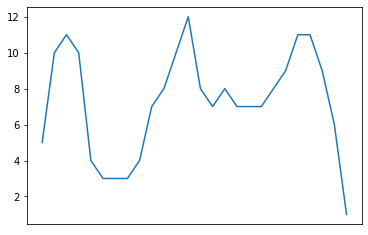

[17, 19, 20, 20, 14, 14, 14, 15, 16, 17, 17, 18, 19, 19, 19, 20, 20, 20, 20, 21, 20, 20, 19, 18, 16, 13]


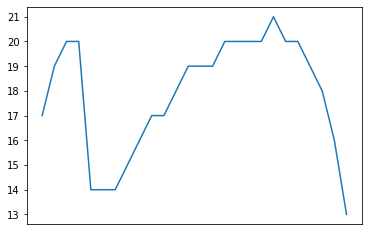

[22 29 31 30 18 17 17 18 20 24 25 28 31 27 26 28 27 27 27 29 29 31 30 27
 22 14]


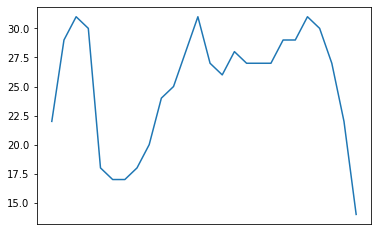

CHARACTERS BREAK POINTS :  [5]
DIMENSION :  2
SHAPE :  (32, 22)
SIZE(NO OF PIXELS) :  704


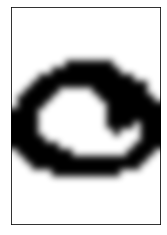

[6, 9, 11, 13, 10, 8, 9, 7, 8, 7, 7, 7, 8, 9, 13, 13, 10, 11, 10, 12, 9, 7]


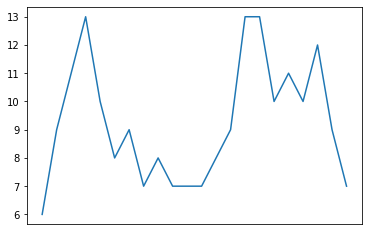

[17, 19, 20, 21, 22, 22, 23, 23, 24, 24, 24, 24, 24, 24, 24, 23, 22, 22, 21, 21, 19, 18]


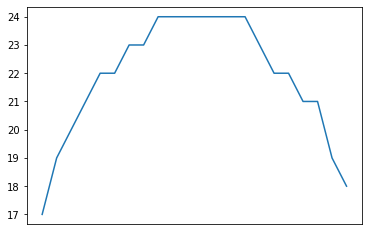

[23 28 31 34 32 30 32 30 32 31 31 31 32 33 37 36 32 33 31 33 28 25]


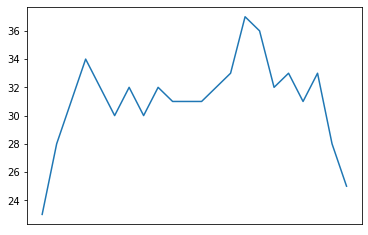

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (38, 62)
SIZE(NO OF PIXELS) :  2356


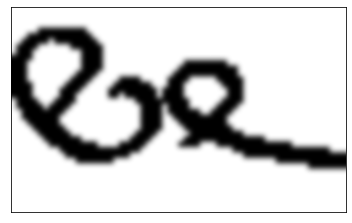

[8, 12, 15, 13, 9, 9, 9, 10, 12, 13, 13, 13, 13, 15, 13, 11, 8, 3, 5, 5, 6, 7, 7, 9, 12, 11, 9, 6, 3, 7, 9, 12, 12, 10, 10, 8, 8, 9, 12, 14, 13, 12, 9, 4, 4, 4, 4, 3, 3, 4, 4, 4, 3, 3, 3, 4, 4, 4, 4, 3, 3, 3]


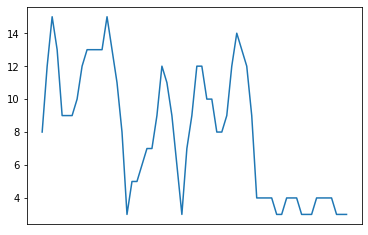

[29, 31, 32, 33, 33, 34, 34, 34, 34, 34, 34, 34, 34, 34, 33, 32, 31, 12, 23, 24, 25, 25, 25, 25, 24, 24, 23, 21, 23, 25, 26, 27, 28, 28, 28, 28, 28, 28, 28, 28, 27, 27, 25, 14, 14, 14, 14, 13, 13, 13, 13, 13, 12, 12, 12, 12, 12, 12, 12, 11, 11, 11]


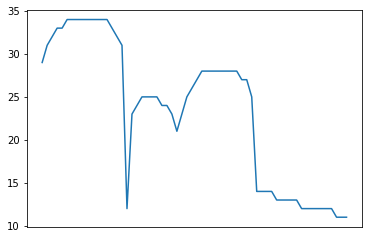

[37 43 47 46 42 43 43 44 46 47 47 47 47 49 46 43 39 15 28 29 31 32 32 34
 36 35 32 27 26 32 35 39 40 38 38 36 36 37 40 42 40 39 34 18 18 18 18 16
 16 17 17 17 15 15 15 16 16 16 16 14 14 14]


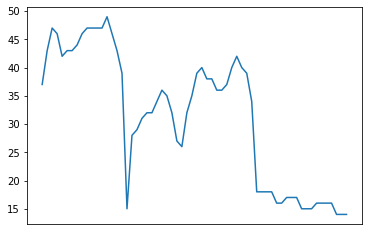

CHARACTERS BREAK POINTS :  [17]
DIMENSION :  2
SHAPE :  (33, 27)
SIZE(NO OF PIXELS) :  891


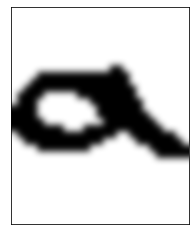

[4, 7, 9, 10, 9, 7, 7, 7, 6, 6, 7, 8, 8, 10, 10, 11, 10, 9, 8, 7, 5, 5, 5, 4, 4, 3, 2]


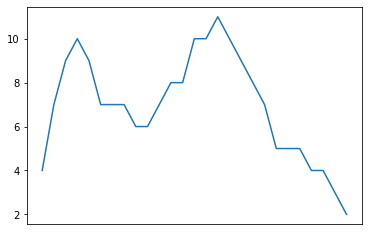

[18, 20, 21, 22, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 24, 24, 23, 21, 19, 17, 16, 15, 14, 14, 13, 12]


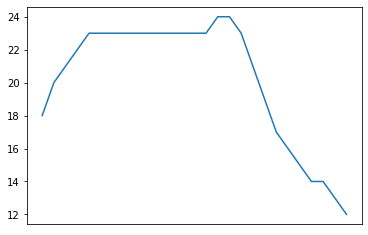

[22 27 30 32 32 30 30 30 29 29 30 31 31 33 33 35 34 32 29 26 22 21 20 18
 18 16 14]


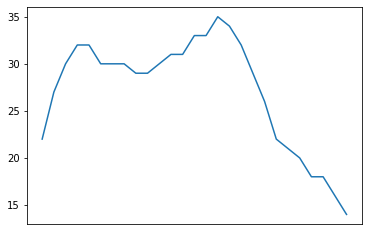

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (33, 101)
SIZE(NO OF PIXELS) :  3333


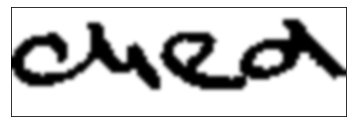

[4, 8, 10, 12, 9, 9, 8, 7, 7, 6, 7, 8, 9, 9, 11, 10, 7, 3, 3, 3, 3, 3, 3, 6, 12, 11, 11, 11, 8, 8, 7, 5, 4, 3, 3, 8, 7, 8, 9, 9, 8, 7, 7, 6, 4, 2, 7, 9, 11, 9, 8, 8, 7, 10, 12, 12, 11, 13, 13, 11, 9, 5, 4, 4, 4, 4, 3, 4, 4, 8, 10, 8, 10, 8, 7, 7, 6, 6, 6, 6, 6, 7, 12, 12, 15, 14, 12, 9, 8, 6, 7, 6, 7, 6, 6, 6, 6, 6, 4, 3, 2]


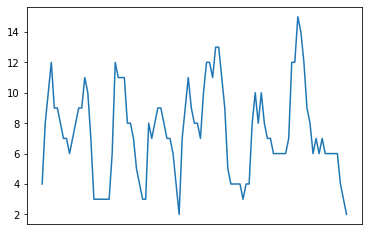

[18, 20, 21, 22, 23, 23, 24, 24, 24, 24, 24, 25, 25, 25, 24, 23, 22, 14, 14, 15, 16, 16, 17, 28, 28, 28, 28, 27, 23, 22, 20, 18, 17, 16, 16, 21, 21, 22, 21, 20, 18, 16, 15, 14, 12, 19, 22, 23, 24, 24, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 24, 23, 12, 12, 12, 12, 11, 12, 12, 17, 19, 20, 21, 21, 22, 22, 23, 23, 23, 23, 23, 23, 29, 29, 29, 29, 29, 28, 27, 25, 24, 23, 22, 21, 20, 19, 18, 17, 16, 15, 14]


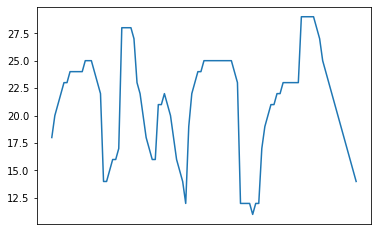

[22 28 31 34 32 32 32 31 31 30 31 33 34 34 35 33 29 17 17 18 19 19 20 34
 40 39 39 38 31 30 27 23 21 19 19 29 28 30 30 29 26 23 22 20 16 21 29 32
 35 33 33 33 32 35 37 37 36 38 38 36 33 28 16 16 16 16 14 16 16 25 29 28
 31 29 29 29 29 29 29 29 29 30 41 41 44 43 41 37 35 31 31 29 29 27 26 25
 24 23 20 18 16]


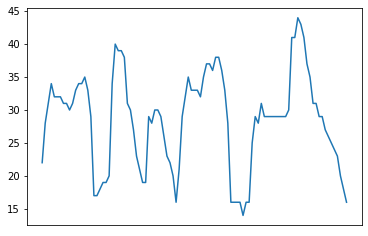

CHARACTERS BREAK POINTS :  [17, 33, 44, 66]
DIMENSION :  2
SHAPE :  (31, 56)
SIZE(NO OF PIXELS) :  1736


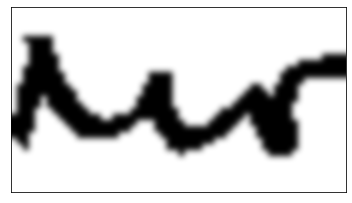

[4, 10, 15, 16, 12, 10, 12, 10, 8, 7, 7, 6, 5, 4, 4, 3, 3, 4, 3, 3, 3, 4, 6, 8, 10, 11, 13, 7, 6, 4, 4, 4, 3, 4, 4, 5, 4, 4, 4, 4, 7, 9, 10, 10, 12, 14, 15, 11, 4, 3, 3, 3, 4, 4, 4, 4]


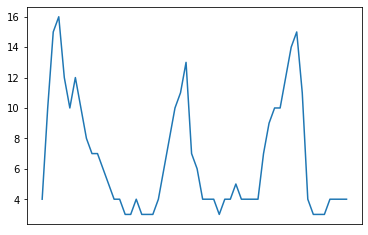

[13, 18, 26, 26, 26, 26, 26, 23, 20, 18, 17, 15, 14, 13, 13, 12, 12, 13, 13, 13, 14, 16, 18, 20, 20, 20, 20, 14, 12, 11, 11, 11, 11, 12, 13, 14, 14, 15, 16, 17, 18, 18, 17, 16, 18, 20, 21, 21, 22, 22, 22, 22, 23, 23, 23, 23]


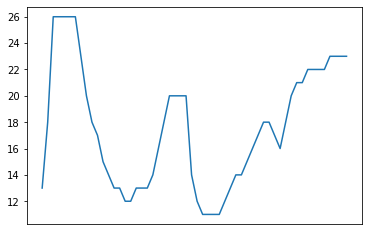

[17 28 41 42 38 36 38 33 28 25 24 21 19 17 17 15 15 17 16 16 17 20 24 28
 30 31 33 21 18 15 15 15 14 16 17 19 18 19 20 21 25 27 27 26 30 34 36 32
 26 25 25 25 27 27 27 27]


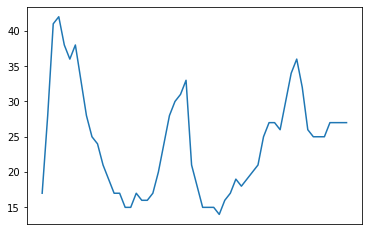

CHARACTERS BREAK POINTS :  [15, 32]
DIMENSION :  2
SHAPE :  (31, 31)
SIZE(NO OF PIXELS) :  961


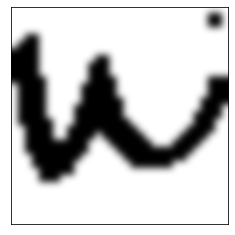

[5, 12, 17, 19, 15, 9, 6, 5, 7, 8, 10, 11, 11, 12, 10, 8, 6, 6, 5, 4, 3, 3, 3, 3, 4, 4, 5, 6, 10, 8, 4]


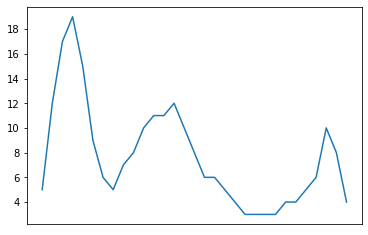

[25, 26, 27, 27, 21, 15, 12, 12, 14, 17, 20, 23, 24, 24, 21, 18, 15, 14, 13, 12, 11, 11, 11, 12, 13, 14, 16, 18, 30, 30, 21]


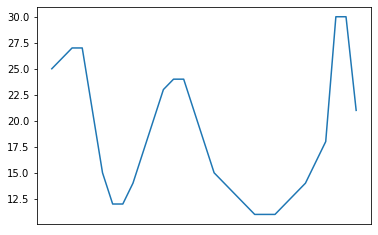

[30 38 44 46 36 24 18 17 21 25 30 34 35 36 31 26 21 20 18 16 14 14 14 15
 17 18 21 24 40 38 25]


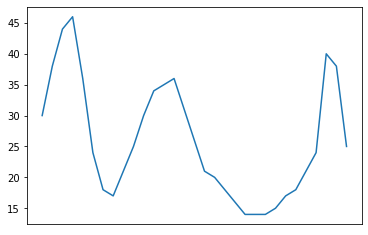

CHARACTERS BREAK POINTS :  [7, 20]
DIMENSION :  2
SHAPE :  (43, 65)
SIZE(NO OF PIXELS) :  2795


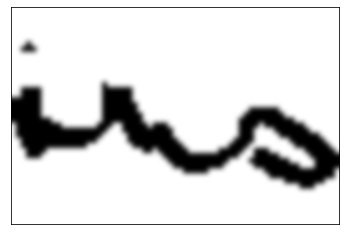

[5, 8, 13, 16, 15, 14, 7, 6, 5, 5, 4, 4, 4, 4, 4, 3, 3, 3, 10, 8, 7, 7, 9, 11, 9, 7, 6, 5, 5, 6, 7, 7, 6, 5, 5, 4, 4, 4, 4, 3, 3, 4, 3, 3, 4, 7, 7, 8, 8, 7, 9, 9, 10, 9, 9, 9, 9, 9, 9, 9, 10, 9, 7, 6, 3]


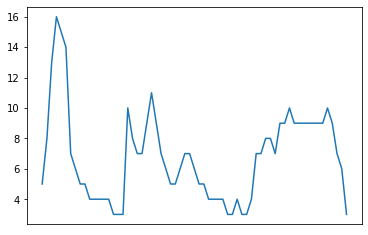

[25, 25, 35, 36, 35, 27, 21, 21, 20, 20, 19, 19, 19, 19, 19, 19, 19, 20, 28, 27, 27, 27, 27, 27, 24, 22, 20, 19, 20, 20, 20, 19, 17, 16, 15, 14, 14, 14, 14, 14, 14, 15, 15, 16, 17, 21, 22, 23, 23, 23, 23, 23, 23, 22, 21, 21, 20, 20, 19, 18, 18, 17, 16, 15, 14]


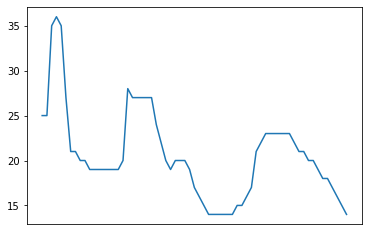

[30 33 48 52 50 41 28 27 25 25 23 23 23 23 23 22 22 23 38 35 34 34 36 38
 33 29 26 24 25 26 27 26 23 21 20 18 18 18 18 17 17 19 18 19 21 28 29 31
 31 30 32 32 33 31 30 30 29 29 28 27 28 26 23 21 17]


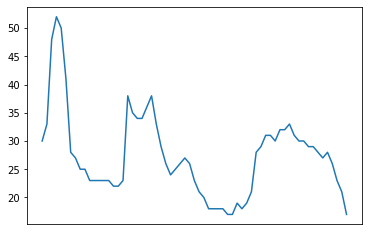

CHARACTERS BREAK POINTS :  [39]
DIMENSION :  2
SHAPE :  (33, 30)
SIZE(NO OF PIXELS) :  990


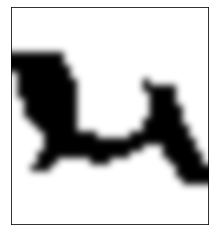

[3, 7, 10, 12, 15, 18, 17, 16, 14, 12, 4, 4, 5, 4, 4, 3, 3, 3, 3, 3, 6, 9, 9, 11, 12, 11, 9, 7, 5, 3]


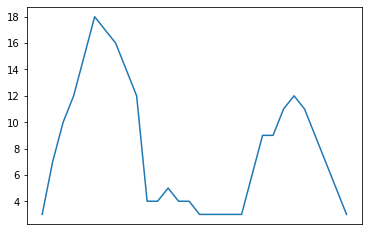

[26, 26, 26, 26, 26, 26, 26, 26, 24, 22, 14, 14, 14, 13, 13, 13, 13, 13, 14, 14, 22, 21, 21, 21, 21, 18, 15, 13, 11, 9]


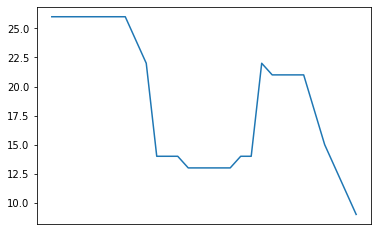

[29 33 36 38 41 44 43 42 38 34 18 18 19 17 17 16 16 16 17 17 28 30 30 32
 33 29 24 20 16 12]


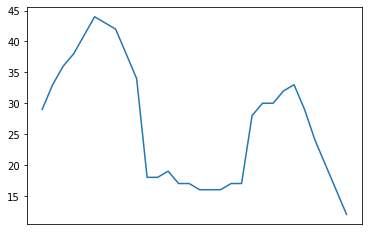

CHARACTERS BREAK POINTS :  [15]
DIMENSION :  2
SHAPE :  (32, 31)
SIZE(NO OF PIXELS) :  992


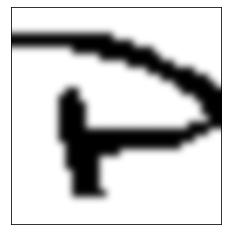

[2, 2, 2, 2, 2, 2, 2, 9, 14, 19, 17, 13, 13, 9, 8, 7, 6, 7, 6, 6, 7, 6, 6, 6, 6, 6, 7, 6, 8, 7, 6]


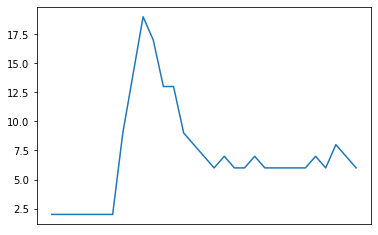

[28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 27, 27, 27, 26, 26, 26, 25, 24, 24, 23, 23, 23, 22, 22, 21, 20]


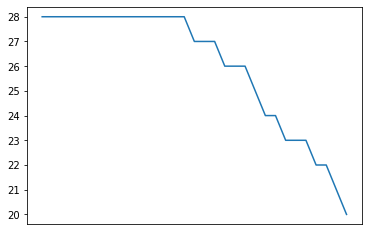

[30 30 30 30 30 30 30 37 42 47 45 41 41 37 36 34 33 34 32 32 33 31 30 30
 29 29 30 28 30 28 26]


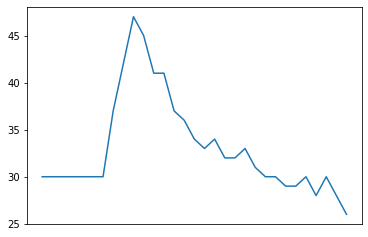

CHARACTERS BREAK POINTS :  []
DIMENSION :  2
SHAPE :  (35, 50)
SIZE(NO OF PIXELS) :  1750


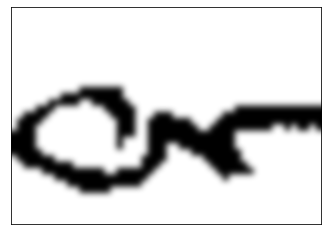

[4, 7, 9, 9, 6, 5, 5, 4, 5, 6, 5, 6, 6, 7, 7, 7, 7, 13, 9, 8, 3, 4, 9, 9, 8, 5, 4, 5, 5, 5, 4, 5, 7, 9, 11, 10, 8, 6, 5, 4, 4, 4, 3, 3, 4, 3, 4, 4, 3, 4]


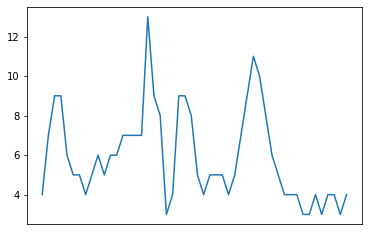

[15, 17, 18, 18, 19, 19, 20, 20, 21, 21, 21, 22, 22, 22, 22, 22, 22, 22, 20, 19, 9, 11, 17, 18, 18, 18, 17, 17, 17, 16, 15, 15, 16, 17, 18, 18, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19]


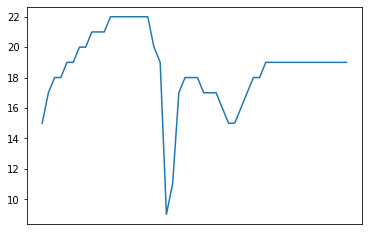

[19 24 27 27 25 24 25 24 26 27 26 28 28 29 29 29 29 35 29 27 12 15 26 27
 26 23 21 22 22 21 19 20 23 26 29 28 27 25 24 23 23 23 22 22 23 22 23 23
 22 23]


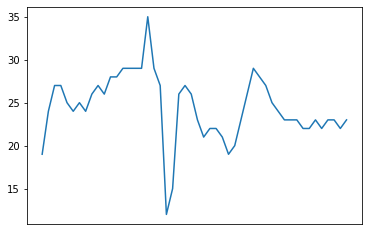

CHARACTERS BREAK POINTS :  [20, 30]
DIMENSION :  2
SHAPE :  (33, 31)
SIZE(NO OF PIXELS) :  1023


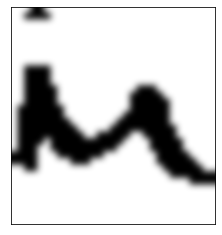

[2, 9, 17, 18, 14, 12, 10, 8, 6, 6, 5, 4, 3, 4, 3, 4, 4, 4, 6, 7, 8, 10, 11, 11, 8, 6, 4, 4, 3, 2, 2]


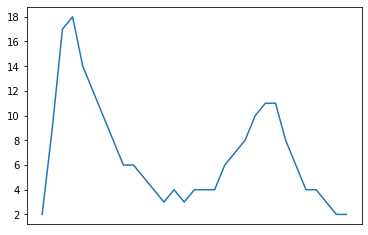

[11, 18, 32, 33, 33, 32, 21, 18, 16, 15, 14, 13, 13, 14, 14, 15, 16, 17, 20, 21, 21, 21, 20, 19, 15, 13, 11, 10, 9, 8, 8]


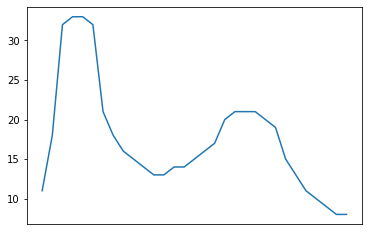

[13 27 49 51 47 44 31 26 22 21 19 17 16 18 17 19 20 21 26 28 29 31 31 30
 23 19 15 14 12 10 10]


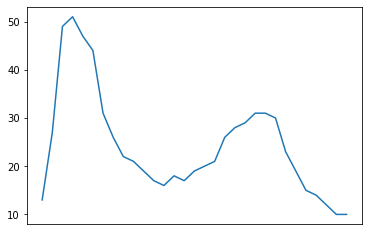

CHARACTERS BREAK POINTS :  [12]
DIMENSION :  2
SHAPE :  (33, 48)
SIZE(NO OF PIXELS) :  1584


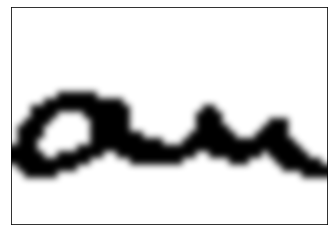

[3, 7, 9, 11, 9, 7, 6, 6, 6, 6, 6, 7, 10, 9, 8, 8, 9, 8, 5, 5, 4, 4, 4, 3, 3, 3, 3, 4, 6, 7, 8, 7, 5, 5, 4, 4, 3, 4, 4, 6, 7, 8, 5, 4, 4, 3, 3, 2]


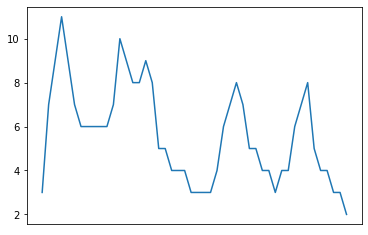

[12, 15, 16, 18, 18, 19, 19, 20, 20, 20, 20, 20, 20, 19, 19, 19, 19, 18, 14, 14, 13, 13, 13, 12, 12, 12, 13, 14, 17, 18, 18, 17, 15, 14, 13, 13, 13, 14, 15, 16, 16, 16, 13, 12, 11, 10, 10, 9]


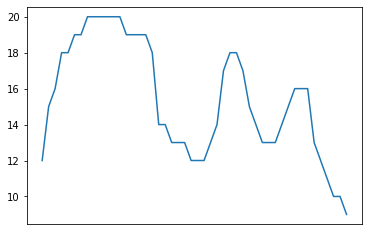

[15 22 25 29 27 26 25 26 26 26 26 27 30 28 27 27 28 26 19 19 17 17 17 15
 15 15 16 18 23 25 26 24 20 19 17 17 16 18 19 22 23 24 18 16 15 13 13 11]


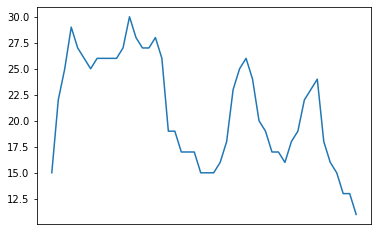

CHARACTERS BREAK POINTS :  [23, 36]
DIMENSION :  2
SHAPE :  (40, 107)
SIZE(NO OF PIXELS) :  4280


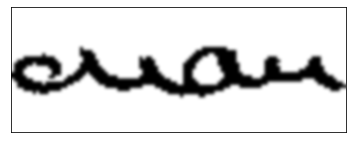

[2, 6, 9, 9, 9, 7, 7, 6, 6, 7, 7, 7, 8, 10, 8, 7, 2, 3, 3, 3, 3, 4, 8, 8, 7, 8, 8, 7, 6, 5, 5, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 8, 8, 9, 9, 8, 7, 5, 5, 4, 5, 4, 4, 3, 4, 10, 11, 12, 10, 8, 7, 7, 6, 5, 5, 5, 9, 12, 13, 12, 11, 11, 7, 5, 4, 4, 4, 3, 3, 3, 3, 8, 8, 8, 8, 6, 3, 3, 3, 3, 3, 3, 4, 3, 4, 6, 7, 8, 9, 6, 5, 4, 5, 4, 3, 2, 1]


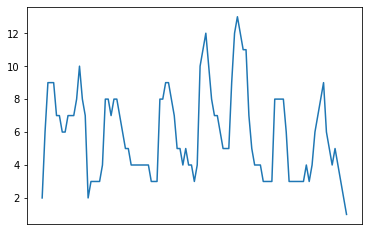

[19, 22, 23, 23, 24, 24, 24, 24, 24, 24, 25, 24, 24, 24, 23, 22, 16, 17, 18, 18, 19, 20, 27, 26, 26, 26, 25, 23, 21, 20, 19, 18, 18, 18, 17, 17, 17, 17, 17, 17, 17, 24, 23, 24, 24, 23, 21, 19, 18, 17, 17, 16, 16, 15, 15, 22, 23, 24, 25, 26, 26, 27, 27, 27, 27, 27, 27, 27, 27, 26, 26, 26, 22, 19, 18, 18, 18, 17, 17, 17, 18, 23, 24, 24, 24, 23, 19, 19, 19, 19, 19, 19, 20, 20, 21, 23, 24, 24, 24, 21, 19, 18, 18, 17, 16, 16, 15]


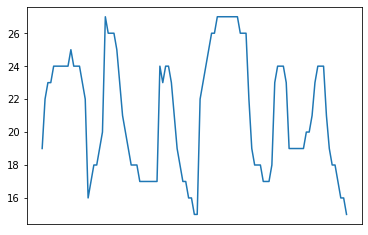

[21 28 32 32 33 31 31 30 30 31 32 31 32 34 31 29 18 20 21 21 22 24 35 34
 33 34 33 30 27 25 24 22 22 22 21 21 21 21 20 20 20 32 31 33 33 31 28 24
 23 21 22 20 20 18 19 32 34 36 35 34 33 34 33 32 32 32 36 39 40 38 37 37
 29 24 22 22 22 20 20 20 21 31 32 32 32 29 22 22 22 22 22 22 24 23 25 29
 31 32 33 27 24 22 23 21 19 18 16]


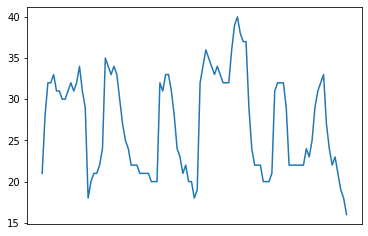

CHARACTERS BREAK POINTS :  [16, 53]
DIMENSION :  2
SHAPE :  (40, 54)
SIZE(NO OF PIXELS) :  2160


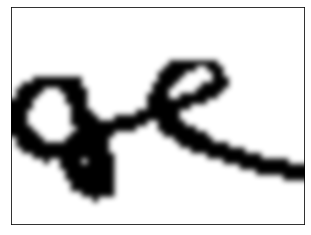

[7, 11, 13, 10, 9, 7, 6, 5, 5, 8, 13, 20, 21, 19, 16, 16, 14, 14, 11, 3, 3, 3, 3, 3, 3, 5, 7, 11, 13, 12, 12, 11, 9, 9, 8, 9, 9, 10, 8, 6, 3, 3, 4, 3, 3, 4, 3, 3, 3, 3, 4, 3, 3, 3]


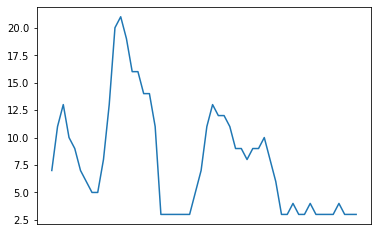

[23, 25, 26, 26, 27, 27, 27, 27, 27, 27, 27, 27, 27, 25, 21, 20, 19, 19, 19, 20, 20, 20, 20, 21, 21, 24, 26, 28, 29, 30, 30, 30, 30, 30, 30, 30, 30, 30, 29, 27, 14, 14, 14, 13, 13, 13, 12, 12, 12, 12, 12, 11, 11, 11]


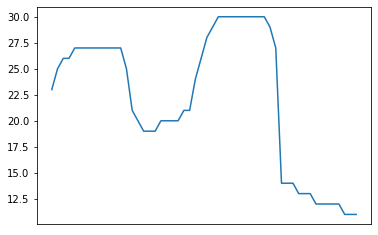

[30 36 39 36 36 34 33 32 32 35 40 47 48 44 37 36 33 33 30 23 23 23 23 24
 24 29 33 39 42 42 42 41 39 39 38 39 39 40 37 33 17 17 18 16 16 17 15 15
 15 15 16 14 14 14]


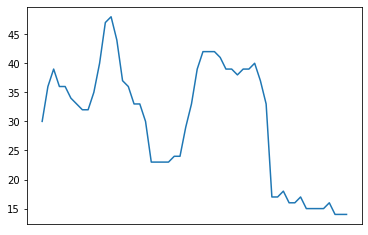

CHARACTERS BREAK POINTS :  []


In [26]:
FINAL_CHARACTERS=[]
for sen_no in range(len(SENTENCES)):
    Final_Characters_in_Sentences=[]
    for word_no in range(len(WORDS[sen_no])):
        Final_Characters_in_Words=[]
        for char_no in range(len(CHARACTERS[sen_no][word_no])):
            FINAL_SEGMENTED_CHARACTERS=[]
            Segment=CHARACTERS[sen_no][word_no][char_no]
            if(Segment[2]==0):
                FINAL_SEGMENTED_CHARACTERS.append(Segment)
            else:
                Touching_Character_Segmentation(Segment,Generate_VPP_AND_TDP_Average(Segment),FINAL_SEGMENTED_CHARACTERS)
            
            for Character in FINAL_SEGMENTED_CHARACTERS:
                Final_Characters_in_Words.append(Character)
                
        Final_Characters_in_Sentences.append(Final_Characters_in_Words)
        
    FINAL_CHARACTERS.append(Final_Characters_in_Sentences)
            

BOUNDARIES OF THE IMAGE :  [8, 0, 14, 28]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (28, 14)
SIZE(NO OF PIXELS) :  392


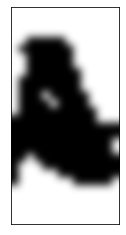

BOUNDARIES OF THE IMAGE :  [0, 0, 10, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 10)
SIZE(NO OF PIXELS) :  340


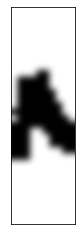

BOUNDARIES OF THE IMAGE :  [10, 0, 4, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 4)
SIZE(NO OF PIXELS) :  136


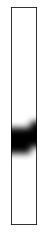

BOUNDARIES OF THE IMAGE :  [14, 0, 15, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 15)
SIZE(NO OF PIXELS) :  510


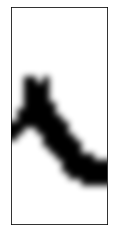

BOUNDARIES OF THE IMAGE :  [0, 0, 15, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 15)
SIZE(NO OF PIXELS) :  510


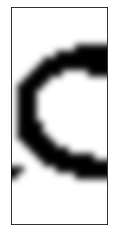

BOUNDARIES OF THE IMAGE :  [15, 0, 14, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 14)
SIZE(NO OF PIXELS) :  476


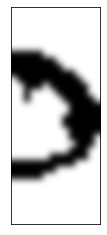

BOUNDARIES OF THE IMAGE :  [70, 0, 18, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 18)
SIZE(NO OF PIXELS) :  612


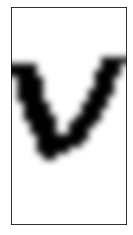

BOUNDARIES OF THE IMAGE :  [92, 0, 17, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 17)
SIZE(NO OF PIXELS) :  578


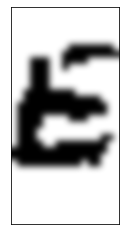

BOUNDARIES OF THE IMAGE :  [6, 0, 14, 29]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (29, 14)
SIZE(NO OF PIXELS) :  406


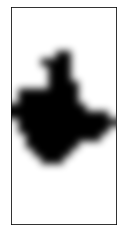

BOUNDARIES OF THE IMAGE :  [0, 0, 11, 29]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (29, 11)
SIZE(NO OF PIXELS) :  319


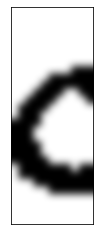

BOUNDARIES OF THE IMAGE :  [11, 0, 9, 29]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (29, 9)
SIZE(NO OF PIXELS) :  261


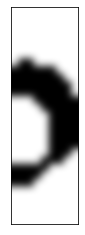

BOUNDARIES OF THE IMAGE :  [4, 0, 17, 35]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (35, 17)
SIZE(NO OF PIXELS) :  595


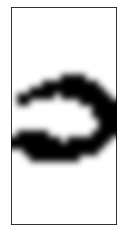

BOUNDARIES OF THE IMAGE :  [0, 0, 19, 35]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (35, 19)
SIZE(NO OF PIXELS) :  665


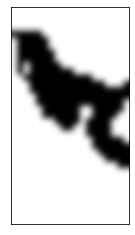

BOUNDARIES OF THE IMAGE :  [19, 0, 20, 35]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (35, 20)
SIZE(NO OF PIXELS) :  700


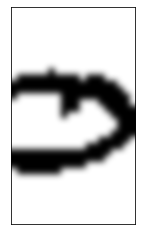

BOUNDARIES OF THE IMAGE :  [65, 0, 22, 35]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (35, 22)
SIZE(NO OF PIXELS) :  770


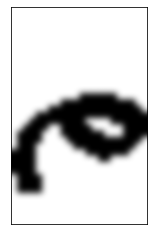

BOUNDARIES OF THE IMAGE :  [0, 0, 16, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 16)
SIZE(NO OF PIXELS) :  544


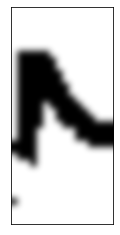

BOUNDARIES OF THE IMAGE :  [16, 0, 14, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 14)
SIZE(NO OF PIXELS) :  476


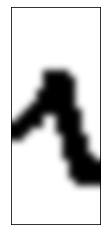

BOUNDARIES OF THE IMAGE :  [30, 0, 20, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 20)
SIZE(NO OF PIXELS) :  680


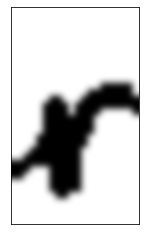

BOUNDARIES OF THE IMAGE :  [0, 0, 25, 44]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (44, 25)
SIZE(NO OF PIXELS) :  1100


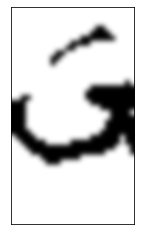

BOUNDARIES OF THE IMAGE :  [25, 0, 23, 44]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (44, 23)
SIZE(NO OF PIXELS) :  1012


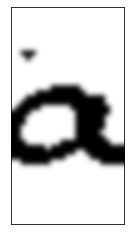

BOUNDARIES OF THE IMAGE :  [48, 0, 12, 44]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (44, 12)
SIZE(NO OF PIXELS) :  528


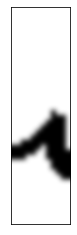

BOUNDARIES OF THE IMAGE :  [60, 0, 8, 44]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (44, 8)
SIZE(NO OF PIXELS) :  352


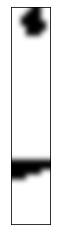

BOUNDARIES OF THE IMAGE :  [78, 0, 28, 44]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (44, 28)
SIZE(NO OF PIXELS) :  1232


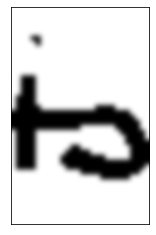

BOUNDARIES OF THE IMAGE :  [0, 0, 15, 44]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (44, 15)
SIZE(NO OF PIXELS) :  660


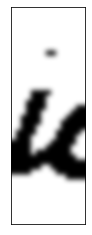

BOUNDARIES OF THE IMAGE :  [15, 0, 14, 44]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (44, 14)
SIZE(NO OF PIXELS) :  616


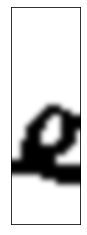

BOUNDARIES OF THE IMAGE :  [29, 0, 29, 44]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (44, 29)
SIZE(NO OF PIXELS) :  1276


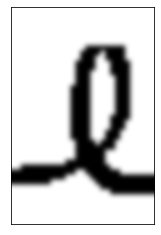

BOUNDARIES OF THE IMAGE :  [58, 0, 20, 44]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (44, 20)
SIZE(NO OF PIXELS) :  880


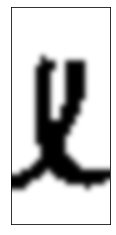

BOUNDARIES OF THE IMAGE :  [0, 0, 14, 37]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (37, 14)
SIZE(NO OF PIXELS) :  518


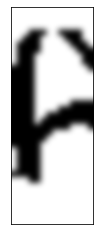

BOUNDARIES OF THE IMAGE :  [14, 0, 14, 37]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (37, 14)
SIZE(NO OF PIXELS) :  518


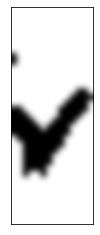

BOUNDARIES OF THE IMAGE :  [0, 0, 17, 37]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (37, 17)
SIZE(NO OF PIXELS) :  629


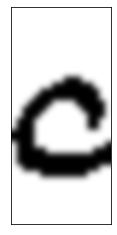

BOUNDARIES OF THE IMAGE :  [17, 0, 26, 37]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (37, 26)
SIZE(NO OF PIXELS) :  962


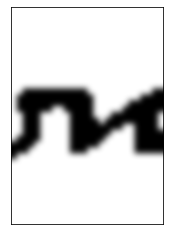

BOUNDARIES OF THE IMAGE :  [43, 0, 14, 37]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (37, 14)
SIZE(NO OF PIXELS) :  518


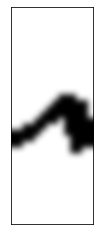

BOUNDARIES OF THE IMAGE :  [73, 0, 9, 51]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (51, 9)
SIZE(NO OF PIXELS) :  459


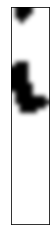

BOUNDARIES OF THE IMAGE :  [0, 0, 22, 51]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (51, 22)
SIZE(NO OF PIXELS) :  1122


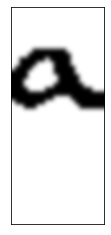

BOUNDARIES OF THE IMAGE :  [22, 0, 40, 51]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (51, 40)
SIZE(NO OF PIXELS) :  2040


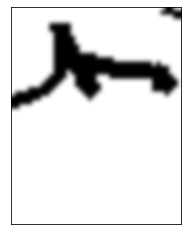

BOUNDARIES OF THE IMAGE :  [0, 0, 22, 51]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (51, 22)
SIZE(NO OF PIXELS) :  1122


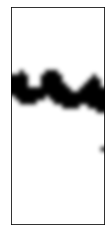

BOUNDARIES OF THE IMAGE :  [22, 0, 26, 51]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (51, 26)
SIZE(NO OF PIXELS) :  1326


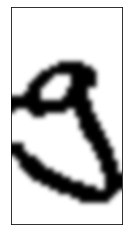

BOUNDARIES OF THE IMAGE :  [0, 0, 22, 48]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (48, 22)
SIZE(NO OF PIXELS) :  1056


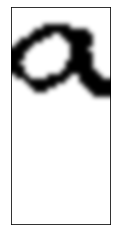

BOUNDARIES OF THE IMAGE :  [0, 0, 24, 48]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (48, 24)
SIZE(NO OF PIXELS) :  1152


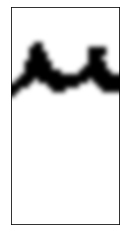

BOUNDARIES OF THE IMAGE :  [24, 0, 27, 48]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (48, 27)
SIZE(NO OF PIXELS) :  1296


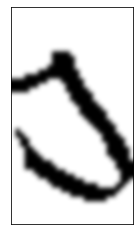

BOUNDARIES OF THE IMAGE :  [0, 0, 2, 30]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (30, 2)
SIZE(NO OF PIXELS) :  60


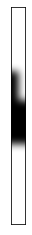

BOUNDARIES OF THE IMAGE :  [2, 0, 10, 30]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (30, 10)
SIZE(NO OF PIXELS) :  300


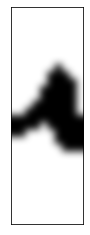

BOUNDARIES OF THE IMAGE :  [12, 0, 13, 30]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (30, 13)
SIZE(NO OF PIXELS) :  390


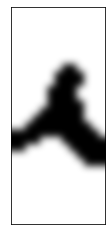

BOUNDARIES OF THE IMAGE :  [25, 0, 21, 30]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (30, 21)
SIZE(NO OF PIXELS) :  630


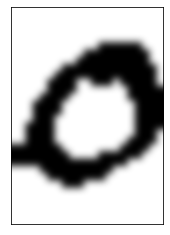

BOUNDARIES OF THE IMAGE :  [0, 0, 22, 30]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (30, 22)
SIZE(NO OF PIXELS) :  660


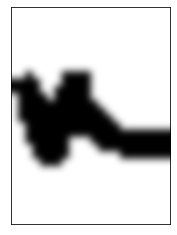

BOUNDARIES OF THE IMAGE :  [22, 0, 23, 30]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (30, 23)
SIZE(NO OF PIXELS) :  690


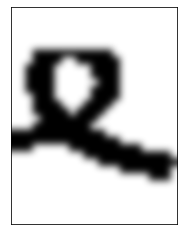

BOUNDARIES OF THE IMAGE :  [7, 0, 19, 36]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (36, 19)
SIZE(NO OF PIXELS) :  684


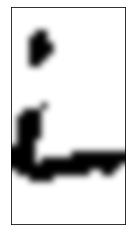

BOUNDARIES OF THE IMAGE :  [0, 0, 28, 36]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (36, 28)
SIZE(NO OF PIXELS) :  1008


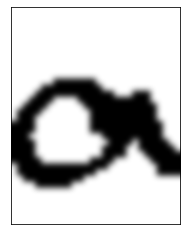

BOUNDARIES OF THE IMAGE :  [28, 0, 12, 36]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (36, 12)
SIZE(NO OF PIXELS) :  432


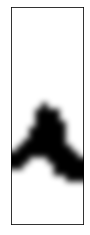

BOUNDARIES OF THE IMAGE :  [0, 0, 15, 36]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (36, 15)
SIZE(NO OF PIXELS) :  540


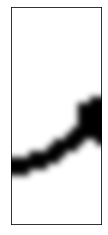

BOUNDARIES OF THE IMAGE :  [15, 0, 16, 36]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (36, 16)
SIZE(NO OF PIXELS) :  576


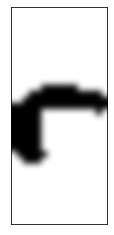

BOUNDARIES OF THE IMAGE :  [0, 0, 5, 37]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (37, 5)
SIZE(NO OF PIXELS) :  185


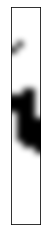

BOUNDARIES OF THE IMAGE :  [5, 0, 6, 37]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (37, 6)
SIZE(NO OF PIXELS) :  222


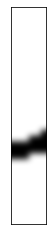

BOUNDARIES OF THE IMAGE :  [11, 0, 15, 37]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (37, 15)
SIZE(NO OF PIXELS) :  555


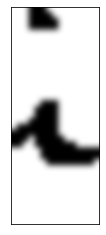

BOUNDARIES OF THE IMAGE :  [0, 0, 15, 37]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (37, 15)
SIZE(NO OF PIXELS) :  555


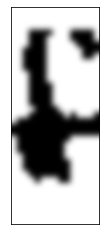

BOUNDARIES OF THE IMAGE :  [0, 0, 18, 37]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (37, 18)
SIZE(NO OF PIXELS) :  666


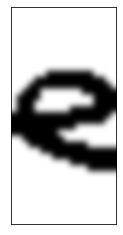

BOUNDARIES OF THE IMAGE :  [18, 0, 15, 37]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (37, 15)
SIZE(NO OF PIXELS) :  555


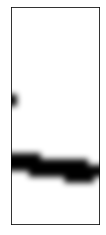

BOUNDARIES OF THE IMAGE :  [0, 0, 35, 47]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (47, 35)
SIZE(NO OF PIXELS) :  1645


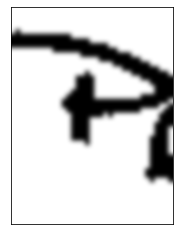

BOUNDARIES OF THE IMAGE :  [35, 0, 31, 47]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (47, 31)
SIZE(NO OF PIXELS) :  1457


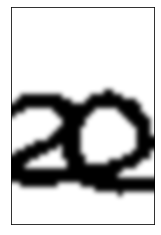

BOUNDARIES OF THE IMAGE :  [66, 0, 30, 47]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (47, 30)
SIZE(NO OF PIXELS) :  1410


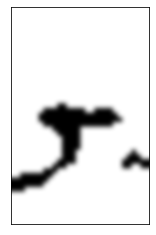

BOUNDARIES OF THE IMAGE :  [96, 0, 13, 47]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (47, 13)
SIZE(NO OF PIXELS) :  611


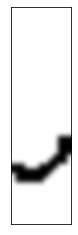

BOUNDARIES OF THE IMAGE :  [0, 0, 11, 25]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (25, 11)
SIZE(NO OF PIXELS) :  275


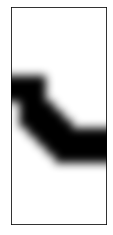

BOUNDARIES OF THE IMAGE :  [0, 0, 10, 25]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (25, 10)
SIZE(NO OF PIXELS) :  250


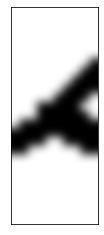

BOUNDARIES OF THE IMAGE :  [10, 0, 12, 25]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (25, 12)
SIZE(NO OF PIXELS) :  300


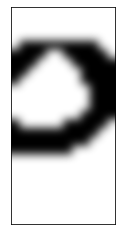

BOUNDARIES OF THE IMAGE :  [8, 0, 12, 30]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (30, 12)
SIZE(NO OF PIXELS) :  360


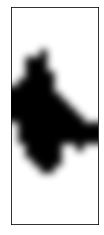

BOUNDARIES OF THE IMAGE :  [0, 0, 12, 30]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (30, 12)
SIZE(NO OF PIXELS) :  360


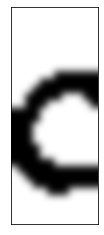

BOUNDARIES OF THE IMAGE :  [12, 0, 11, 30]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (30, 11)
SIZE(NO OF PIXELS) :  330


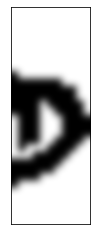

BOUNDARIES OF THE IMAGE :  [0, 0, 15, 37]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (37, 15)
SIZE(NO OF PIXELS) :  555


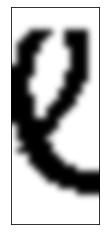

BOUNDARIES OF THE IMAGE :  [15, 0, 9, 37]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (37, 9)
SIZE(NO OF PIXELS) :  333


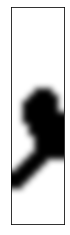

BOUNDARIES OF THE IMAGE :  [24, 0, 25, 37]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (37, 25)
SIZE(NO OF PIXELS) :  925


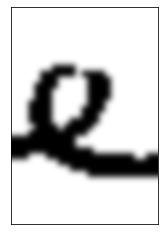

BOUNDARIES OF THE IMAGE :  [0, 0, 19, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 19)
SIZE(NO OF PIXELS) :  608


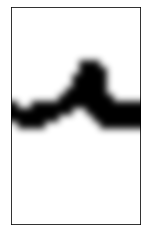

BOUNDARIES OF THE IMAGE :  [19, 0, 15, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 15)
SIZE(NO OF PIXELS) :  480


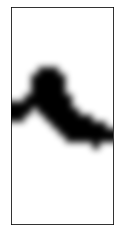

BOUNDARIES OF THE IMAGE :  [0, 0, 12, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 12)
SIZE(NO OF PIXELS) :  384


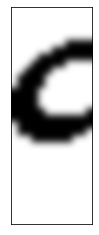

BOUNDARIES OF THE IMAGE :  [12, 0, 17, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 17)
SIZE(NO OF PIXELS) :  544


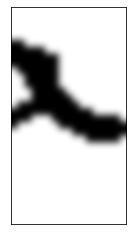

BOUNDARIES OF THE IMAGE :  [0, 0, 13, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 13)
SIZE(NO OF PIXELS) :  416


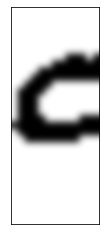

BOUNDARIES OF THE IMAGE :  [13, 0, 14, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 14)
SIZE(NO OF PIXELS) :  448


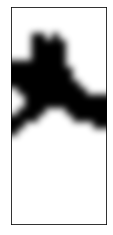

BOUNDARIES OF THE IMAGE :  [27, 0, 25, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 25)
SIZE(NO OF PIXELS) :  800


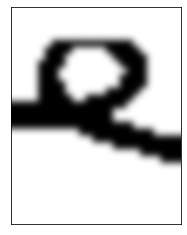

BOUNDARIES OF THE IMAGE :  [52, 0, 13, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 13)
SIZE(NO OF PIXELS) :  416


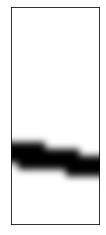

BOUNDARIES OF THE IMAGE :  [0, 0, 21, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 21)
SIZE(NO OF PIXELS) :  693


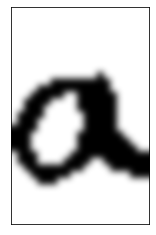

BOUNDARIES OF THE IMAGE :  [21, 0, 19, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 19)
SIZE(NO OF PIXELS) :  627


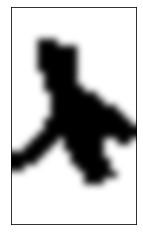

BOUNDARIES OF THE IMAGE :  [0, 0, 17, 25]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (25, 17)
SIZE(NO OF PIXELS) :  425


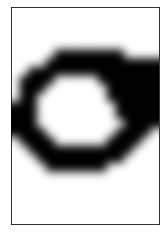

BOUNDARIES OF THE IMAGE :  [17, 0, 11, 25]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (25, 11)
SIZE(NO OF PIXELS) :  275


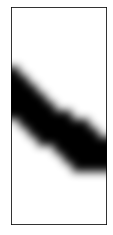

BOUNDARIES OF THE IMAGE :  [0, 0, 32, 51]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (51, 32)
SIZE(NO OF PIXELS) :  1632


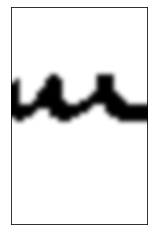

BOUNDARIES OF THE IMAGE :  [32, 0, 37, 51]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (51, 37)
SIZE(NO OF PIXELS) :  1887


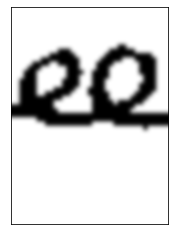

BOUNDARIES OF THE IMAGE :  [69, 0, 38, 51]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (51, 38)
SIZE(NO OF PIXELS) :  1938


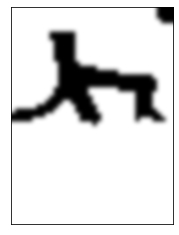

BOUNDARIES OF THE IMAGE :  [114, 0, 24, 51]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (51, 24)
SIZE(NO OF PIXELS) :  1224


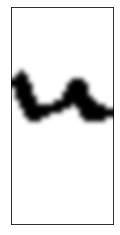

BOUNDARIES OF THE IMAGE :  [141, 0, 32, 51]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (51, 32)
SIZE(NO OF PIXELS) :  1632


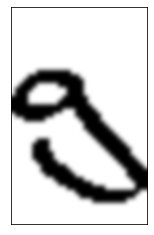

BOUNDARIES OF THE IMAGE :  [0, 0, 19, 41]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (41, 19)
SIZE(NO OF PIXELS) :  779


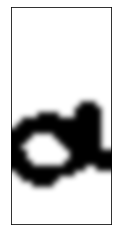

BOUNDARIES OF THE IMAGE :  [19, 0, 23, 41]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (41, 23)
SIZE(NO OF PIXELS) :  943


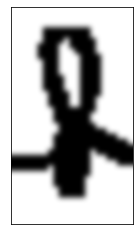

BOUNDARIES OF THE IMAGE :  [6, 0, 18, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 18)
SIZE(NO OF PIXELS) :  684


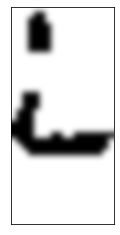

BOUNDARIES OF THE IMAGE :  [0, 0, 21, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 21)
SIZE(NO OF PIXELS) :  798


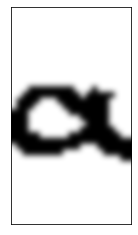

BOUNDARIES OF THE IMAGE :  [0, 0, 15, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 15)
SIZE(NO OF PIXELS) :  570


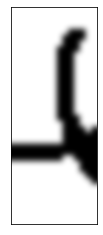

BOUNDARIES OF THE IMAGE :  [15, 0, 27, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 27)
SIZE(NO OF PIXELS) :  1026


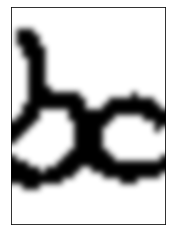

BOUNDARIES OF THE IMAGE :  [63, 0, 12, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 12)
SIZE(NO OF PIXELS) :  456


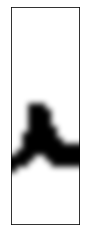

BOUNDARIES OF THE IMAGE :  [75, 0, 19, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 19)
SIZE(NO OF PIXELS) :  722


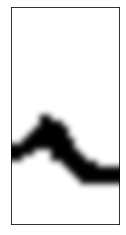

BOUNDARIES OF THE IMAGE :  [94, 0, 16, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 16)
SIZE(NO OF PIXELS) :  608


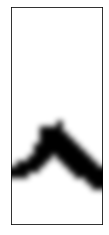

BOUNDARIES OF THE IMAGE :  [110, 0, 15, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 15)
SIZE(NO OF PIXELS) :  570


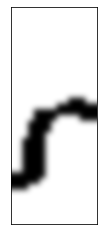

BOUNDARIES OF THE IMAGE :  [9, 0, 25, 43]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (43, 25)
SIZE(NO OF PIXELS) :  1075


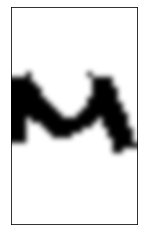

BOUNDARIES OF THE IMAGE :  [44, 0, 28, 43]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (43, 28)
SIZE(NO OF PIXELS) :  1204


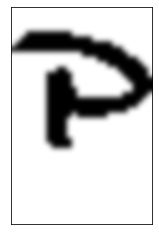

BOUNDARIES OF THE IMAGE :  [78, 0, 20, 43]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (43, 20)
SIZE(NO OF PIXELS) :  860


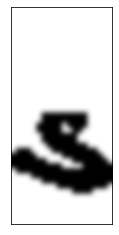

BOUNDARIES OF THE IMAGE :  [0, 0, 16, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 16)
SIZE(NO OF PIXELS) :  544


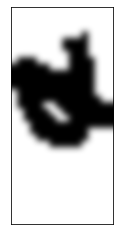

BOUNDARIES OF THE IMAGE :  [0, 0, 16, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 16)
SIZE(NO OF PIXELS) :  544


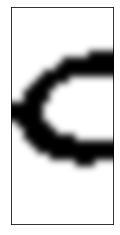

BOUNDARIES OF THE IMAGE :  [16, 0, 14, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 14)
SIZE(NO OF PIXELS) :  476


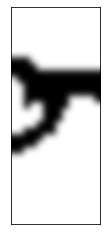

BOUNDARIES OF THE IMAGE :  [30, 0, 17, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 17)
SIZE(NO OF PIXELS) :  578


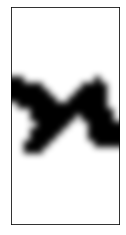

BOUNDARIES OF THE IMAGE :  [63, 0, 20, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 20)
SIZE(NO OF PIXELS) :  680


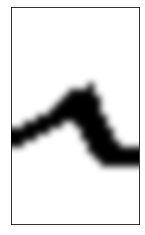

BOUNDARIES OF THE IMAGE :  [83, 0, 26, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 26)
SIZE(NO OF PIXELS) :  884


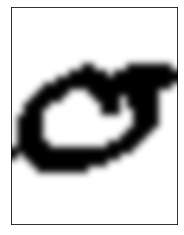

BOUNDARIES OF THE IMAGE :  [117, 0, 18, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 18)
SIZE(NO OF PIXELS) :  612


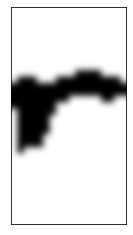

BOUNDARIES OF THE IMAGE :  [218, 0, 6, 34]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (34, 6)
SIZE(NO OF PIXELS) :  204


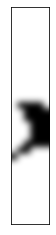

BOUNDARIES OF THE IMAGE :  [3, 0, 1, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 1)
SIZE(NO OF PIXELS) :  33


BOUNDARIES OF THE IMAGE :  [0, 0, 17, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 17)
SIZE(NO OF PIXELS) :  561


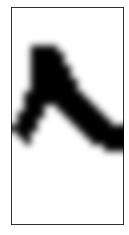

BOUNDARIES OF THE IMAGE :  [17, 0, 2, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 2)
SIZE(NO OF PIXELS) :  66


BOUNDARIES OF THE IMAGE :  [19, 0, 14, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 14)
SIZE(NO OF PIXELS) :  462


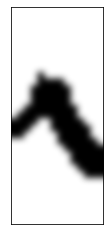

BOUNDARIES OF THE IMAGE :  [33, 0, 14, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 14)
SIZE(NO OF PIXELS) :  462


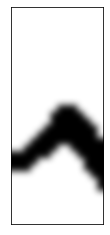

BOUNDARIES OF THE IMAGE :  [47, 0, 17, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 17)
SIZE(NO OF PIXELS) :  561


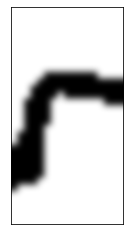

BOUNDARIES OF THE IMAGE :  [0, 0, 17, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 17)
SIZE(NO OF PIXELS) :  544


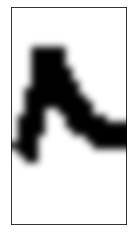

BOUNDARIES OF THE IMAGE :  [17, 0, 14, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 14)
SIZE(NO OF PIXELS) :  448


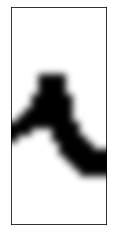

BOUNDARIES OF THE IMAGE :  [31, 0, 15, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 15)
SIZE(NO OF PIXELS) :  480


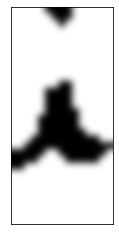

BOUNDARIES OF THE IMAGE :  [0, 0, 16, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 16)
SIZE(NO OF PIXELS) :  512


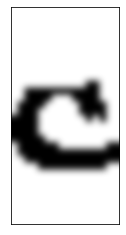

BOUNDARIES OF THE IMAGE :  [16, 0, 14, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 14)
SIZE(NO OF PIXELS) :  448


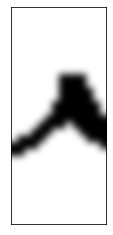

BOUNDARIES OF THE IMAGE :  [30, 0, 5, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 5)
SIZE(NO OF PIXELS) :  160


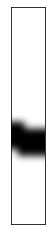

BOUNDARIES OF THE IMAGE :  [35, 0, 16, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 16)
SIZE(NO OF PIXELS) :  512


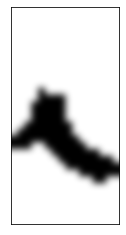

BOUNDARIES OF THE IMAGE :  [158, 0, 11, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 11)
SIZE(NO OF PIXELS) :  352


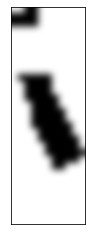

BOUNDARIES OF THE IMAGE :  [0, 0, 28, 42]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (42, 28)
SIZE(NO OF PIXELS) :  1176


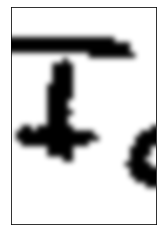

BOUNDARIES OF THE IMAGE :  [0, 0, 16, 42]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (42, 16)
SIZE(NO OF PIXELS) :  672


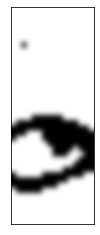

BOUNDARIES OF THE IMAGE :  [16, 0, 21, 42]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (42, 21)
SIZE(NO OF PIXELS) :  882


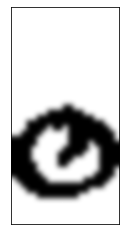

BOUNDARIES OF THE IMAGE :  [73, 0, 17, 42]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (42, 17)
SIZE(NO OF PIXELS) :  714


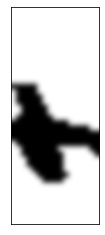

BOUNDARIES OF THE IMAGE :  [5, 0, 18, 31]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (31, 18)
SIZE(NO OF PIXELS) :  558


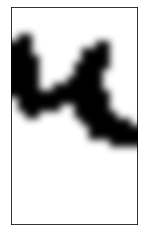

BOUNDARIES OF THE IMAGE :  [0, 0, 16, 31]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (31, 16)
SIZE(NO OF PIXELS) :  496


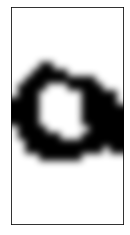

BOUNDARIES OF THE IMAGE :  [16, 0, 13, 31]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (31, 13)
SIZE(NO OF PIXELS) :  403


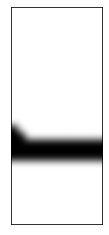

BOUNDARIES OF THE IMAGE :  [29, 0, 18, 31]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (31, 18)
SIZE(NO OF PIXELS) :  558


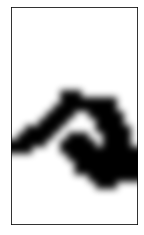

BOUNDARIES OF THE IMAGE :  [9, 0, 19, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 19)
SIZE(NO OF PIXELS) :  722


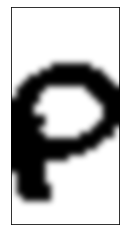

BOUNDARIES OF THE IMAGE :  [0, 0, 8, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 8)
SIZE(NO OF PIXELS) :  304


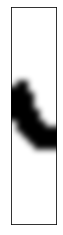

BOUNDARIES OF THE IMAGE :  [8, 0, 18, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 18)
SIZE(NO OF PIXELS) :  684


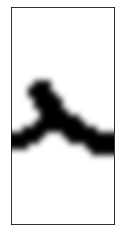

BOUNDARIES OF THE IMAGE :  [0, 0, 15, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 15)
SIZE(NO OF PIXELS) :  570


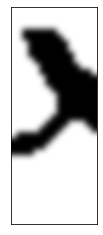

BOUNDARIES OF THE IMAGE :  [15, 0, 16, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 16)
SIZE(NO OF PIXELS) :  608


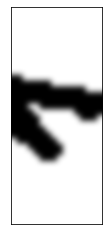

BOUNDARIES OF THE IMAGE :  [0, 0, 13, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 13)
SIZE(NO OF PIXELS) :  429


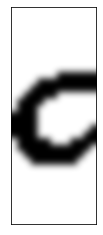

BOUNDARIES OF THE IMAGE :  [13, 0, 14, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 14)
SIZE(NO OF PIXELS) :  462


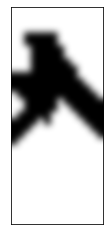

BOUNDARIES OF THE IMAGE :  [27, 0, 24, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 24)
SIZE(NO OF PIXELS) :  792


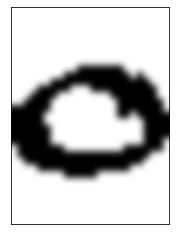

BOUNDARIES OF THE IMAGE :  [0, 0, 8, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 8)
SIZE(NO OF PIXELS) :  264


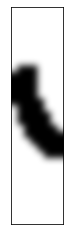

BOUNDARIES OF THE IMAGE :  [8, 0, 14, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 14)
SIZE(NO OF PIXELS) :  462


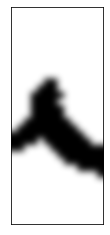

BOUNDARIES OF THE IMAGE :  [22, 0, 13, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 13)
SIZE(NO OF PIXELS) :  429


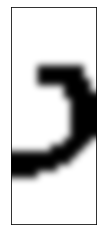

BOUNDARIES OF THE IMAGE :  [98, 0, 20, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 20)
SIZE(NO OF PIXELS) :  660


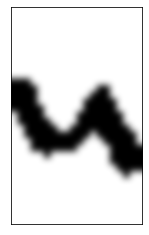

BOUNDARIES OF THE IMAGE :  [0, 0, 15, 26]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (26, 15)
SIZE(NO OF PIXELS) :  390


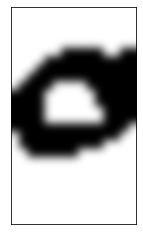

BOUNDARIES OF THE IMAGE :  [15, 0, 11, 26]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (26, 11)
SIZE(NO OF PIXELS) :  286


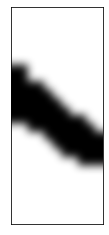

BOUNDARIES OF THE IMAGE :  [0, 0, 18, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 18)
SIZE(NO OF PIXELS) :  594


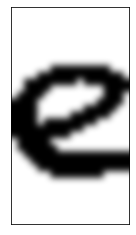

BOUNDARIES OF THE IMAGE :  [0, 0, 13, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 13)
SIZE(NO OF PIXELS) :  429


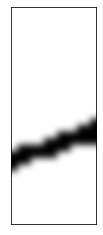

BOUNDARIES OF THE IMAGE :  [13, 0, 14, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 14)
SIZE(NO OF PIXELS) :  462


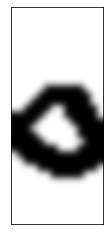

BOUNDARIES OF THE IMAGE :  [0, 0, 13, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 13)
SIZE(NO OF PIXELS) :  429


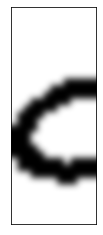

BOUNDARIES OF THE IMAGE :  [13, 0, 12, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 12)
SIZE(NO OF PIXELS) :  396


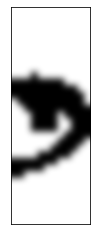

BOUNDARIES OF THE IMAGE :  [0, 0, 17, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 17)
SIZE(NO OF PIXELS) :  561


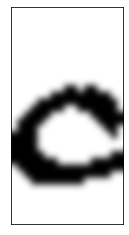

BOUNDARIES OF THE IMAGE :  [17, 0, 17, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 17)
SIZE(NO OF PIXELS) :  561


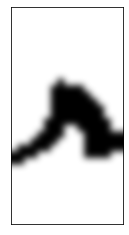

BOUNDARIES OF THE IMAGE :  [34, 0, 15, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 15)
SIZE(NO OF PIXELS) :  495


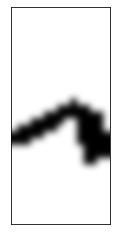

BOUNDARIES OF THE IMAGE :  [0, 0, 14, 25]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (25, 14)
SIZE(NO OF PIXELS) :  350


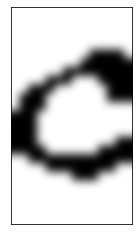

BOUNDARIES OF THE IMAGE :  [14, 0, 13, 25]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (25, 13)
SIZE(NO OF PIXELS) :  325


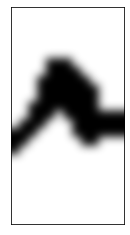

BOUNDARIES OF THE IMAGE :  [27, 0, 10, 25]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (25, 10)
SIZE(NO OF PIXELS) :  250


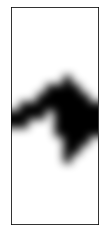

BOUNDARIES OF THE IMAGE :  [8, 0, 16, 35]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (35, 16)
SIZE(NO OF PIXELS) :  560


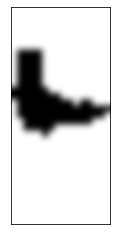

BOUNDARIES OF THE IMAGE :  [0, 0, 17, 35]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (35, 17)
SIZE(NO OF PIXELS) :  595


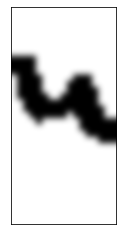

BOUNDARIES OF THE IMAGE :  [0, 0, 20, 35]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (35, 20)
SIZE(NO OF PIXELS) :  700


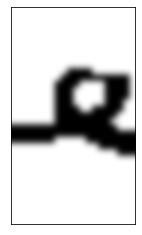

BOUNDARIES OF THE IMAGE :  [20, 0, 17, 35]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (35, 17)
SIZE(NO OF PIXELS) :  595


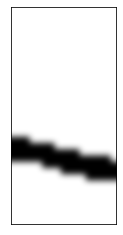

BOUNDARIES OF THE IMAGE :  [0, 0, 23, 53]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (53, 23)
SIZE(NO OF PIXELS) :  1219


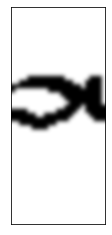

BOUNDARIES OF THE IMAGE :  [0, 0, 21, 53]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (53, 21)
SIZE(NO OF PIXELS) :  1113


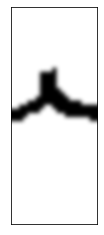

BOUNDARIES OF THE IMAGE :  [21, 0, 29, 53]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (53, 29)
SIZE(NO OF PIXELS) :  1537


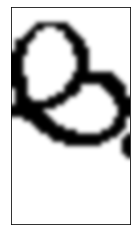

BOUNDARIES OF THE IMAGE :  [73, 0, 42, 53]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (53, 42)
SIZE(NO OF PIXELS) :  2226


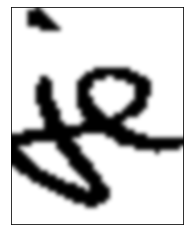

BOUNDARIES OF THE IMAGE :  [0, 0, 21, 53]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (53, 21)
SIZE(NO OF PIXELS) :  1113


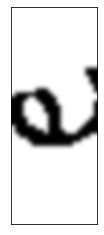

BOUNDARIES OF THE IMAGE :  [21, 0, 21, 53]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (53, 21)
SIZE(NO OF PIXELS) :  1113


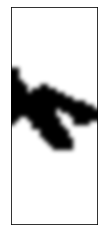

BOUNDARIES OF THE IMAGE :  [0, 0, 25, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 25)
SIZE(NO OF PIXELS) :  825


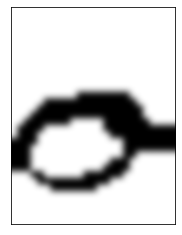

BOUNDARIES OF THE IMAGE :  [25, 0, 2, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 2)
SIZE(NO OF PIXELS) :  66


BOUNDARIES OF THE IMAGE :  [27, 0, 15, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 15)
SIZE(NO OF PIXELS) :  495


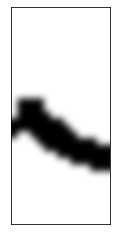

BOUNDARIES OF THE IMAGE :  [42, 0, 8, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 8)
SIZE(NO OF PIXELS) :  264


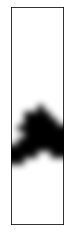

BOUNDARIES OF THE IMAGE :  [50, 0, 8, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 8)
SIZE(NO OF PIXELS) :  264


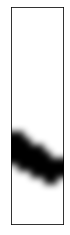

BOUNDARIES OF THE IMAGE :  [0, 0, 20, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 20)
SIZE(NO OF PIXELS) :  660


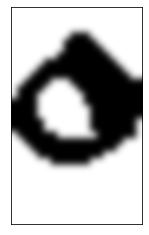

BOUNDARIES OF THE IMAGE :  [20, 0, 15, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 15)
SIZE(NO OF PIXELS) :  495


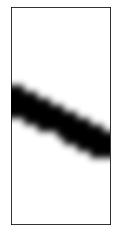

BOUNDARIES OF THE IMAGE :  [0, 0, 21, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 21)
SIZE(NO OF PIXELS) :  672


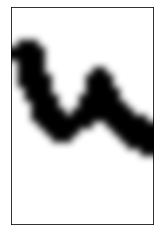

BOUNDARIES OF THE IMAGE :  [0, 0, 22, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 22)
SIZE(NO OF PIXELS) :  704


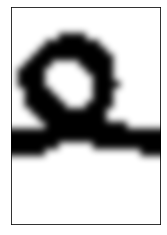

BOUNDARIES OF THE IMAGE :  [22, 0, 15, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 15)
SIZE(NO OF PIXELS) :  480


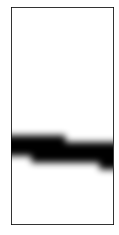

BOUNDARIES OF THE IMAGE :  [0, 0, 5, 28]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (28, 5)
SIZE(NO OF PIXELS) :  140


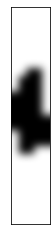

BOUNDARIES OF THE IMAGE :  [5, 0, 21, 28]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (28, 21)
SIZE(NO OF PIXELS) :  588


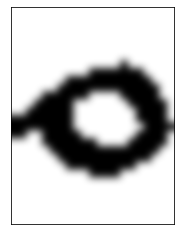

BOUNDARIES OF THE IMAGE :  [7, 0, 16, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 16)
SIZE(NO OF PIXELS) :  512


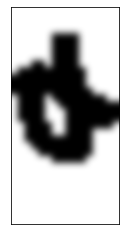

BOUNDARIES OF THE IMAGE :  [0, 0, 12, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 12)
SIZE(NO OF PIXELS) :  384


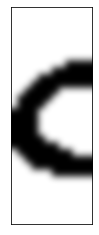

BOUNDARIES OF THE IMAGE :  [12, 0, 10, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 10)
SIZE(NO OF PIXELS) :  320


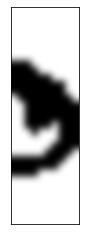

BOUNDARIES OF THE IMAGE :  [0, 0, 17, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 17)
SIZE(NO OF PIXELS) :  646


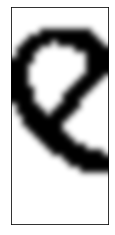

BOUNDARIES OF THE IMAGE :  [0, 0, 26, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 26)
SIZE(NO OF PIXELS) :  988


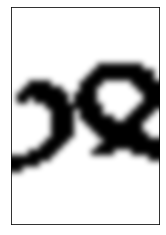

BOUNDARIES OF THE IMAGE :  [26, 0, 19, 38]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (38, 19)
SIZE(NO OF PIXELS) :  722


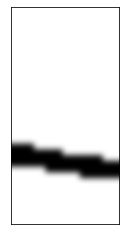

BOUNDARIES OF THE IMAGE :  [8, 0, 22, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 22)
SIZE(NO OF PIXELS) :  726


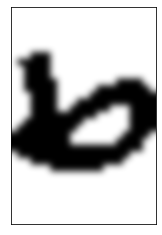

BOUNDARIES OF THE IMAGE :  [0, 0, 13, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 13)
SIZE(NO OF PIXELS) :  429


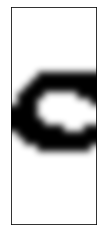

BOUNDARIES OF THE IMAGE :  [13, 0, 14, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 14)
SIZE(NO OF PIXELS) :  462


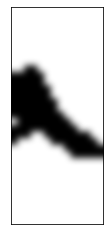

BOUNDARIES OF THE IMAGE :  [0, 0, 17, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 17)
SIZE(NO OF PIXELS) :  561


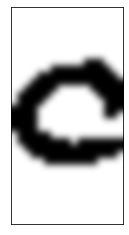

BOUNDARIES OF THE IMAGE :  [17, 0, 16, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 16)
SIZE(NO OF PIXELS) :  528


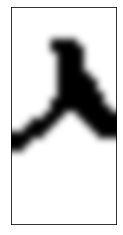

BOUNDARIES OF THE IMAGE :  [33, 0, 11, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 11)
SIZE(NO OF PIXELS) :  363


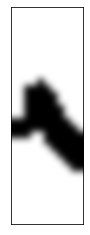

BOUNDARIES OF THE IMAGE :  [44, 0, 22, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 22)
SIZE(NO OF PIXELS) :  726


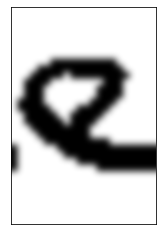

BOUNDARIES OF THE IMAGE :  [0, 0, 13, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 13)
SIZE(NO OF PIXELS) :  429


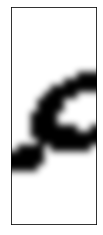

BOUNDARIES OF THE IMAGE :  [13, 0, 22, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 22)
SIZE(NO OF PIXELS) :  726


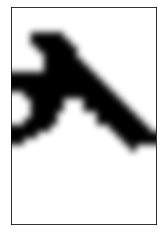

BOUNDARIES OF THE IMAGE :  [8, 0, 19, 39]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (39, 19)
SIZE(NO OF PIXELS) :  741


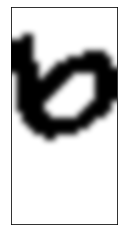

BOUNDARIES OF THE IMAGE :  [34, 0, 24, 39]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (39, 24)
SIZE(NO OF PIXELS) :  936


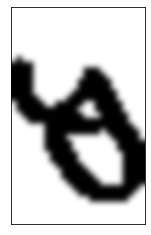

BOUNDARIES OF THE IMAGE :  [0, 0, 15, 31]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (31, 15)
SIZE(NO OF PIXELS) :  465


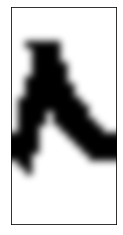

BOUNDARIES OF THE IMAGE :  [15, 0, 17, 31]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (31, 17)
SIZE(NO OF PIXELS) :  527


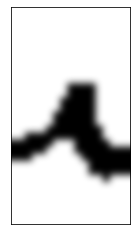

BOUNDARIES OF THE IMAGE :  [32, 0, 24, 31]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (31, 24)
SIZE(NO OF PIXELS) :  744


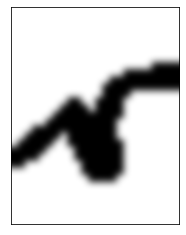

BOUNDARIES OF THE IMAGE :  [0, 0, 7, 31]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (31, 7)
SIZE(NO OF PIXELS) :  217


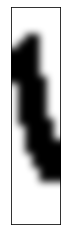

BOUNDARIES OF THE IMAGE :  [7, 0, 13, 31]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (31, 13)
SIZE(NO OF PIXELS) :  403


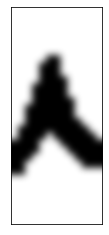

BOUNDARIES OF THE IMAGE :  [20, 0, 11, 31]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (31, 11)
SIZE(NO OF PIXELS) :  341


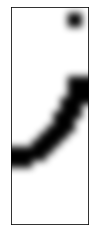

BOUNDARIES OF THE IMAGE :  [54, 0, 4, 31]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (31, 4)
SIZE(NO OF PIXELS) :  124


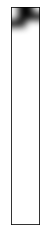

BOUNDARIES OF THE IMAGE :  [65, 0, 18, 31]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (31, 18)
SIZE(NO OF PIXELS) :  558


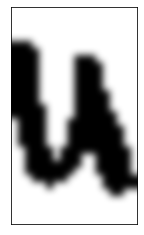

BOUNDARIES OF THE IMAGE :  [80, 0, 26, 43]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (43, 26)
SIZE(NO OF PIXELS) :  1118


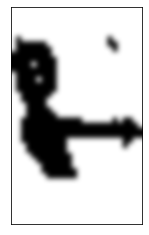

BOUNDARIES OF THE IMAGE :  [0, 0, 17, 43]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (43, 17)
SIZE(NO OF PIXELS) :  731


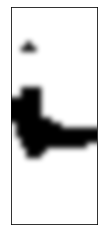

BOUNDARIES OF THE IMAGE :  [17, 0, 22, 43]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (43, 22)
SIZE(NO OF PIXELS) :  946


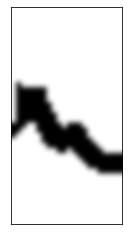

BOUNDARIES OF THE IMAGE :  [39, 0, 26, 43]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (43, 26)
SIZE(NO OF PIXELS) :  1118


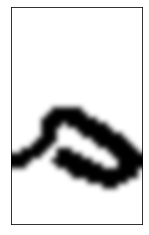

BOUNDARIES OF THE IMAGE :  [0, 0, 15, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 15)
SIZE(NO OF PIXELS) :  495


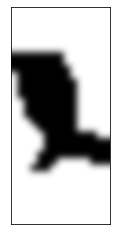

BOUNDARIES OF THE IMAGE :  [15, 0, 15, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 15)
SIZE(NO OF PIXELS) :  495


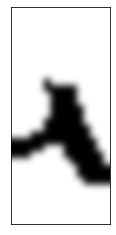

BOUNDARIES OF THE IMAGE :  [0, 0, 18, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 18)
SIZE(NO OF PIXELS) :  576


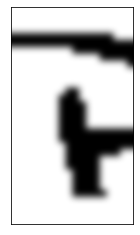

BOUNDARIES OF THE IMAGE :  [18, 0, 13, 32]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (32, 13)
SIZE(NO OF PIXELS) :  416


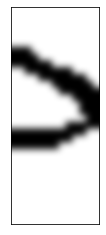

BOUNDARIES OF THE IMAGE :  [7, 0, 17, 35]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (35, 17)
SIZE(NO OF PIXELS) :  595


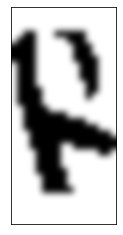

BOUNDARIES OF THE IMAGE :  [0, 0, 20, 35]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (35, 20)
SIZE(NO OF PIXELS) :  700


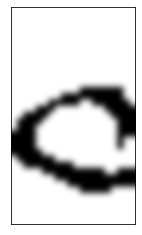

BOUNDARIES OF THE IMAGE :  [20, 0, 10, 35]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (35, 10)
SIZE(NO OF PIXELS) :  350


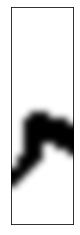

BOUNDARIES OF THE IMAGE :  [30, 0, 20, 35]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (35, 20)
SIZE(NO OF PIXELS) :  700


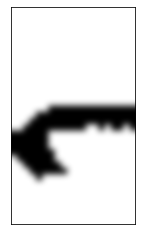

BOUNDARIES OF THE IMAGE :  [0, 0, 12, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 12)
SIZE(NO OF PIXELS) :  396


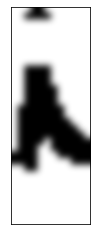

BOUNDARIES OF THE IMAGE :  [12, 0, 19, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 19)
SIZE(NO OF PIXELS) :  627


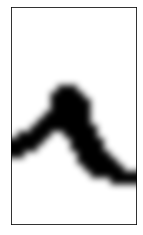

BOUNDARIES OF THE IMAGE :  [0, 0, 23, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 23)
SIZE(NO OF PIXELS) :  759


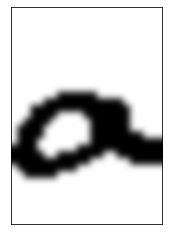

BOUNDARIES OF THE IMAGE :  [23, 0, 13, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 13)
SIZE(NO OF PIXELS) :  429


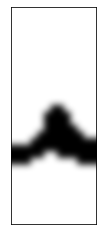

BOUNDARIES OF THE IMAGE :  [36, 0, 12, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 12)
SIZE(NO OF PIXELS) :  396


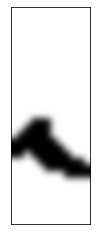

BOUNDARIES OF THE IMAGE :  [225, 0, 5, 33]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (33, 5)
SIZE(NO OF PIXELS) :  165


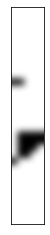

BOUNDARIES OF THE IMAGE :  [6, 0, 18, 40]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (40, 18)
SIZE(NO OF PIXELS) :  720


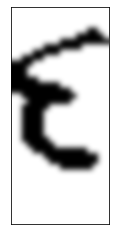

BOUNDARIES OF THE IMAGE :  [31, 0, 3, 40]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (40, 3)
SIZE(NO OF PIXELS) :  120


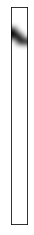

BOUNDARIES OF THE IMAGE :  [0, 0, 16, 40]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (40, 16)
SIZE(NO OF PIXELS) :  640


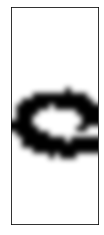

BOUNDARIES OF THE IMAGE :  [0, 0, 18, 40]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (40, 18)
SIZE(NO OF PIXELS) :  720


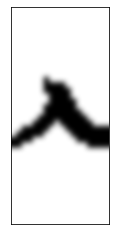

BOUNDARIES OF THE IMAGE :  [18, 0, 19, 40]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (40, 19)
SIZE(NO OF PIXELS) :  760


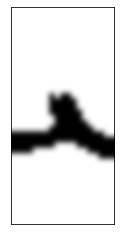

BOUNDARIES OF THE IMAGE :  [0, 0, 24, 40]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (40, 24)
SIZE(NO OF PIXELS) :  960


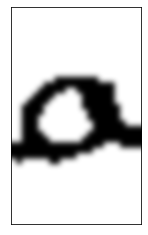

BOUNDARIES OF THE IMAGE :  [24, 0, 30, 40]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (40, 30)
SIZE(NO OF PIXELS) :  1200


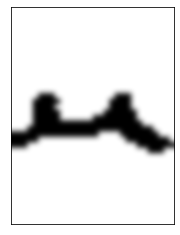

BOUNDARIES OF THE IMAGE :  [0, 0, 19, 40]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (40, 19)
SIZE(NO OF PIXELS) :  760


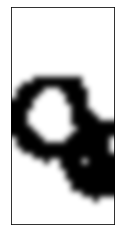

BOUNDARIES OF THE IMAGE :  [0, 0, 16, 40]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (40, 16)
SIZE(NO OF PIXELS) :  640


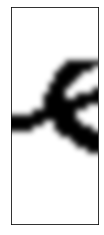

BOUNDARIES OF THE IMAGE :  [16, 0, 19, 40]
IT IS A SINGLE CHARACTER
DIMENSION :  2
SHAPE :  (40, 19)
SIZE(NO OF PIXELS) :  760


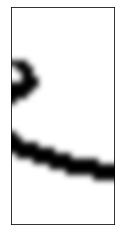

In [27]:
for sen_no in range(len(SENTENCES)):
    for word_no in range(len(WORDS[sen_no])):
        for char_no in range(len(FINAL_CHARACTERS[sen_no][word_no])):
            print('BOUNDARIES OF THE IMAGE : ',FINAL_CHARACTERS[sen_no][word_no][char_no][0])
            if(FINAL_CHARACTERS[sen_no][word_no][char_no][2]==0):
                print("IT IS A SINGLE CHARACTER")
            else:
                print("IT IS A CONNECTED COMPONENT")
            show_image(FINAL_CHARACTERS[sen_no][word_no][char_no][1],cmap='gray')